# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 400
dtc_w2 = 40

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 585ro5qi
Name: kind-cosmos-613
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/585ro5qi
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_085939-585ro5qi/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-ee52abbd-0b5c-5b78-88d5-db2f53701881]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 228,378,453,179,398,300,549,136,472,372,424,368,245,279,49,216,452,288,284,521,249,268,147,53,343,148,111,286,98,85,179,189,49,323,227,168,266,141,85,200,370,462,328,982,139,362,153,197,287,313,220,142,368,261,262,384,316,620,296,286,230,591,232,154,267,330,289,708,355,351,272,374,358,354,117,226,215,161,52,125,206,490,307,277,334,219,154,245,367,169,138,108,257,399,148,152,436,80,154,292,178,386,92,249,192,228,337,124,153,305,285,117,112,337,351,365,266,40,44,207,220,276,74,210,307,238,200,229,289,216,955,272,194,518,286,157,489,352,508,460,201,470,460,268,363,243,365,251,284,293,270,253,250,391,396,260,241,184,145,622,246,234,143,157,179,157,536,259,386,219,274,407,604,427,290,241,236,222,169,186,206,196,195,238,616,348,337,344,377,7134,426,283,202,174,343,178,272,267,158,306

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 48,103,105,53,97,79,138,39,110,91,109,96,56,79,10,48,110,77,64,142,57,67,41,11,67,36,23,78,28,22,51,56,15,89,59,43,65,39,29,37,98,104,87,237,40,113,62,44,68,85,65,36,102,67,67,94,71,167,86,80,60,140,65,29,55,95,65,197,86,94,52,85,93,91,42,58,62,30,19,26,41,140,75,68,92,53,38,50,112,47,37,22,72,95,44,48,116,16,39,76,37,77,34,54,45,46,73,43,30,63,64,23,29,108,76,79,61,14,15,59,58,53,22,44,88,73,37,69,72,47,242,65,47,129,89,35,134,80,118,121,60,101,119,70,88,57,79,51,79,73,69,49,69,109,101,53,57,53,47,148,64,59,33,29,36,45,131,56,94,50,71,105,146,86,82,81,48,69,49,36,58,40,60,67,147,86,75,102,86,1773,104,66,43,37,103,39,59,65,42,97,31,71,51,77,72,117,63,70,78,19,15,36,68,71,30,53,73,73,28,34,69,65,52,72,52,58,73,63,44,77,67,113,57,62,11,49,46,121,140,128,94,77,63,59,212,108,21,5

Epoch 1/1000:   0%|          | 1/1000 [00:23<6:34:33, 23.70s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:23<6:34:33, 23.70s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=133]

Epoch 2/1000:   0%|          | 1/1000 [00:23<6:34:33, 23.70s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=133]

Epoch 2/1000:   0%|          | 2/1000 [00:33<4:13:53, 15.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=133]

Epoch 2/1000:   0%|          | 2/1000 [00:33<4:13:53, 15.26s/it, v_num=qi_1, total_loss_train=1.31e+3, kl_local_train=57.2]

Epoch 3/1000:   0%|          | 2/1000 [00:33<4:13:53, 15.26s/it, v_num=qi_1, total_loss_train=1.31e+3, kl_local_train=57.2]

Epoch 3/1000:   0%|          | 3/1000 [00:42<3:28:57, 12.57s/it, v_num=qi_1, total_loss_train=1.31e+3, kl_local_train=57.2]

Epoch 3/1000:   0%|          | 3/1000 [00:42<3:28:57, 12.57s/it, v_num=qi_1, total_loss_train=1.3e+3, kl_local_train=4.13] 

Epoch 4/1000:   0%|          | 3/1000 [00:42<3:28:57, 12.57s/it, v_num=qi_1, total_loss_train=1.3e+3, kl_local_train=4.13]

Epoch 4/1000:   0%|          | 4/1000 [00:51<3:07:47, 11.31s/it, v_num=qi_1, total_loss_train=1.3e+3, kl_local_train=4.13]

Epoch 4/1000:   0%|          | 4/1000 [00:51<3:07:47, 11.31s/it, v_num=qi_1, total_loss_train=1.29e+3, kl_local_train=1.98]

Epoch 5/1000:   0%|          | 4/1000 [00:51<3:07:47, 11.31s/it, v_num=qi_1, total_loss_train=1.29e+3, kl_local_train=1.98]

Epoch 5/1000:   0%|          | 5/1000 [01:00<2:53:43, 10.48s/it, v_num=qi_1, total_loss_train=1.29e+3, kl_local_train=1.98]

Epoch 5/1000:   0%|          | 5/1000 [01:00<2:53:43, 10.48s/it, v_num=qi_1, total_loss_train=1.27e+3, kl_local_train=35.5]

Epoch 6/1000:   0%|          | 5/1000 [01:00<2:53:43, 10.48s/it, v_num=qi_1, total_loss_train=1.27e+3, kl_local_train=35.5]

Epoch 6/1000:   1%|          | 6/1000 [01:09<2:45:49, 10.01s/it, v_num=qi_1, total_loss_train=1.27e+3, kl_local_train=35.5]

Epoch 6/1000:   1%|          | 6/1000 [01:09<2:45:49, 10.01s/it, v_num=qi_1, total_loss_train=1.26e+3, kl_local_train=31.8]

Epoch 7/1000:   1%|          | 6/1000 [01:09<2:45:49, 10.01s/it, v_num=qi_1, total_loss_train=1.26e+3, kl_local_train=31.8]

Epoch 7/1000:   1%|          | 7/1000 [01:19<2:41:50,  9.78s/it, v_num=qi_1, total_loss_train=1.26e+3, kl_local_train=31.8]

Epoch 7/1000:   1%|          | 7/1000 [01:19<2:41:50,  9.78s/it, v_num=qi_1, total_loss_train=1.24e+3, kl_local_train=34.6]

Epoch 8/1000:   1%|          | 7/1000 [01:19<2:41:50,  9.78s/it, v_num=qi_1, total_loss_train=1.24e+3, kl_local_train=34.6]

Epoch 8/1000:   1%|          | 8/1000 [01:28<2:41:08,  9.75s/it, v_num=qi_1, total_loss_train=1.24e+3, kl_local_train=34.6]

Epoch 8/1000:   1%|          | 8/1000 [01:28<2:41:08,  9.75s/it, v_num=qi_1, total_loss_train=1.23e+3, kl_local_train=35.7]

Epoch 9/1000:   1%|          | 8/1000 [01:28<2:41:08,  9.75s/it, v_num=qi_1, total_loss_train=1.23e+3, kl_local_train=35.7]

Epoch 9/1000:   1%|          | 9/1000 [01:38<2:40:30,  9.72s/it, v_num=qi_1, total_loss_train=1.23e+3, kl_local_train=35.7]

Epoch 9/1000:   1%|          | 9/1000 [01:38<2:40:30,  9.72s/it, v_num=qi_1, total_loss_train=1.22e+3, kl_local_train=40.1]

Epoch 10/1000:   1%|          | 9/1000 [01:38<2:40:30,  9.72s/it, v_num=qi_1, total_loss_train=1.22e+3, kl_local_train=40.1]

Epoch 10/1000:   1%|          | 10/1000 [01:47<2:36:19,  9.47s/it, v_num=qi_1, total_loss_train=1.22e+3, kl_local_train=40.1]

Epoch 10/1000:   1%|          | 10/1000 [01:47<2:36:19,  9.47s/it, v_num=qi_1, total_loss_train=1.21e+3, kl_local_train=38.1]

Epoch 11/1000:   1%|          | 10/1000 [01:47<2:36:19,  9.47s/it, v_num=qi_1, total_loss_train=1.21e+3, kl_local_train=38.1]

Epoch 11/1000:   1%|          | 11/1000 [01:57<2:36:59,  9.52s/it, v_num=qi_1, total_loss_train=1.21e+3, kl_local_train=38.1]

Epoch 11/1000:   1%|          | 11/1000 [01:57<2:36:59,  9.52s/it, v_num=qi_1, total_loss_train=1.2e+3, kl_local_train=38.7] 

Epoch 12/1000:   1%|          | 11/1000 [01:57<2:36:59,  9.52s/it, v_num=qi_1, total_loss_train=1.2e+3, kl_local_train=38.7]

Epoch 12/1000:   1%|          | 12/1000 [02:06<2:35:52,  9.47s/it, v_num=qi_1, total_loss_train=1.2e+3, kl_local_train=38.7]

Epoch 12/1000:   1%|          | 12/1000 [02:06<2:35:52,  9.47s/it, v_num=qi_1, total_loss_train=1.19e+3, kl_local_train=40.1]

Epoch 13/1000:   1%|          | 12/1000 [02:06<2:35:52,  9.47s/it, v_num=qi_1, total_loss_train=1.19e+3, kl_local_train=40.1]

Epoch 13/1000:   1%|▏         | 13/1000 [02:15<2:34:41,  9.40s/it, v_num=qi_1, total_loss_train=1.19e+3, kl_local_train=40.1]

Epoch 13/1000:   1%|▏         | 13/1000 [02:15<2:34:41,  9.40s/it, v_num=qi_1, total_loss_train=1.19e+3, kl_local_train=40]  

Epoch 14/1000:   1%|▏         | 13/1000 [02:15<2:34:41,  9.40s/it, v_num=qi_1, total_loss_train=1.19e+3, kl_local_train=40]

Epoch 14/1000:   1%|▏         | 14/1000 [02:24<2:33:28,  9.34s/it, v_num=qi_1, total_loss_train=1.19e+3, kl_local_train=40]

Epoch 14/1000:   1%|▏         | 14/1000 [02:24<2:33:28,  9.34s/it, v_num=qi_1, total_loss_train=1.19e+3, kl_local_train=41.5]

Epoch 15/1000:   1%|▏         | 14/1000 [02:24<2:33:28,  9.34s/it, v_num=qi_1, total_loss_train=1.19e+3, kl_local_train=41.5]

Epoch 15/1000:   2%|▏         | 15/1000 [02:34<2:34:16,  9.40s/it, v_num=qi_1, total_loss_train=1.19e+3, kl_local_train=41.5]

Epoch 15/1000:   2%|▏         | 15/1000 [02:34<2:34:16,  9.40s/it, v_num=qi_1, total_loss_train=1.2e+3, kl_local_train=48.9] 

Epoch 16/1000:   2%|▏         | 15/1000 [02:34<2:34:16,  9.40s/it, v_num=qi_1, total_loss_train=1.2e+3, kl_local_train=48.9]

Epoch 16/1000:   2%|▏         | 16/1000 [02:43<2:33:33,  9.36s/it, v_num=qi_1, total_loss_train=1.2e+3, kl_local_train=48.9]

Epoch 16/1000:   2%|▏         | 16/1000 [02:43<2:33:33,  9.36s/it, v_num=qi_1, total_loss_train=1.2e+3, kl_local_train=52.5]

Epoch 17/1000:   2%|▏         | 16/1000 [02:43<2:33:33,  9.36s/it, v_num=qi_1, total_loss_train=1.2e+3, kl_local_train=52.5]

Epoch 17/1000:   2%|▏         | 17/1000 [02:53<2:33:32,  9.37s/it, v_num=qi_1, total_loss_train=1.2e+3, kl_local_train=52.5]

Epoch 17/1000:   2%|▏         | 17/1000 [02:53<2:33:32,  9.37s/it, v_num=qi_1, total_loss_train=1.21e+3, kl_local_train=55.9]

Epoch 18/1000:   2%|▏         | 17/1000 [02:53<2:33:32,  9.37s/it, v_num=qi_1, total_loss_train=1.21e+3, kl_local_train=55.9]

Epoch 18/1000:   2%|▏         | 18/1000 [03:02<2:34:38,  9.45s/it, v_num=qi_1, total_loss_train=1.21e+3, kl_local_train=55.9]

Epoch 18/1000:   2%|▏         | 18/1000 [03:02<2:34:38,  9.45s/it, v_num=qi_1, total_loss_train=1.22e+3, kl_local_train=58.7]

Epoch 19/1000:   2%|▏         | 18/1000 [03:02<2:34:38,  9.45s/it, v_num=qi_1, total_loss_train=1.22e+3, kl_local_train=58.7]

Epoch 19/1000:   2%|▏         | 19/1000 [03:11<2:32:05,  9.30s/it, v_num=qi_1, total_loss_train=1.22e+3, kl_local_train=58.7]

Epoch 19/1000:   2%|▏         | 19/1000 [03:11<2:32:05,  9.30s/it, v_num=qi_1, total_loss_train=1.22e+3, kl_local_train=63.8]

Epoch 20/1000:   2%|▏         | 19/1000 [03:11<2:32:05,  9.30s/it, v_num=qi_1, total_loss_train=1.22e+3, kl_local_train=63.8]

Epoch 20/1000:   2%|▏         | 20/1000 [03:21<2:33:22,  9.39s/it, v_num=qi_1, total_loss_train=1.22e+3, kl_local_train=63.8]

Epoch 20/1000:   2%|▏         | 20/1000 [03:21<2:33:22,  9.39s/it, v_num=qi_1, total_loss_train=1.23e+3, kl_local_train=64.4]

Epoch 21/1000:   2%|▏         | 20/1000 [03:21<2:33:22,  9.39s/it, v_num=qi_1, total_loss_train=1.23e+3, kl_local_train=64.4]

Epoch 21/1000:   2%|▏         | 21/1000 [03:30<2:31:09,  9.26s/it, v_num=qi_1, total_loss_train=1.23e+3, kl_local_train=64.4]

Epoch 21/1000:   2%|▏         | 21/1000 [03:30<2:31:09,  9.26s/it, v_num=qi_1, total_loss_train=1.24e+3, kl_local_train=70.6]

Epoch 22/1000:   2%|▏         | 21/1000 [03:30<2:31:09,  9.26s/it, v_num=qi_1, total_loss_train=1.24e+3, kl_local_train=70.6]

Epoch 22/1000:   2%|▏         | 22/1000 [03:39<2:30:48,  9.25s/it, v_num=qi_1, total_loss_train=1.24e+3, kl_local_train=70.6]

Epoch 22/1000:   2%|▏         | 22/1000 [03:39<2:30:48,  9.25s/it, v_num=qi_1, total_loss_train=1.25e+3, kl_local_train=71.4]

Epoch 23/1000:   2%|▏         | 22/1000 [03:39<2:30:48,  9.25s/it, v_num=qi_1, total_loss_train=1.25e+3, kl_local_train=71.4]

Epoch 23/1000:   2%|▏         | 23/1000 [03:48<2:30:49,  9.26s/it, v_num=qi_1, total_loss_train=1.25e+3, kl_local_train=71.4]

Epoch 23/1000:   2%|▏         | 23/1000 [03:48<2:30:49,  9.26s/it, v_num=qi_1, total_loss_train=1.26e+3, kl_local_train=75.1]

Epoch 24/1000:   2%|▏         | 23/1000 [03:48<2:30:49,  9.26s/it, v_num=qi_1, total_loss_train=1.26e+3, kl_local_train=75.1]

Epoch 24/1000:   2%|▏         | 24/1000 [03:57<2:28:56,  9.16s/it, v_num=qi_1, total_loss_train=1.26e+3, kl_local_train=75.1]

Epoch 24/1000:   2%|▏         | 24/1000 [03:57<2:28:56,  9.16s/it, v_num=qi_1, total_loss_train=1.27e+3, kl_local_train=75.1]

Epoch 25/1000:   2%|▏         | 24/1000 [03:57<2:28:56,  9.16s/it, v_num=qi_1, total_loss_train=1.27e+3, kl_local_train=75.1]

Epoch 25/1000:   2%|▎         | 25/1000 [04:06<2:29:35,  9.21s/it, v_num=qi_1, total_loss_train=1.27e+3, kl_local_train=75.1]

Epoch 25/1000:   2%|▎         | 25/1000 [04:06<2:29:35,  9.21s/it, v_num=qi_1, total_loss_train=1.28e+3, kl_local_train=77.5]

Epoch 26/1000:   2%|▎         | 25/1000 [04:07<2:29:35,  9.21s/it, v_num=qi_1, total_loss_train=1.28e+3, kl_local_train=77.5]

Epoch 26/1000:   3%|▎         | 26/1000 [04:16<2:32:38,  9.40s/it, v_num=qi_1, total_loss_train=1.28e+3, kl_local_train=77.5]

Epoch 26/1000:   3%|▎         | 26/1000 [04:16<2:32:38,  9.40s/it, v_num=qi_1, total_loss_train=1.28e+3, kl_local_train=78.5]

Epoch 27/1000:   3%|▎         | 26/1000 [04:16<2:32:38,  9.40s/it, v_num=qi_1, total_loss_train=1.28e+3, kl_local_train=78.5]

Epoch 27/1000:   3%|▎         | 27/1000 [04:25<2:31:00,  9.31s/it, v_num=qi_1, total_loss_train=1.28e+3, kl_local_train=78.5]

Epoch 27/1000:   3%|▎         | 27/1000 [04:25<2:31:00,  9.31s/it, v_num=qi_1, total_loss_train=1.29e+3, kl_local_train=80]  

Epoch 28/1000:   3%|▎         | 27/1000 [04:25<2:31:00,  9.31s/it, v_num=qi_1, total_loss_train=1.29e+3, kl_local_train=80]

Epoch 28/1000:   3%|▎         | 28/1000 [04:35<2:31:39,  9.36s/it, v_num=qi_1, total_loss_train=1.29e+3, kl_local_train=80]

Epoch 28/1000:   3%|▎         | 28/1000 [04:35<2:31:39,  9.36s/it, v_num=qi_1, total_loss_train=1.3e+3, kl_local_train=83.4]

Epoch 29/1000:   3%|▎         | 28/1000 [04:35<2:31:39,  9.36s/it, v_num=qi_1, total_loss_train=1.3e+3, kl_local_train=83.4]

Epoch 29/1000:   3%|▎         | 29/1000 [04:45<2:32:54,  9.45s/it, v_num=qi_1, total_loss_train=1.3e+3, kl_local_train=83.4]

Epoch 29/1000:   3%|▎         | 29/1000 [04:45<2:32:54,  9.45s/it, v_num=qi_1, total_loss_train=1.31e+3, kl_local_train=82.6]

Epoch 30/1000:   3%|▎         | 29/1000 [04:45<2:32:54,  9.45s/it, v_num=qi_1, total_loss_train=1.31e+3, kl_local_train=82.6]

Epoch 30/1000:   3%|▎         | 30/1000 [04:54<2:34:12,  9.54s/it, v_num=qi_1, total_loss_train=1.31e+3, kl_local_train=82.6]

Epoch 30/1000:   3%|▎         | 30/1000 [04:54<2:34:12,  9.54s/it, v_num=qi_1, total_loss_train=1.32e+3, kl_local_train=88.5]

Epoch 31/1000:   3%|▎         | 30/1000 [04:54<2:34:12,  9.54s/it, v_num=qi_1, total_loss_train=1.32e+3, kl_local_train=88.5]

Epoch 31/1000:   3%|▎         | 31/1000 [05:04<2:34:21,  9.56s/it, v_num=qi_1, total_loss_train=1.32e+3, kl_local_train=88.5]

Epoch 31/1000:   3%|▎         | 31/1000 [05:04<2:34:21,  9.56s/it, v_num=qi_1, total_loss_train=1.33e+3, kl_local_train=82.5]

Epoch 32/1000:   3%|▎         | 31/1000 [05:04<2:34:21,  9.56s/it, v_num=qi_1, total_loss_train=1.33e+3, kl_local_train=82.5]

Epoch 32/1000:   3%|▎         | 32/1000 [05:14<2:35:32,  9.64s/it, v_num=qi_1, total_loss_train=1.33e+3, kl_local_train=82.5]

Epoch 32/1000:   3%|▎         | 32/1000 [05:14<2:35:32,  9.64s/it, v_num=qi_1, total_loss_train=1.34e+3, kl_local_train=98.8]

Epoch 33/1000:   3%|▎         | 32/1000 [05:14<2:35:32,  9.64s/it, v_num=qi_1, total_loss_train=1.34e+3, kl_local_train=98.8]

Epoch 33/1000:   3%|▎         | 33/1000 [05:23<2:35:10,  9.63s/it, v_num=qi_1, total_loss_train=1.34e+3, kl_local_train=98.8]

Epoch 33/1000:   3%|▎         | 33/1000 [05:23<2:35:10,  9.63s/it, v_num=qi_1, total_loss_train=1.35e+3, kl_local_train=95.7]

Epoch 34/1000:   3%|▎         | 33/1000 [05:23<2:35:10,  9.63s/it, v_num=qi_1, total_loss_train=1.35e+3, kl_local_train=95.7]

Epoch 34/1000:   3%|▎         | 34/1000 [05:33<2:34:38,  9.60s/it, v_num=qi_1, total_loss_train=1.35e+3, kl_local_train=95.7]

Epoch 34/1000:   3%|▎         | 34/1000 [05:33<2:34:38,  9.60s/it, v_num=qi_1, total_loss_train=1.36e+3, kl_local_train=91.1]

Epoch 35/1000:   3%|▎         | 34/1000 [05:33<2:34:38,  9.60s/it, v_num=qi_1, total_loss_train=1.36e+3, kl_local_train=91.1]

Epoch 35/1000:   4%|▎         | 35/1000 [05:42<2:32:24,  9.48s/it, v_num=qi_1, total_loss_train=1.36e+3, kl_local_train=91.1]

Epoch 35/1000:   4%|▎         | 35/1000 [05:42<2:32:24,  9.48s/it, v_num=qi_1, total_loss_train=1.37e+3, kl_local_train=89.7]

Epoch 36/1000:   4%|▎         | 35/1000 [05:42<2:32:24,  9.48s/it, v_num=qi_1, total_loss_train=1.37e+3, kl_local_train=89.7]

Epoch 36/1000:   4%|▎         | 36/1000 [05:51<2:30:43,  9.38s/it, v_num=qi_1, total_loss_train=1.37e+3, kl_local_train=89.7]

Epoch 36/1000:   4%|▎         | 36/1000 [05:51<2:30:43,  9.38s/it, v_num=qi_1, total_loss_train=1.38e+3, kl_local_train=96.7]

Epoch 37/1000:   4%|▎         | 36/1000 [05:51<2:30:43,  9.38s/it, v_num=qi_1, total_loss_train=1.38e+3, kl_local_train=96.7]

Epoch 37/1000:   4%|▎         | 37/1000 [06:01<2:30:53,  9.40s/it, v_num=qi_1, total_loss_train=1.38e+3, kl_local_train=96.7]

Epoch 37/1000:   4%|▎         | 37/1000 [06:01<2:30:53,  9.40s/it, v_num=qi_1, total_loss_train=1.39e+3, kl_local_train=92.2]

Epoch 38/1000:   4%|▎         | 37/1000 [06:01<2:30:53,  9.40s/it, v_num=qi_1, total_loss_train=1.39e+3, kl_local_train=92.2]

Epoch 38/1000:   4%|▍         | 38/1000 [06:10<2:32:05,  9.49s/it, v_num=qi_1, total_loss_train=1.39e+3, kl_local_train=92.2]

Epoch 38/1000:   4%|▍         | 38/1000 [06:10<2:32:05,  9.49s/it, v_num=qi_1, total_loss_train=1.4e+3, kl_local_train=97.8] 

Epoch 39/1000:   4%|▍         | 38/1000 [06:10<2:32:05,  9.49s/it, v_num=qi_1, total_loss_train=1.4e+3, kl_local_train=97.8]

Epoch 39/1000:   4%|▍         | 39/1000 [06:20<2:31:54,  9.48s/it, v_num=qi_1, total_loss_train=1.4e+3, kl_local_train=97.8]

Epoch 39/1000:   4%|▍         | 39/1000 [06:20<2:31:54,  9.48s/it, v_num=qi_1, total_loss_train=1.41e+3, kl_local_train=89.9]

Epoch 40/1000:   4%|▍         | 39/1000 [06:20<2:31:54,  9.48s/it, v_num=qi_1, total_loss_train=1.41e+3, kl_local_train=89.9]

Epoch 40/1000:   4%|▍         | 40/1000 [06:30<2:32:38,  9.54s/it, v_num=qi_1, total_loss_train=1.41e+3, kl_local_train=89.9]

Epoch 40/1000:   4%|▍         | 40/1000 [06:30<2:32:38,  9.54s/it, v_num=qi_1, total_loss_train=1.42e+3, kl_local_train=93.8]

Epoch 41/1000:   4%|▍         | 40/1000 [06:30<2:32:38,  9.54s/it, v_num=qi_1, total_loss_train=1.42e+3, kl_local_train=93.8]

Epoch 41/1000:   4%|▍         | 41/1000 [06:39<2:32:06,  9.52s/it, v_num=qi_1, total_loss_train=1.42e+3, kl_local_train=93.8]

Epoch 41/1000:   4%|▍         | 41/1000 [06:39<2:32:06,  9.52s/it, v_num=qi_1, total_loss_train=1.43e+3, kl_local_train=94.3]

Epoch 42/1000:   4%|▍         | 41/1000 [06:39<2:32:06,  9.52s/it, v_num=qi_1, total_loss_train=1.43e+3, kl_local_train=94.3]

Epoch 42/1000:   4%|▍         | 42/1000 [06:48<2:31:02,  9.46s/it, v_num=qi_1, total_loss_train=1.43e+3, kl_local_train=94.3]

Epoch 42/1000:   4%|▍         | 42/1000 [06:48<2:31:02,  9.46s/it, v_num=qi_1, total_loss_train=1.44e+3, kl_local_train=91.5]

Epoch 43/1000:   4%|▍         | 42/1000 [06:48<2:31:02,  9.46s/it, v_num=qi_1, total_loss_train=1.44e+3, kl_local_train=91.5]

Epoch 43/1000:   4%|▍         | 43/1000 [06:58<2:30:27,  9.43s/it, v_num=qi_1, total_loss_train=1.44e+3, kl_local_train=91.5]

Epoch 43/1000:   4%|▍         | 43/1000 [06:58<2:30:27,  9.43s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=97.4]

Epoch 44/1000:   4%|▍         | 43/1000 [06:58<2:30:27,  9.43s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=97.4]

Epoch 44/1000:   4%|▍         | 44/1000 [07:07<2:31:19,  9.50s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=97.4]

Epoch 44/1000:   4%|▍         | 44/1000 [07:07<2:31:19,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=102] 

Epoch 45/1000:   4%|▍         | 44/1000 [07:07<2:31:19,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=102]

Epoch 45/1000:   4%|▍         | 45/1000 [07:17<2:31:42,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=102]

Epoch 45/1000:   4%|▍         | 45/1000 [07:17<2:31:42,  9.53s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=95.8]

Epoch 46/1000:   4%|▍         | 45/1000 [07:17<2:31:42,  9.53s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=95.8]

Epoch 46/1000:   5%|▍         | 46/1000 [07:27<2:32:35,  9.60s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=95.8]

Epoch 46/1000:   5%|▍         | 46/1000 [07:27<2:32:35,  9.60s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=101] 

Epoch 47/1000:   5%|▍         | 46/1000 [07:27<2:32:35,  9.60s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=101]

Epoch 47/1000:   5%|▍         | 47/1000 [07:36<2:30:29,  9.47s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=101]

Epoch 47/1000:   5%|▍         | 47/1000 [07:36<2:30:29,  9.47s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=103]

Epoch 48/1000:   5%|▍         | 47/1000 [07:36<2:30:29,  9.47s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=103]

Epoch 48/1000:   5%|▍         | 48/1000 [07:45<2:28:28,  9.36s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=103]

Epoch 48/1000:   5%|▍         | 48/1000 [07:45<2:28:28,  9.36s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=99.7]

Epoch 49/1000:   5%|▍         | 48/1000 [07:45<2:28:28,  9.36s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=99.7]

Epoch 49/1000:   5%|▍         | 49/1000 [07:54<2:27:09,  9.28s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=99.7]

Epoch 49/1000:   5%|▍         | 49/1000 [07:54<2:27:09,  9.28s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=95.3]

Epoch 50/1000:   5%|▍         | 49/1000 [07:54<2:27:09,  9.28s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=95.3]

Epoch 50/1000:   5%|▌         | 50/1000 [08:03<2:25:57,  9.22s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=95.3]

Epoch 50/1000:   5%|▌         | 50/1000 [08:03<2:25:57,  9.22s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=91.6]

Epoch 51/1000:   5%|▌         | 50/1000 [08:03<2:25:57,  9.22s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=91.6]

Epoch 51/1000:   5%|▌         | 51/1000 [08:13<2:30:02,  9.49s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=91.6]

Epoch 51/1000:   5%|▌         | 51/1000 [08:13<2:30:02,  9.49s/it, v_num=qi_1, total_loss_train=1.52e+3, kl_local_train=95.6]

Epoch 52/1000:   5%|▌         | 51/1000 [08:13<2:30:02,  9.49s/it, v_num=qi_1, total_loss_train=1.52e+3, kl_local_train=95.6]

Epoch 52/1000:   5%|▌         | 52/1000 [08:23<2:29:57,  9.49s/it, v_num=qi_1, total_loss_train=1.52e+3, kl_local_train=95.6]

Epoch 52/1000:   5%|▌         | 52/1000 [08:23<2:29:57,  9.49s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=92.8]

Epoch 53/1000:   5%|▌         | 52/1000 [08:23<2:29:57,  9.49s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=92.8]

Epoch 53/1000:   5%|▌         | 53/1000 [08:32<2:28:35,  9.41s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=92.8]

Epoch 53/1000:   5%|▌         | 53/1000 [08:32<2:28:35,  9.41s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=86.8]

Epoch 54/1000:   5%|▌         | 53/1000 [08:32<2:28:35,  9.41s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=86.8]

Epoch 54/1000:   5%|▌         | 54/1000 [08:41<2:27:06,  9.33s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=86.8]

Epoch 54/1000:   5%|▌         | 54/1000 [08:41<2:27:06,  9.33s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=93.6]

Epoch 55/1000:   5%|▌         | 54/1000 [08:41<2:27:06,  9.33s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=93.6]

Epoch 55/1000:   6%|▌         | 55/1000 [08:51<2:28:04,  9.40s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=93.6]

Epoch 55/1000:   6%|▌         | 55/1000 [08:51<2:28:04,  9.40s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=90.8]

Epoch 56/1000:   6%|▌         | 55/1000 [08:51<2:28:04,  9.40s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=90.8]

Epoch 56/1000:   6%|▌         | 56/1000 [09:00<2:27:33,  9.38s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=90.8]

Epoch 56/1000:   6%|▌         | 56/1000 [09:00<2:27:33,  9.38s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=87.1]

Epoch 57/1000:   6%|▌         | 56/1000 [09:00<2:27:33,  9.38s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=87.1]

Epoch 57/1000:   6%|▌         | 57/1000 [09:10<2:30:15,  9.56s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=87.1]

Epoch 57/1000:   6%|▌         | 57/1000 [09:10<2:30:15,  9.56s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=85.9]

Epoch 58/1000:   6%|▌         | 57/1000 [09:10<2:30:15,  9.56s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=85.9]

Epoch 58/1000:   6%|▌         | 58/1000 [09:20<2:30:38,  9.60s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=85.9]

Epoch 58/1000:   6%|▌         | 58/1000 [09:20<2:30:38,  9.60s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=87.9]

Epoch 59/1000:   6%|▌         | 58/1000 [09:20<2:30:38,  9.60s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=87.9]

Epoch 59/1000:   6%|▌         | 59/1000 [09:29<2:30:36,  9.60s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=87.9]

Epoch 59/1000:   6%|▌         | 59/1000 [09:29<2:30:36,  9.60s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=85.2]

Epoch 60/1000:   6%|▌         | 59/1000 [09:29<2:30:36,  9.60s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=85.2]

Epoch 60/1000:   6%|▌         | 60/1000 [09:39<2:31:38,  9.68s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=85.2]

Epoch 60/1000:   6%|▌         | 60/1000 [09:39<2:31:38,  9.68s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=86.6]

Epoch 61/1000:   6%|▌         | 60/1000 [09:39<2:31:38,  9.68s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=86.6]

Epoch 61/1000:   6%|▌         | 61/1000 [09:48<2:29:05,  9.53s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=86.6]

Epoch 61/1000:   6%|▌         | 61/1000 [09:48<2:29:05,  9.53s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=77.7]

Epoch 62/1000:   6%|▌         | 61/1000 [09:48<2:29:05,  9.53s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=77.7]

Epoch 62/1000:   6%|▌         | 62/1000 [09:58<2:28:24,  9.49s/it, v_num=qi_1, total_loss_train=1.51e+3, kl_local_train=77.7]

Epoch 62/1000:   6%|▌         | 62/1000 [09:58<2:28:24,  9.49s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=77.8] 

Epoch 63/1000:   6%|▌         | 62/1000 [09:58<2:28:24,  9.49s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=77.8]

Epoch 63/1000:   6%|▋         | 63/1000 [10:08<2:30:26,  9.63s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=77.8]

Epoch 63/1000:   6%|▋         | 63/1000 [10:08<2:30:26,  9.63s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=77.2]

Epoch 64/1000:   6%|▋         | 63/1000 [10:08<2:30:26,  9.63s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=77.2]

Epoch 64/1000:   6%|▋         | 64/1000 [10:18<2:32:28,  9.77s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=77.2]

Epoch 64/1000:   6%|▋         | 64/1000 [10:18<2:32:28,  9.77s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=78.3]

Epoch 65/1000:   6%|▋         | 64/1000 [10:18<2:32:28,  9.77s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=78.3]

Epoch 65/1000:   6%|▋         | 65/1000 [10:27<2:31:48,  9.74s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=78.3]

Epoch 65/1000:   6%|▋         | 65/1000 [10:27<2:31:48,  9.74s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=74.6]

Epoch 66/1000:   6%|▋         | 65/1000 [10:28<2:31:48,  9.74s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=74.6]

Epoch 66/1000:   7%|▋         | 66/1000 [10:37<2:31:31,  9.73s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=74.6]

Epoch 66/1000:   7%|▋         | 66/1000 [10:37<2:31:31,  9.73s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=74.6]

Epoch 67/1000:   7%|▋         | 66/1000 [10:37<2:31:31,  9.73s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=74.6]

Epoch 67/1000:   7%|▋         | 67/1000 [10:46<2:27:58,  9.52s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=74.6]

Epoch 67/1000:   7%|▋         | 67/1000 [10:46<2:27:58,  9.52s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=72.8]

Epoch 68/1000:   7%|▋         | 67/1000 [10:46<2:27:58,  9.52s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=72.8]

Epoch 68/1000:   7%|▋         | 68/1000 [10:56<2:27:44,  9.51s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=72.8]

Epoch 68/1000:   7%|▋         | 68/1000 [10:56<2:27:44,  9.51s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=68.9]

Epoch 69/1000:   7%|▋         | 68/1000 [10:56<2:27:44,  9.51s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=68.9]

Epoch 69/1000:   7%|▋         | 69/1000 [11:05<2:25:31,  9.38s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=68.9]

Epoch 69/1000:   7%|▋         | 69/1000 [11:05<2:25:31,  9.38s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=72.3]

Epoch 70/1000:   7%|▋         | 69/1000 [11:05<2:25:31,  9.38s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=72.3]

Epoch 70/1000:   7%|▋         | 70/1000 [11:14<2:24:07,  9.30s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=72.3]

Epoch 70/1000:   7%|▋         | 70/1000 [11:14<2:24:07,  9.30s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=72.7]

Epoch 71/1000:   7%|▋         | 70/1000 [11:14<2:24:07,  9.30s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=72.7]

Epoch 71/1000:   7%|▋         | 71/1000 [11:23<2:24:10,  9.31s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=72.7]

Epoch 71/1000:   7%|▋         | 71/1000 [11:23<2:24:10,  9.31s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=69.4]

Epoch 72/1000:   7%|▋         | 71/1000 [11:23<2:24:10,  9.31s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=69.4]

Epoch 72/1000:   7%|▋         | 72/1000 [11:33<2:24:19,  9.33s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=69.4]

Epoch 72/1000:   7%|▋         | 72/1000 [11:33<2:24:19,  9.33s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=70.9]

Epoch 73/1000:   7%|▋         | 72/1000 [11:33<2:24:19,  9.33s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=70.9]

Epoch 73/1000:   7%|▋         | 73/1000 [11:42<2:24:21,  9.34s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=70.9]

Epoch 73/1000:   7%|▋         | 73/1000 [11:42<2:24:21,  9.34s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=71.1]

Epoch 74/1000:   7%|▋         | 73/1000 [11:42<2:24:21,  9.34s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=71.1]

Epoch 74/1000:   7%|▋         | 74/1000 [11:52<2:25:11,  9.41s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=71.1]

Epoch 74/1000:   7%|▋         | 74/1000 [11:52<2:25:11,  9.41s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=67.5]

Epoch 75/1000:   7%|▋         | 74/1000 [11:52<2:25:11,  9.41s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=67.5]

Epoch 75/1000:   8%|▊         | 75/1000 [12:01<2:25:50,  9.46s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=67.5]

Epoch 75/1000:   8%|▊         | 75/1000 [12:01<2:25:50,  9.46s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=67.3]

Epoch 76/1000:   8%|▊         | 75/1000 [12:01<2:25:50,  9.46s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=67.3]

Epoch 76/1000:   8%|▊         | 76/1000 [12:10<2:23:43,  9.33s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=67.3]

Epoch 76/1000:   8%|▊         | 76/1000 [12:10<2:23:43,  9.33s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.8]

Epoch 77/1000:   8%|▊         | 76/1000 [12:10<2:23:43,  9.33s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.8]

Epoch 77/1000:   8%|▊         | 77/1000 [12:19<2:22:11,  9.24s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.8]

Epoch 77/1000:   8%|▊         | 77/1000 [12:19<2:22:11,  9.24s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.6]

Epoch 78/1000:   8%|▊         | 77/1000 [12:19<2:22:11,  9.24s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.6]

Epoch 78/1000:   8%|▊         | 78/1000 [12:29<2:23:46,  9.36s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.6]

Epoch 78/1000:   8%|▊         | 78/1000 [12:29<2:23:46,  9.36s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=67.6]

Epoch 79/1000:   8%|▊         | 78/1000 [12:29<2:23:46,  9.36s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=67.6]

Epoch 79/1000:   8%|▊         | 79/1000 [12:38<2:23:30,  9.35s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=67.6]

Epoch 79/1000:   8%|▊         | 79/1000 [12:38<2:23:30,  9.35s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.5]

Epoch 80/1000:   8%|▊         | 79/1000 [12:38<2:23:30,  9.35s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.5]

Epoch 80/1000:   8%|▊         | 80/1000 [12:48<2:24:09,  9.40s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.5]

Epoch 80/1000:   8%|▊         | 80/1000 [12:48<2:24:09,  9.40s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.7]

Epoch 81/1000:   8%|▊         | 80/1000 [12:48<2:24:09,  9.40s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.7]

Epoch 81/1000:   8%|▊         | 81/1000 [12:57<2:22:53,  9.33s/it, v_num=qi_1, total_loss_train=1.5e+3, kl_local_train=66.7]

Epoch 81/1000:   8%|▊         | 81/1000 [12:57<2:22:53,  9.33s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=63.8]

Epoch 82/1000:   8%|▊         | 81/1000 [12:57<2:22:53,  9.33s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=63.8]

Epoch 82/1000:   8%|▊         | 82/1000 [13:06<2:20:43,  9.20s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=63.8]

Epoch 82/1000:   8%|▊         | 82/1000 [13:06<2:20:43,  9.20s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=63.7]

Epoch 83/1000:   8%|▊         | 82/1000 [13:06<2:20:43,  9.20s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=63.7]

Epoch 83/1000:   8%|▊         | 83/1000 [13:15<2:21:07,  9.23s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=63.7]

Epoch 83/1000:   8%|▊         | 83/1000 [13:15<2:21:07,  9.23s/it, v_num=qi_1, total_loss_train=1491.5, kl_local_train=62.4] 

Epoch 84/1000:   8%|▊         | 83/1000 [13:15<2:21:07,  9.23s/it, v_num=qi_1, total_loss_train=1491.5, kl_local_train=62.4]

Epoch 84/1000:   8%|▊         | 84/1000 [13:24<2:21:02,  9.24s/it, v_num=qi_1, total_loss_train=1491.5, kl_local_train=62.4]

Epoch 84/1000:   8%|▊         | 84/1000 [13:24<2:21:02,  9.24s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=64.7]

Epoch 85/1000:   8%|▊         | 84/1000 [13:24<2:21:02,  9.24s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=64.7]

Epoch 85/1000:   8%|▊         | 85/1000 [13:34<2:21:27,  9.28s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=64.7]

Epoch 85/1000:   8%|▊         | 85/1000 [13:34<2:21:27,  9.28s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=62.8]

Epoch 86/1000:   8%|▊         | 85/1000 [13:34<2:21:27,  9.28s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=62.8]

Epoch 86/1000:   9%|▊         | 86/1000 [13:43<2:19:49,  9.18s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=62.8]

Epoch 86/1000:   9%|▊         | 86/1000 [13:43<2:19:49,  9.18s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=62.7]

Epoch 87/1000:   9%|▊         | 86/1000 [13:43<2:19:49,  9.18s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=62.7]

Epoch 87/1000:   9%|▊         | 87/1000 [13:52<2:19:18,  9.15s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=62.7]

Epoch 87/1000:   9%|▊         | 87/1000 [13:52<2:19:18,  9.15s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=61.5]

Epoch 88/1000:   9%|▊         | 87/1000 [13:52<2:19:18,  9.15s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=61.5]

Epoch 88/1000:   9%|▉         | 88/1000 [14:01<2:20:08,  9.22s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=61.5]

Epoch 88/1000:   9%|▉         | 88/1000 [14:01<2:20:08,  9.22s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=60.6]

Epoch 89/1000:   9%|▉         | 88/1000 [14:01<2:20:08,  9.22s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=60.6]

Epoch 89/1000:   9%|▉         | 89/1000 [14:10<2:19:03,  9.16s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=60.6]

Epoch 89/1000:   9%|▉         | 89/1000 [14:10<2:19:03,  9.16s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=60.7]

Epoch 90/1000:   9%|▉         | 89/1000 [14:10<2:19:03,  9.16s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=60.7]

Epoch 90/1000:   9%|▉         | 90/1000 [14:19<2:18:29,  9.13s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=60.7]

Epoch 90/1000:   9%|▉         | 90/1000 [14:19<2:18:29,  9.13s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=61.1]

Epoch 91/1000:   9%|▉         | 90/1000 [14:19<2:18:29,  9.13s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=61.1]

Epoch 91/1000:   9%|▉         | 91/1000 [14:28<2:17:56,  9.11s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=61.1]

Epoch 91/1000:   9%|▉         | 91/1000 [14:28<2:17:56,  9.11s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=59.9]

Epoch 92/1000:   9%|▉         | 91/1000 [14:28<2:17:56,  9.11s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=59.9]

Epoch 92/1000:   9%|▉         | 92/1000 [14:38<2:19:58,  9.25s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=59.9]

Epoch 92/1000:   9%|▉         | 92/1000 [14:38<2:19:58,  9.25s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=61.4]

Epoch 93/1000:   9%|▉         | 92/1000 [14:38<2:19:58,  9.25s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=61.4]

Epoch 93/1000:   9%|▉         | 93/1000 [14:48<2:22:09,  9.40s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=61.4]

Epoch 93/1000:   9%|▉         | 93/1000 [14:48<2:22:09,  9.40s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=58.8]

Epoch 94/1000:   9%|▉         | 93/1000 [14:48<2:22:09,  9.40s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=58.8]

Epoch 94/1000:   9%|▉         | 94/1000 [14:57<2:22:30,  9.44s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=58.8]

Epoch 94/1000:   9%|▉         | 94/1000 [14:57<2:22:30,  9.44s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 95/1000:   9%|▉         | 94/1000 [14:57<2:22:30,  9.44s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 95/1000:  10%|▉         | 95/1000 [15:07<2:25:16,  9.63s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 95/1000:  10%|▉         | 95/1000 [15:07<2:25:16,  9.63s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=60.1]

Epoch 96/1000:  10%|▉         | 95/1000 [15:07<2:25:16,  9.63s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=60.1]

Epoch 96/1000:  10%|▉         | 96/1000 [15:17<2:26:59,  9.76s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=60.1]

Epoch 96/1000:  10%|▉         | 96/1000 [15:17<2:26:59,  9.76s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=58.6]

Epoch 97/1000:  10%|▉         | 96/1000 [15:17<2:26:59,  9.76s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=58.6]

Epoch 97/1000:  10%|▉         | 97/1000 [15:26<2:24:43,  9.62s/it, v_num=qi_1, total_loss_train=1.49e+3, kl_local_train=58.6]

Epoch 97/1000:  10%|▉         | 97/1000 [15:27<2:24:43,  9.62s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=58.9]

Epoch 98/1000:  10%|▉         | 97/1000 [15:27<2:24:43,  9.62s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=58.9]

Epoch 98/1000:  10%|▉         | 98/1000 [15:36<2:23:35,  9.55s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=58.9]

Epoch 98/1000:  10%|▉         | 98/1000 [15:36<2:23:35,  9.55s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57.3]

Epoch 99/1000:  10%|▉         | 98/1000 [15:36<2:23:35,  9.55s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57.3]

Epoch 99/1000:  10%|▉         | 99/1000 [15:45<2:22:02,  9.46s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57.3]

Epoch 99/1000:  10%|▉         | 99/1000 [15:45<2:22:02,  9.46s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=59.5]

Epoch 100/1000:  10%|▉         | 99/1000 [15:45<2:22:02,  9.46s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=59.5]

Epoch 100/1000:  10%|█         | 100/1000 [15:54<2:19:17,  9.29s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=59.5]

Epoch 100/1000:  10%|█         | 100/1000 [15:54<2:19:17,  9.29s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=58.3]

Epoch 101/1000:  10%|█         | 100/1000 [15:54<2:19:17,  9.29s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=58.3]

Epoch 101/1000:  10%|█         | 101/1000 [16:03<2:17:39,  9.19s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=58.3]

Epoch 101/1000:  10%|█         | 101/1000 [16:03<2:17:39,  9.19s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=58.4]

Epoch 102/1000:  10%|█         | 101/1000 [16:03<2:17:39,  9.19s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=58.4]

Epoch 102/1000:  10%|█         | 102/1000 [16:13<2:19:00,  9.29s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=58.4]

Epoch 102/1000:  10%|█         | 102/1000 [16:13<2:19:00,  9.29s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57]  

Epoch 103/1000:  10%|█         | 102/1000 [16:13<2:19:00,  9.29s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57]

Epoch 103/1000:  10%|█         | 103/1000 [16:22<2:19:07,  9.31s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57]

Epoch 103/1000:  10%|█         | 103/1000 [16:22<2:19:07,  9.31s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.7]

Epoch 104/1000:  10%|█         | 103/1000 [16:22<2:19:07,  9.31s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.7]

Epoch 104/1000:  10%|█         | 104/1000 [16:31<2:19:24,  9.33s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.7]

Epoch 104/1000:  10%|█         | 104/1000 [16:31<2:19:24,  9.33s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57.4]

Epoch 105/1000:  10%|█         | 104/1000 [16:31<2:19:24,  9.33s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57.4]

Epoch 105/1000:  10%|█         | 105/1000 [16:40<2:17:58,  9.25s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57.4]

Epoch 105/1000:  10%|█         | 105/1000 [16:40<2:17:58,  9.25s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57.6]

Epoch 106/1000:  10%|█         | 105/1000 [16:40<2:17:58,  9.25s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57.6]

Epoch 106/1000:  11%|█         | 106/1000 [16:50<2:18:05,  9.27s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=57.6]

Epoch 106/1000:  11%|█         | 106/1000 [16:50<2:18:05,  9.27s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.2]

Epoch 107/1000:  11%|█         | 106/1000 [16:50<2:18:05,  9.27s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.2]

Epoch 107/1000:  11%|█         | 107/1000 [16:59<2:18:57,  9.34s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.2]

Epoch 107/1000:  11%|█         | 107/1000 [16:59<2:18:57,  9.34s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.8]

Epoch 108/1000:  11%|█         | 107/1000 [16:59<2:18:57,  9.34s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.8]

Epoch 108/1000:  11%|█         | 108/1000 [17:08<2:17:55,  9.28s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.8]

Epoch 108/1000:  11%|█         | 108/1000 [17:08<2:17:55,  9.28s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56]  

Epoch 109/1000:  11%|█         | 108/1000 [17:08<2:17:55,  9.28s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56]

Epoch 109/1000:  11%|█         | 109/1000 [17:18<2:20:30,  9.46s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56]

Epoch 109/1000:  11%|█         | 109/1000 [17:18<2:20:30,  9.46s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.5]

Epoch 110/1000:  11%|█         | 109/1000 [17:18<2:20:30,  9.46s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.5]

Epoch 110/1000:  11%|█         | 110/1000 [17:27<2:19:44,  9.42s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.5]

Epoch 110/1000:  11%|█         | 110/1000 [17:27<2:19:44,  9.42s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.6]

Epoch 111/1000:  11%|█         | 110/1000 [17:27<2:19:44,  9.42s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.6]

Epoch 111/1000:  11%|█         | 111/1000 [17:37<2:19:46,  9.43s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.6]

Epoch 111/1000:  11%|█         | 111/1000 [17:37<2:19:46,  9.43s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.8]

Epoch 112/1000:  11%|█         | 111/1000 [17:37<2:19:46,  9.43s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.8]

Epoch 112/1000:  11%|█         | 112/1000 [17:46<2:17:43,  9.31s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.8]

Epoch 112/1000:  11%|█         | 112/1000 [17:46<2:17:43,  9.31s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55]  

Epoch 113/1000:  11%|█         | 112/1000 [17:46<2:17:43,  9.31s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55]

Epoch 113/1000:  11%|█▏        | 113/1000 [17:55<2:18:14,  9.35s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55]

Epoch 113/1000:  11%|█▏        | 113/1000 [17:55<2:18:14,  9.35s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.1]

Epoch 114/1000:  11%|█▏        | 113/1000 [17:55<2:18:14,  9.35s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [18:04<2:16:40,  9.26s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [18:04<2:16:40,  9.26s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.3]

Epoch 115/1000:  11%|█▏        | 114/1000 [18:04<2:16:40,  9.26s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.3]

Epoch 115/1000:  12%|█▏        | 115/1000 [18:14<2:19:52,  9.48s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=56.3]

Epoch 115/1000:  12%|█▏        | 115/1000 [18:14<2:19:52,  9.48s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=54.7]

Epoch 116/1000:  12%|█▏        | 115/1000 [18:14<2:19:52,  9.48s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=54.7]

Epoch 116/1000:  12%|█▏        | 116/1000 [18:24<2:18:23,  9.39s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=54.7]

Epoch 116/1000:  12%|█▏        | 116/1000 [18:24<2:18:23,  9.39s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.3]

Epoch 117/1000:  12%|█▏        | 116/1000 [18:24<2:18:23,  9.39s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.3]

Epoch 117/1000:  12%|█▏        | 117/1000 [18:33<2:17:04,  9.31s/it, v_num=qi_1, total_loss_train=1.48e+3, kl_local_train=55.3]

Epoch 117/1000:  12%|█▏        | 117/1000 [18:33<2:17:04,  9.31s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 118/1000:  12%|█▏        | 117/1000 [18:33<2:17:04,  9.31s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 118/1000:  12%|█▏        | 118/1000 [18:42<2:18:47,  9.44s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 118/1000:  12%|█▏        | 118/1000 [18:42<2:18:47,  9.44s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=55.2]

Epoch 119/1000:  12%|█▏        | 118/1000 [18:43<2:18:47,  9.44s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=55.2]

Epoch 119/1000:  12%|█▏        | 119/1000 [18:52<2:18:51,  9.46s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=55.2]

Epoch 119/1000:  12%|█▏        | 119/1000 [18:52<2:18:51,  9.46s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=55.1]

Epoch 120/1000:  12%|█▏        | 119/1000 [18:52<2:18:51,  9.46s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=55.1]

Epoch 120/1000:  12%|█▏        | 120/1000 [19:02<2:19:07,  9.49s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=55.1]

Epoch 120/1000:  12%|█▏        | 120/1000 [19:02<2:19:07,  9.49s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.6]

Epoch 121/1000:  12%|█▏        | 120/1000 [19:02<2:19:07,  9.49s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.6]

Epoch 121/1000:  12%|█▏        | 121/1000 [19:11<2:17:44,  9.40s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.6]

Epoch 121/1000:  12%|█▏        | 121/1000 [19:11<2:17:44,  9.40s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.9]

Epoch 122/1000:  12%|█▏        | 121/1000 [19:11<2:17:44,  9.40s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.9]

Epoch 122/1000:  12%|█▏        | 122/1000 [19:20<2:17:07,  9.37s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.9]

Epoch 122/1000:  12%|█▏        | 122/1000 [19:20<2:17:07,  9.37s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54]  

Epoch 123/1000:  12%|█▏        | 122/1000 [19:20<2:17:07,  9.37s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54]

Epoch 123/1000:  12%|█▏        | 123/1000 [19:29<2:15:20,  9.26s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54]

Epoch 123/1000:  12%|█▏        | 123/1000 [19:29<2:15:20,  9.26s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.1]

Epoch 124/1000:  12%|█▏        | 123/1000 [19:29<2:15:20,  9.26s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.1]

Epoch 124/1000:  12%|█▏        | 124/1000 [19:39<2:16:48,  9.37s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.1]

Epoch 124/1000:  12%|█▏        | 124/1000 [19:39<2:16:48,  9.37s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 125/1000:  12%|█▏        | 124/1000 [19:39<2:16:48,  9.37s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 125/1000:  12%|█▎        | 125/1000 [19:48<2:15:17,  9.28s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 125/1000:  12%|█▎        | 125/1000 [19:48<2:15:17,  9.28s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 126/1000:  12%|█▎        | 125/1000 [19:48<2:15:17,  9.28s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 126/1000:  13%|█▎        | 126/1000 [19:57<2:14:00,  9.20s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 126/1000:  13%|█▎        | 126/1000 [19:57<2:14:00,  9.20s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.4]

Epoch 127/1000:  13%|█▎        | 126/1000 [19:57<2:14:00,  9.20s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.4]

Epoch 127/1000:  13%|█▎        | 127/1000 [20:06<2:14:20,  9.23s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.4]

Epoch 127/1000:  13%|█▎        | 127/1000 [20:06<2:14:20,  9.23s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 128/1000:  13%|█▎        | 127/1000 [20:06<2:14:20,  9.23s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 128/1000:  13%|█▎        | 128/1000 [20:16<2:15:50,  9.35s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 128/1000:  13%|█▎        | 128/1000 [20:16<2:15:50,  9.35s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.1]

Epoch 129/1000:  13%|█▎        | 128/1000 [20:16<2:15:50,  9.35s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.1]

Epoch 129/1000:  13%|█▎        | 129/1000 [20:25<2:16:25,  9.40s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.1]

Epoch 129/1000:  13%|█▎        | 129/1000 [20:25<2:16:25,  9.40s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.8]

Epoch 130/1000:  13%|█▎        | 129/1000 [20:25<2:16:25,  9.40s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.8]

Epoch 130/1000:  13%|█▎        | 130/1000 [20:35<2:16:49,  9.44s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54.8]

Epoch 130/1000:  13%|█▎        | 130/1000 [20:35<2:16:49,  9.44s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54]  

Epoch 131/1000:  13%|█▎        | 130/1000 [20:35<2:16:49,  9.44s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54]

Epoch 131/1000:  13%|█▎        | 131/1000 [20:45<2:18:11,  9.54s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=54]

Epoch 131/1000:  13%|█▎        | 131/1000 [20:45<2:18:11,  9.54s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.2]

Epoch 132/1000:  13%|█▎        | 131/1000 [20:45<2:18:11,  9.54s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.2]

Epoch 132/1000:  13%|█▎        | 132/1000 [20:54<2:17:01,  9.47s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.2]

Epoch 132/1000:  13%|█▎        | 132/1000 [20:54<2:17:01,  9.47s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 133/1000:  13%|█▎        | 132/1000 [20:54<2:17:01,  9.47s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 133/1000:  13%|█▎        | 133/1000 [21:04<2:18:21,  9.57s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 133/1000:  13%|█▎        | 133/1000 [21:04<2:18:21,  9.57s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.3]

Epoch 134/1000:  13%|█▎        | 133/1000 [21:04<2:18:21,  9.57s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.3]

Epoch 134/1000:  13%|█▎        | 134/1000 [21:13<2:16:57,  9.49s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.3]

Epoch 134/1000:  13%|█▎        | 134/1000 [21:13<2:16:57,  9.49s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.4]

Epoch 135/1000:  13%|█▎        | 134/1000 [21:13<2:16:57,  9.49s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.4]

Epoch 135/1000:  14%|█▎        | 135/1000 [21:22<2:16:03,  9.44s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.4]

Epoch 135/1000:  14%|█▎        | 135/1000 [21:22<2:16:03,  9.44s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.5]

Epoch 136/1000:  14%|█▎        | 135/1000 [21:22<2:16:03,  9.44s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.5]

Epoch 136/1000:  14%|█▎        | 136/1000 [21:32<2:16:01,  9.45s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.5]

Epoch 136/1000:  14%|█▎        | 136/1000 [21:32<2:16:01,  9.45s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.2]

Epoch 137/1000:  14%|█▎        | 136/1000 [21:32<2:16:01,  9.45s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.2]

Epoch 137/1000:  14%|█▎        | 137/1000 [21:41<2:14:23,  9.34s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.2]

Epoch 137/1000:  14%|█▎        | 137/1000 [21:41<2:14:23,  9.34s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 138/1000:  14%|█▎        | 137/1000 [21:41<2:14:23,  9.34s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 138/1000:  14%|█▍        | 138/1000 [21:50<2:15:27,  9.43s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.9]

Epoch 138/1000:  14%|█▍        | 138/1000 [21:50<2:15:27,  9.43s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.2]

Epoch 139/1000:  14%|█▍        | 138/1000 [21:50<2:15:27,  9.43s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.2]

Epoch 139/1000:  14%|█▍        | 139/1000 [22:00<2:15:18,  9.43s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.2]

Epoch 139/1000:  14%|█▍        | 139/1000 [22:00<2:15:18,  9.43s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.6]

Epoch 140/1000:  14%|█▍        | 139/1000 [22:00<2:15:18,  9.43s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.6]

Epoch 140/1000:  14%|█▍        | 140/1000 [22:09<2:14:44,  9.40s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.6]

Epoch 140/1000:  14%|█▍        | 140/1000 [22:09<2:14:44,  9.40s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53]  

Epoch 141/1000:  14%|█▍        | 140/1000 [22:09<2:14:44,  9.40s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53]

Epoch 141/1000:  14%|█▍        | 141/1000 [22:19<2:14:09,  9.37s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53]

Epoch 141/1000:  14%|█▍        | 141/1000 [22:19<2:14:09,  9.37s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.2]

Epoch 142/1000:  14%|█▍        | 141/1000 [22:19<2:14:09,  9.37s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.2]

Epoch 142/1000:  14%|█▍        | 142/1000 [22:28<2:13:57,  9.37s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=53.2]

Epoch 142/1000:  14%|█▍        | 142/1000 [22:28<2:13:57,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=53.1]

Epoch 143/1000:  14%|█▍        | 142/1000 [22:28<2:13:57,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=53.1]

Epoch 143/1000:  14%|█▍        | 143/1000 [22:37<2:14:54,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=53.1]

Epoch 143/1000:  14%|█▍        | 143/1000 [22:37<2:14:54,  9.45s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.8]

Epoch 144/1000:  14%|█▍        | 143/1000 [22:37<2:14:54,  9.45s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.8]

Epoch 144/1000:  14%|█▍        | 144/1000 [22:47<2:15:47,  9.52s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.8]

Epoch 144/1000:  14%|█▍        | 144/1000 [22:47<2:15:47,  9.52s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.7]

Epoch 145/1000:  14%|█▍        | 144/1000 [22:47<2:15:47,  9.52s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.7]

Epoch 145/1000:  14%|█▍        | 145/1000 [22:57<2:15:54,  9.54s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.7]

Epoch 145/1000:  14%|█▍        | 145/1000 [22:57<2:15:54,  9.54s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.3]

Epoch 146/1000:  14%|█▍        | 145/1000 [22:57<2:15:54,  9.54s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.3]

Epoch 146/1000:  15%|█▍        | 146/1000 [23:06<2:14:57,  9.48s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.3]

Epoch 146/1000:  15%|█▍        | 146/1000 [23:06<2:14:57,  9.48s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.3]

Epoch 147/1000:  15%|█▍        | 146/1000 [23:06<2:14:57,  9.48s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.3]

Epoch 147/1000:  15%|█▍        | 147/1000 [23:16<2:14:39,  9.47s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=52.3]

Epoch 147/1000:  15%|█▍        | 147/1000 [23:16<2:14:39,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 148/1000:  15%|█▍        | 147/1000 [23:16<2:14:39,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 148/1000:  15%|█▍        | 148/1000 [23:25<2:13:51,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 148/1000:  15%|█▍        | 148/1000 [23:25<2:13:51,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 149/1000:  15%|█▍        | 148/1000 [23:25<2:13:51,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 149/1000:  15%|█▍        | 149/1000 [23:34<2:13:28,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 149/1000:  15%|█▍        | 149/1000 [23:34<2:13:28,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.4]

Epoch 150/1000:  15%|█▍        | 149/1000 [23:34<2:13:28,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.4]

Epoch 150/1000:  15%|█▌        | 150/1000 [23:44<2:13:21,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.4]

Epoch 150/1000:  15%|█▌        | 150/1000 [23:44<2:13:21,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.4]

Epoch 151/1000:  15%|█▌        | 150/1000 [23:44<2:13:21,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.4]

Epoch 151/1000:  15%|█▌        | 151/1000 [23:53<2:13:40,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.4]

Epoch 151/1000:  15%|█▌        | 151/1000 [23:53<2:13:40,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 152/1000:  15%|█▌        | 151/1000 [23:53<2:13:40,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 152/1000:  15%|█▌        | 152/1000 [24:03<2:14:16,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 152/1000:  15%|█▌        | 152/1000 [24:03<2:14:16,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.5]

Epoch 153/1000:  15%|█▌        | 152/1000 [24:03<2:14:16,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.5]

Epoch 153/1000:  15%|█▌        | 153/1000 [24:12<2:12:47,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.5]

Epoch 153/1000:  15%|█▌        | 153/1000 [24:12<2:12:47,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.6]

Epoch 154/1000:  15%|█▌        | 153/1000 [24:12<2:12:47,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.6]

Epoch 154/1000:  15%|█▌        | 154/1000 [24:21<2:11:25,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.6]

Epoch 154/1000:  15%|█▌        | 154/1000 [24:21<2:11:25,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.9]

Epoch 155/1000:  15%|█▌        | 154/1000 [24:21<2:11:25,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.9]

Epoch 155/1000:  16%|█▌        | 155/1000 [24:30<2:10:33,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.9]

Epoch 155/1000:  16%|█▌        | 155/1000 [24:30<2:10:33,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.2]

Epoch 156/1000:  16%|█▌        | 155/1000 [24:30<2:10:33,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.2]

Epoch 156/1000:  16%|█▌        | 156/1000 [24:39<2:09:45,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.2]

Epoch 156/1000:  16%|█▌        | 156/1000 [24:39<2:09:45,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.5]

Epoch 157/1000:  16%|█▌        | 156/1000 [24:39<2:09:45,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.5]

Epoch 157/1000:  16%|█▌        | 157/1000 [24:49<2:10:59,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.5]

Epoch 157/1000:  16%|█▌        | 157/1000 [24:49<2:10:59,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 158/1000:  16%|█▌        | 157/1000 [24:49<2:10:59,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 158/1000:  16%|█▌        | 158/1000 [24:58<2:09:45,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.1]

Epoch 158/1000:  16%|█▌        | 158/1000 [24:58<2:09:45,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.5]

Epoch 159/1000:  16%|█▌        | 158/1000 [24:58<2:09:45,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.5]

Epoch 159/1000:  16%|█▌        | 159/1000 [25:07<2:09:03,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.5]

Epoch 159/1000:  16%|█▌        | 159/1000 [25:07<2:09:03,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 160/1000:  16%|█▌        | 159/1000 [25:07<2:09:03,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 160/1000:  16%|█▌        | 160/1000 [25:17<2:10:39,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 160/1000:  16%|█▌        | 160/1000 [25:17<2:10:39,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.8]

Epoch 161/1000:  16%|█▌        | 160/1000 [25:17<2:10:39,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.8]

Epoch 161/1000:  16%|█▌        | 161/1000 [25:27<2:12:15,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=52.8]

Epoch 161/1000:  16%|█▌        | 161/1000 [25:27<2:12:15,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.3]

Epoch 162/1000:  16%|█▌        | 161/1000 [25:27<2:12:15,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.3]

Epoch 162/1000:  16%|█▌        | 162/1000 [25:36<2:11:47,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.3]

Epoch 162/1000:  16%|█▌        | 162/1000 [25:36<2:11:47,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.7]

Epoch 163/1000:  16%|█▌        | 162/1000 [25:36<2:11:47,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.7]

Epoch 163/1000:  16%|█▋        | 163/1000 [25:45<2:12:00,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.7]

Epoch 163/1000:  16%|█▋        | 163/1000 [25:45<2:12:00,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.8]

Epoch 164/1000:  16%|█▋        | 163/1000 [25:45<2:12:00,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.8]

Epoch 164/1000:  16%|█▋        | 164/1000 [25:55<2:10:16,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.8]

Epoch 164/1000:  16%|█▋        | 164/1000 [25:55<2:10:16,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.4]

Epoch 165/1000:  16%|█▋        | 164/1000 [25:55<2:10:16,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.4]

Epoch 165/1000:  16%|█▋        | 165/1000 [26:04<2:10:45,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.4]

Epoch 165/1000:  16%|█▋        | 165/1000 [26:04<2:10:45,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.9]

Epoch 166/1000:  16%|█▋        | 165/1000 [26:04<2:10:45,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.9]

Epoch 166/1000:  17%|█▋        | 166/1000 [26:13<2:09:52,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.9]

Epoch 166/1000:  17%|█▋        | 166/1000 [26:13<2:09:52,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 167/1000:  17%|█▋        | 166/1000 [26:13<2:09:52,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 167/1000:  17%|█▋        | 167/1000 [26:23<2:09:54,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 167/1000:  17%|█▋        | 167/1000 [26:23<2:09:54,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.6]

Epoch 168/1000:  17%|█▋        | 167/1000 [26:23<2:09:54,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.6]

Epoch 168/1000:  17%|█▋        | 168/1000 [26:32<2:11:20,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51.6]

Epoch 168/1000:  17%|█▋        | 168/1000 [26:32<2:11:20,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51]  

Epoch 169/1000:  17%|█▋        | 168/1000 [26:32<2:11:20,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51]

Epoch 169/1000:  17%|█▋        | 169/1000 [26:42<2:11:17,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51]

Epoch 169/1000:  17%|█▋        | 169/1000 [26:42<2:11:17,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.8]

Epoch 170/1000:  17%|█▋        | 169/1000 [26:42<2:11:17,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.8]

Epoch 170/1000:  17%|█▋        | 170/1000 [26:52<2:12:27,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.8]

Epoch 170/1000:  17%|█▋        | 170/1000 [26:52<2:12:27,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51]  

Epoch 171/1000:  17%|█▋        | 170/1000 [26:52<2:12:27,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51]

Epoch 171/1000:  17%|█▋        | 171/1000 [27:01<2:12:31,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=51]

Epoch 171/1000:  17%|█▋        | 171/1000 [27:01<2:12:31,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.8]

Epoch 172/1000:  17%|█▋        | 171/1000 [27:01<2:12:31,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.8]

Epoch 172/1000:  17%|█▋        | 172/1000 [27:11<2:12:05,  9.57s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.8]

Epoch 172/1000:  17%|█▋        | 172/1000 [27:11<2:12:05,  9.57s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.5]

Epoch 173/1000:  17%|█▋        | 172/1000 [27:11<2:12:05,  9.57s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.5]

Epoch 173/1000:  17%|█▋        | 173/1000 [27:20<2:11:43,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.5]

Epoch 173/1000:  17%|█▋        | 173/1000 [27:20<2:11:43,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.5]

Epoch 174/1000:  17%|█▋        | 173/1000 [27:20<2:11:43,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.5]

Epoch 174/1000:  17%|█▋        | 174/1000 [27:30<2:11:53,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.5]

Epoch 174/1000:  17%|█▋        | 174/1000 [27:30<2:11:53,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.4]

Epoch 175/1000:  17%|█▋        | 174/1000 [27:30<2:11:53,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.4]

Epoch 175/1000:  18%|█▊        | 175/1000 [27:39<2:10:29,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.4]

Epoch 175/1000:  18%|█▊        | 175/1000 [27:39<2:10:29,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 176/1000:  18%|█▊        | 175/1000 [27:39<2:10:29,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 176/1000:  18%|█▊        | 176/1000 [27:49<2:11:10,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 176/1000:  18%|█▊        | 176/1000 [27:49<2:11:10,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.1]

Epoch 177/1000:  18%|█▊        | 176/1000 [27:49<2:11:10,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.1]

Epoch 177/1000:  18%|█▊        | 177/1000 [27:58<2:08:52,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.1]

Epoch 177/1000:  18%|█▊        | 177/1000 [27:58<2:08:52,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.4]

Epoch 178/1000:  18%|█▊        | 177/1000 [27:58<2:08:52,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.4]

Epoch 178/1000:  18%|█▊        | 178/1000 [28:07<2:08:48,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.4]

Epoch 178/1000:  18%|█▊        | 178/1000 [28:07<2:08:48,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50]  

Epoch 179/1000:  18%|█▊        | 178/1000 [28:07<2:08:48,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50]

Epoch 179/1000:  18%|█▊        | 179/1000 [28:17<2:09:06,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50]

Epoch 179/1000:  18%|█▊        | 179/1000 [28:17<2:09:06,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 180/1000:  18%|█▊        | 179/1000 [28:17<2:09:06,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 180/1000:  18%|█▊        | 180/1000 [28:27<2:10:26,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 180/1000:  18%|█▊        | 180/1000 [28:27<2:10:26,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.4]

Epoch 181/1000:  18%|█▊        | 180/1000 [28:27<2:10:26,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.4]

Epoch 181/1000:  18%|█▊        | 181/1000 [28:36<2:08:13,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.4]

Epoch 181/1000:  18%|█▊        | 181/1000 [28:36<2:08:13,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 182/1000:  18%|█▊        | 181/1000 [28:36<2:08:13,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 182/1000:  18%|█▊        | 182/1000 [28:45<2:06:49,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 182/1000:  18%|█▊        | 182/1000 [28:45<2:06:49,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50]  

Epoch 183/1000:  18%|█▊        | 182/1000 [28:45<2:06:49,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50]

Epoch 183/1000:  18%|█▊        | 183/1000 [28:54<2:05:53,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50]

Epoch 183/1000:  18%|█▊        | 183/1000 [28:54<2:05:53,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 184/1000:  18%|█▊        | 183/1000 [28:54<2:05:53,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 184/1000:  18%|█▊        | 184/1000 [29:04<2:08:05,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 184/1000:  18%|█▊        | 184/1000 [29:04<2:08:05,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50]  

Epoch 185/1000:  18%|█▊        | 184/1000 [29:04<2:08:05,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50]

Epoch 185/1000:  18%|█▊        | 185/1000 [29:13<2:08:45,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50]

Epoch 185/1000:  18%|█▊        | 185/1000 [29:13<2:08:45,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 186/1000:  18%|█▊        | 185/1000 [29:13<2:08:45,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 186/1000:  19%|█▊        | 186/1000 [29:23<2:08:11,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 186/1000:  19%|█▊        | 186/1000 [29:23<2:08:11,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.3]

Epoch 187/1000:  19%|█▊        | 186/1000 [29:23<2:08:11,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.3]

Epoch 187/1000:  19%|█▊        | 187/1000 [29:32<2:08:49,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.3]

Epoch 187/1000:  19%|█▊        | 187/1000 [29:32<2:08:49,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 188/1000:  19%|█▊        | 187/1000 [29:32<2:08:49,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 188/1000:  19%|█▉        | 188/1000 [29:42<2:09:15,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 188/1000:  19%|█▉        | 188/1000 [29:42<2:09:15,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 189/1000:  19%|█▉        | 188/1000 [29:42<2:09:15,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 189/1000:  19%|█▉        | 189/1000 [29:51<2:07:29,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 189/1000:  19%|█▉        | 189/1000 [29:51<2:07:29,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.2]

Epoch 190/1000:  19%|█▉        | 189/1000 [29:51<2:07:29,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.2]

Epoch 190/1000:  19%|█▉        | 190/1000 [30:01<2:08:48,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.2]

Epoch 190/1000:  19%|█▉        | 190/1000 [30:01<2:08:48,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 191/1000:  19%|█▉        | 190/1000 [30:01<2:08:48,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 191/1000:  19%|█▉        | 191/1000 [30:11<2:10:36,  9.69s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 191/1000:  19%|█▉        | 191/1000 [30:11<2:10:36,  9.69s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.2]

Epoch 192/1000:  19%|█▉        | 191/1000 [30:11<2:10:36,  9.69s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.2]

Epoch 192/1000:  19%|█▉        | 192/1000 [30:20<2:08:37,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.2]

Epoch 192/1000:  19%|█▉        | 192/1000 [30:20<2:08:37,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.6]

Epoch 193/1000:  19%|█▉        | 192/1000 [30:20<2:08:37,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.6]

Epoch 193/1000:  19%|█▉        | 193/1000 [30:30<2:10:18,  9.69s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.6]

Epoch 193/1000:  19%|█▉        | 193/1000 [30:30<2:10:18,  9.69s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 194/1000:  19%|█▉        | 193/1000 [30:30<2:10:18,  9.69s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 194/1000:  19%|█▉        | 194/1000 [30:40<2:09:30,  9.64s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 194/1000:  19%|█▉        | 194/1000 [30:40<2:09:30,  9.64s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 195/1000:  19%|█▉        | 194/1000 [30:40<2:09:30,  9.64s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 195/1000:  20%|█▉        | 195/1000 [30:50<2:09:43,  9.67s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 195/1000:  20%|█▉        | 195/1000 [30:50<2:09:43,  9.67s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49]  

Epoch 196/1000:  20%|█▉        | 195/1000 [30:50<2:09:43,  9.67s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49]

Epoch 196/1000:  20%|█▉        | 196/1000 [30:59<2:07:24,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49]

Epoch 196/1000:  20%|█▉        | 196/1000 [30:59<2:07:24,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.9]

Epoch 197/1000:  20%|█▉        | 196/1000 [30:59<2:07:24,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.9]

Epoch 197/1000:  20%|█▉        | 197/1000 [31:08<2:05:52,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.9]

Epoch 197/1000:  20%|█▉        | 197/1000 [31:08<2:05:52,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 198/1000:  20%|█▉        | 197/1000 [31:08<2:05:52,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 198/1000:  20%|█▉        | 198/1000 [31:17<2:04:45,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 198/1000:  20%|█▉        | 198/1000 [31:17<2:04:45,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.3]

Epoch 199/1000:  20%|█▉        | 198/1000 [31:17<2:04:45,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.3]

Epoch 199/1000:  20%|█▉        | 199/1000 [31:26<2:03:47,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49.3]

Epoch 199/1000:  20%|█▉        | 199/1000 [31:26<2:03:47,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 200/1000:  20%|█▉        | 199/1000 [31:26<2:03:47,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 200/1000:  20%|██        | 200/1000 [31:35<2:03:04,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 200/1000:  20%|██        | 200/1000 [31:35<2:03:04,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49]  

Epoch 201/1000:  20%|██        | 200/1000 [31:35<2:03:04,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49]

Epoch 201/1000:  20%|██        | 201/1000 [31:45<2:03:49,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=49]

Epoch 201/1000:  20%|██        | 201/1000 [31:45<2:03:49,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 202/1000:  20%|██        | 201/1000 [31:45<2:03:49,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 202/1000:  20%|██        | 202/1000 [31:54<2:03:15,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 202/1000:  20%|██        | 202/1000 [31:54<2:03:15,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 203/1000:  20%|██        | 202/1000 [31:54<2:03:15,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 203/1000:  20%|██        | 203/1000 [32:03<2:03:46,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 203/1000:  20%|██        | 203/1000 [32:03<2:03:46,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 204/1000:  20%|██        | 203/1000 [32:03<2:03:46,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 204/1000:  20%|██        | 204/1000 [32:13<2:04:31,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 204/1000:  20%|██        | 204/1000 [32:13<2:04:31,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 205/1000:  20%|██        | 204/1000 [32:13<2:04:31,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 205/1000:  20%|██        | 205/1000 [32:22<2:04:06,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 205/1000:  20%|██        | 205/1000 [32:22<2:04:06,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.5]

Epoch 206/1000:  20%|██        | 205/1000 [32:22<2:04:06,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.5]

Epoch 206/1000:  21%|██        | 206/1000 [32:31<2:02:29,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.5]

Epoch 206/1000:  21%|██        | 206/1000 [32:31<2:02:29,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 207/1000:  21%|██        | 206/1000 [32:31<2:02:29,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 207/1000:  21%|██        | 207/1000 [32:40<2:01:25,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.4]

Epoch 207/1000:  21%|██        | 207/1000 [32:40<2:01:25,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 208/1000:  21%|██        | 207/1000 [32:40<2:01:25,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 208/1000:  21%|██        | 208/1000 [32:50<2:01:46,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 208/1000:  21%|██        | 208/1000 [32:50<2:01:46,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48]  

Epoch 209/1000:  21%|██        | 208/1000 [32:50<2:01:46,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 209/1000:  21%|██        | 209/1000 [32:59<2:00:51,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 209/1000:  21%|██        | 209/1000 [32:59<2:00:51,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 210/1000:  21%|██        | 209/1000 [32:59<2:00:51,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 210/1000:  21%|██        | 210/1000 [33:08<2:01:05,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 210/1000:  21%|██        | 210/1000 [33:08<2:01:05,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 211/1000:  21%|██        | 210/1000 [33:08<2:01:05,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 211/1000:  21%|██        | 211/1000 [33:18<2:03:31,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 211/1000:  21%|██        | 211/1000 [33:18<2:03:31,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48]  

Epoch 212/1000:  21%|██        | 211/1000 [33:18<2:03:31,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 212/1000:  21%|██        | 212/1000 [33:28<2:04:51,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 212/1000:  21%|██        | 212/1000 [33:28<2:04:51,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 213/1000:  21%|██        | 212/1000 [33:28<2:04:51,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 213/1000:  21%|██▏       | 213/1000 [33:37<2:03:54,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 213/1000:  21%|██▏       | 213/1000 [33:37<2:03:54,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 214/1000:  21%|██▏       | 213/1000 [33:37<2:03:54,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 214/1000:  21%|██▏       | 214/1000 [33:46<2:02:18,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 214/1000:  21%|██▏       | 214/1000 [33:46<2:02:18,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 215/1000:  21%|██▏       | 214/1000 [33:46<2:02:18,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 215/1000:  22%|██▏       | 215/1000 [33:55<2:01:54,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 215/1000:  22%|██▏       | 215/1000 [33:55<2:01:54,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 216/1000:  22%|██▏       | 215/1000 [33:55<2:01:54,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 216/1000:  22%|██▏       | 216/1000 [34:04<2:01:04,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 216/1000:  22%|██▏       | 216/1000 [34:04<2:01:04,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 217/1000:  22%|██▏       | 216/1000 [34:04<2:01:04,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 217/1000:  22%|██▏       | 217/1000 [34:14<2:01:33,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 217/1000:  22%|██▏       | 217/1000 [34:14<2:01:33,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.4]

Epoch 218/1000:  22%|██▏       | 217/1000 [34:14<2:01:33,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.4]

Epoch 218/1000:  22%|██▏       | 218/1000 [34:23<2:01:53,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.4]

Epoch 218/1000:  22%|██▏       | 218/1000 [34:23<2:01:53,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 219/1000:  22%|██▏       | 218/1000 [34:23<2:01:53,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 219/1000:  22%|██▏       | 219/1000 [34:32<2:01:04,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 219/1000:  22%|██▏       | 219/1000 [34:32<2:01:04,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.4]

Epoch 220/1000:  22%|██▏       | 219/1000 [34:32<2:01:04,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.4]

Epoch 220/1000:  22%|██▏       | 220/1000 [34:42<2:01:23,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.4]

Epoch 220/1000:  22%|██▏       | 220/1000 [34:42<2:01:23,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 221/1000:  22%|██▏       | 220/1000 [34:42<2:01:23,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 221/1000:  22%|██▏       | 221/1000 [34:52<2:03:04,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 221/1000:  22%|██▏       | 221/1000 [34:52<2:03:04,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 222/1000:  22%|██▏       | 221/1000 [34:52<2:03:04,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 222/1000:  22%|██▏       | 222/1000 [35:01<2:02:41,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 222/1000:  22%|██▏       | 222/1000 [35:01<2:02:41,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 223/1000:  22%|██▏       | 222/1000 [35:01<2:02:41,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 223/1000:  22%|██▏       | 223/1000 [35:11<2:03:45,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 223/1000:  22%|██▏       | 223/1000 [35:11<2:03:45,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 224/1000:  22%|██▏       | 223/1000 [35:11<2:03:45,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 224/1000:  22%|██▏       | 224/1000 [35:20<2:03:17,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 224/1000:  22%|██▏       | 224/1000 [35:20<2:03:17,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 225/1000:  22%|██▏       | 224/1000 [35:20<2:03:17,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 225/1000:  22%|██▎       | 225/1000 [35:30<2:04:38,  9.65s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 225/1000:  22%|██▎       | 225/1000 [35:30<2:04:38,  9.65s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 226/1000:  22%|██▎       | 225/1000 [35:30<2:04:38,  9.65s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 226/1000:  23%|██▎       | 226/1000 [35:40<2:06:16,  9.79s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 226/1000:  23%|██▎       | 226/1000 [35:40<2:06:16,  9.79s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 227/1000:  23%|██▎       | 226/1000 [35:40<2:06:16,  9.79s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 227/1000:  23%|██▎       | 227/1000 [35:49<2:03:23,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 227/1000:  23%|██▎       | 227/1000 [35:49<2:03:23,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 228/1000:  23%|██▎       | 227/1000 [35:49<2:03:23,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 228/1000:  23%|██▎       | 228/1000 [35:59<2:03:01,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 228/1000:  23%|██▎       | 228/1000 [35:59<2:03:01,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.9]

Epoch 229/1000:  23%|██▎       | 228/1000 [35:59<2:03:01,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.9]

Epoch 229/1000:  23%|██▎       | 229/1000 [36:08<2:01:46,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.9]

Epoch 229/1000:  23%|██▎       | 229/1000 [36:08<2:01:46,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 230/1000:  23%|██▎       | 229/1000 [36:08<2:01:46,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 230/1000:  23%|██▎       | 230/1000 [36:18<2:01:55,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 230/1000:  23%|██▎       | 230/1000 [36:18<2:01:55,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.9]

Epoch 231/1000:  23%|██▎       | 230/1000 [36:18<2:01:55,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.9]

Epoch 231/1000:  23%|██▎       | 231/1000 [36:27<2:00:50,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.9]

Epoch 231/1000:  23%|██▎       | 231/1000 [36:27<2:00:50,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.4]

Epoch 232/1000:  23%|██▎       | 231/1000 [36:27<2:00:50,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.4]

Epoch 232/1000:  23%|██▎       | 232/1000 [36:36<1:59:33,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.4]

Epoch 232/1000:  23%|██▎       | 232/1000 [36:36<1:59:33,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 233/1000:  23%|██▎       | 232/1000 [36:36<1:59:33,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 233/1000:  23%|██▎       | 233/1000 [36:45<1:58:30,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 233/1000:  23%|██▎       | 233/1000 [36:45<1:58:30,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 234/1000:  23%|██▎       | 233/1000 [36:45<1:58:30,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 234/1000:  23%|██▎       | 234/1000 [36:55<1:58:53,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 234/1000:  23%|██▎       | 234/1000 [36:55<1:58:53,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 235/1000:  23%|██▎       | 234/1000 [36:55<1:58:53,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 235/1000:  24%|██▎       | 235/1000 [37:05<2:01:12,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 235/1000:  24%|██▎       | 235/1000 [37:05<2:01:12,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 236/1000:  24%|██▎       | 235/1000 [37:05<2:01:12,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 236/1000:  24%|██▎       | 236/1000 [37:14<2:02:03,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 236/1000:  24%|██▎       | 236/1000 [37:14<2:02:03,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 237/1000:  24%|██▎       | 236/1000 [37:14<2:02:03,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 237/1000:  24%|██▎       | 237/1000 [37:24<2:01:07,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 237/1000:  24%|██▎       | 237/1000 [37:24<2:01:07,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46]  

Epoch 238/1000:  24%|██▎       | 237/1000 [37:24<2:01:07,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46]

Epoch 238/1000:  24%|██▍       | 238/1000 [37:34<2:03:15,  9.71s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46]

Epoch 238/1000:  24%|██▍       | 238/1000 [37:34<2:03:15,  9.71s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 239/1000:  24%|██▍       | 238/1000 [37:34<2:03:15,  9.71s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 239/1000:  24%|██▍       | 239/1000 [37:43<2:00:47,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 239/1000:  24%|██▍       | 239/1000 [37:43<2:00:47,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 240/1000:  24%|██▍       | 239/1000 [37:43<2:00:47,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 240/1000:  24%|██▍       | 240/1000 [37:53<2:01:25,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 240/1000:  24%|██▍       | 240/1000 [37:53<2:01:25,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 241/1000:  24%|██▍       | 240/1000 [37:53<2:01:25,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 241/1000:  24%|██▍       | 241/1000 [38:02<2:01:41,  9.62s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 241/1000:  24%|██▍       | 241/1000 [38:02<2:01:41,  9.62s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 242/1000:  24%|██▍       | 241/1000 [38:02<2:01:41,  9.62s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 242/1000:  24%|██▍       | 242/1000 [38:12<2:00:54,  9.57s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 242/1000:  24%|██▍       | 242/1000 [38:12<2:00:54,  9.57s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 243/1000:  24%|██▍       | 242/1000 [38:12<2:00:54,  9.57s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 243/1000:  24%|██▍       | 243/1000 [38:21<2:00:02,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 243/1000:  24%|██▍       | 243/1000 [38:21<2:00:02,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 244/1000:  24%|██▍       | 243/1000 [38:21<2:00:02,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 244/1000:  24%|██▍       | 244/1000 [38:31<1:59:12,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 244/1000:  24%|██▍       | 244/1000 [38:31<1:59:12,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.8]

Epoch 245/1000:  24%|██▍       | 244/1000 [38:31<1:59:12,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.8]

Epoch 245/1000:  24%|██▍       | 245/1000 [38:40<1:59:09,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.8]

Epoch 245/1000:  24%|██▍       | 245/1000 [38:40<1:59:09,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.5]

Epoch 246/1000:  24%|██▍       | 245/1000 [38:40<1:59:09,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.5]

Epoch 246/1000:  25%|██▍       | 246/1000 [38:49<1:58:00,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.5]

Epoch 246/1000:  25%|██▍       | 246/1000 [38:49<1:58:00,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 247/1000:  25%|██▍       | 246/1000 [38:49<1:58:00,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 247/1000:  25%|██▍       | 247/1000 [38:59<1:59:06,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 247/1000:  25%|██▍       | 247/1000 [38:59<1:59:06,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 248/1000:  25%|██▍       | 247/1000 [38:59<1:59:06,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 248/1000:  25%|██▍       | 248/1000 [39:09<1:59:22,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 248/1000:  25%|██▍       | 248/1000 [39:09<1:59:22,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.4]

Epoch 249/1000:  25%|██▍       | 248/1000 [39:09<1:59:22,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.4]

Epoch 249/1000:  25%|██▍       | 249/1000 [39:18<1:58:40,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.4]

Epoch 249/1000:  25%|██▍       | 249/1000 [39:18<1:58:40,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.8]

Epoch 250/1000:  25%|██▍       | 249/1000 [39:18<1:58:40,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.8]

Epoch 250/1000:  25%|██▌       | 250/1000 [39:27<1:56:43,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.8]

Epoch 250/1000:  25%|██▌       | 250/1000 [39:27<1:56:43,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 251/1000:  25%|██▌       | 250/1000 [39:27<1:56:43,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 251/1000:  25%|██▌       | 251/1000 [39:36<1:55:19,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 251/1000:  25%|██▌       | 251/1000 [39:36<1:55:19,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 252/1000:  25%|██▌       | 251/1000 [39:36<1:55:19,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 252/1000:  25%|██▌       | 252/1000 [39:46<1:56:07,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 252/1000:  25%|██▌       | 252/1000 [39:46<1:56:07,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 253/1000:  25%|██▌       | 252/1000 [39:46<1:56:07,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 253/1000:  25%|██▌       | 253/1000 [39:55<1:57:03,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 253/1000:  25%|██▌       | 253/1000 [39:55<1:57:03,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 254/1000:  25%|██▌       | 253/1000 [39:55<1:57:03,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 254/1000:  25%|██▌       | 254/1000 [40:04<1:56:13,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 254/1000:  25%|██▌       | 254/1000 [40:04<1:56:13,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 255/1000:  25%|██▌       | 254/1000 [40:04<1:56:13,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 255/1000:  26%|██▌       | 255/1000 [40:13<1:54:53,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 255/1000:  26%|██▌       | 255/1000 [40:13<1:54:53,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 256/1000:  26%|██▌       | 255/1000 [40:13<1:54:53,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 256/1000:  26%|██▌       | 256/1000 [40:23<1:55:39,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 256/1000:  26%|██▌       | 256/1000 [40:23<1:55:39,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45]  

Epoch 257/1000:  26%|██▌       | 256/1000 [40:23<1:55:39,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45]

Epoch 257/1000:  26%|██▌       | 257/1000 [40:32<1:54:23,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45]

Epoch 257/1000:  26%|██▌       | 257/1000 [40:32<1:54:23,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 258/1000:  26%|██▌       | 257/1000 [40:32<1:54:23,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 258/1000:  26%|██▌       | 258/1000 [40:42<1:57:47,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 258/1000:  26%|██▌       | 258/1000 [40:42<1:57:47,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 259/1000:  26%|██▌       | 258/1000 [40:42<1:57:47,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 259/1000:  26%|██▌       | 259/1000 [40:51<1:57:08,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 259/1000:  26%|██▌       | 259/1000 [40:51<1:57:08,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 260/1000:  26%|██▌       | 259/1000 [40:51<1:57:08,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 260/1000:  26%|██▌       | 260/1000 [41:01<1:57:50,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 260/1000:  26%|██▌       | 260/1000 [41:01<1:57:50,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 261/1000:  26%|██▌       | 260/1000 [41:01<1:57:50,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 261/1000:  26%|██▌       | 261/1000 [41:11<1:58:17,  9.60s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 261/1000:  26%|██▌       | 261/1000 [41:11<1:58:17,  9.60s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 262/1000:  26%|██▌       | 261/1000 [41:11<1:58:17,  9.60s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 262/1000:  26%|██▌       | 262/1000 [41:20<1:57:33,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 262/1000:  26%|██▌       | 262/1000 [41:20<1:57:33,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 263/1000:  26%|██▌       | 262/1000 [41:20<1:57:33,  9.56s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 263/1000:  26%|██▋       | 263/1000 [41:30<1:57:05,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 263/1000:  26%|██▋       | 263/1000 [41:30<1:57:05,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 264/1000:  26%|██▋       | 263/1000 [41:30<1:57:05,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 264/1000:  26%|██▋       | 264/1000 [41:39<1:55:25,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 264/1000:  26%|██▋       | 264/1000 [41:39<1:55:25,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 265/1000:  26%|██▋       | 264/1000 [41:39<1:55:25,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 265/1000:  26%|██▋       | 265/1000 [41:48<1:54:05,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 265/1000:  26%|██▋       | 265/1000 [41:48<1:54:05,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.4]

Epoch 266/1000:  26%|██▋       | 265/1000 [41:48<1:54:05,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.4]

Epoch 266/1000:  27%|██▋       | 266/1000 [41:57<1:54:08,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.4]

Epoch 266/1000:  27%|██▋       | 266/1000 [41:57<1:54:08,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.4]

Epoch 267/1000:  27%|██▋       | 266/1000 [41:57<1:54:08,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.4]

Epoch 267/1000:  27%|██▋       | 267/1000 [42:07<1:53:59,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.4]

Epoch 267/1000:  27%|██▋       | 267/1000 [42:07<1:53:59,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 268/1000:  27%|██▋       | 267/1000 [42:07<1:53:59,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 268/1000:  27%|██▋       | 268/1000 [42:16<1:53:06,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 268/1000:  27%|██▋       | 268/1000 [42:16<1:53:06,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 269/1000:  27%|██▋       | 268/1000 [42:16<1:53:06,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 269/1000:  27%|██▋       | 269/1000 [42:26<1:55:53,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 269/1000:  27%|██▋       | 269/1000 [42:26<1:55:53,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.4]

Epoch 270/1000:  27%|██▋       | 269/1000 [42:26<1:55:53,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.4]

Epoch 270/1000:  27%|██▋       | 270/1000 [42:35<1:55:35,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.4]

Epoch 270/1000:  27%|██▋       | 270/1000 [42:35<1:55:35,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 271/1000:  27%|██▋       | 270/1000 [42:35<1:55:35,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 271/1000:  27%|██▋       | 271/1000 [42:45<1:55:21,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 271/1000:  27%|██▋       | 271/1000 [42:45<1:55:21,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 272/1000:  27%|██▋       | 271/1000 [42:45<1:55:21,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 272/1000:  27%|██▋       | 272/1000 [42:54<1:54:48,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 272/1000:  27%|██▋       | 272/1000 [42:54<1:54:48,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.1]

Epoch 273/1000:  27%|██▋       | 272/1000 [42:54<1:54:48,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.1]

Epoch 273/1000:  27%|██▋       | 273/1000 [43:04<1:55:34,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44.1]

Epoch 273/1000:  27%|██▋       | 273/1000 [43:04<1:55:34,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44]  

Epoch 274/1000:  27%|██▋       | 273/1000 [43:04<1:55:34,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 274/1000:  27%|██▋       | 274/1000 [43:14<1:56:00,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 274/1000:  27%|██▋       | 274/1000 [43:14<1:56:00,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 275/1000:  27%|██▋       | 274/1000 [43:14<1:56:00,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 275/1000:  28%|██▊       | 275/1000 [43:23<1:54:18,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 275/1000:  28%|██▊       | 275/1000 [43:23<1:54:18,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 276/1000:  28%|██▊       | 275/1000 [43:23<1:54:18,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 276/1000:  28%|██▊       | 276/1000 [43:32<1:53:05,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 276/1000:  28%|██▊       | 276/1000 [43:32<1:53:05,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 277/1000:  28%|██▊       | 276/1000 [43:32<1:53:05,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 277/1000:  28%|██▊       | 277/1000 [43:41<1:52:27,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 277/1000:  28%|██▊       | 277/1000 [43:41<1:52:27,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 278/1000:  28%|██▊       | 277/1000 [43:41<1:52:27,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 278/1000:  28%|██▊       | 278/1000 [43:51<1:52:38,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 278/1000:  28%|██▊       | 278/1000 [43:51<1:52:38,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.8]

Epoch 279/1000:  28%|██▊       | 278/1000 [43:51<1:52:38,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.8]

Epoch 279/1000:  28%|██▊       | 279/1000 [44:00<1:52:41,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.8]

Epoch 279/1000:  28%|██▊       | 279/1000 [44:00<1:52:41,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 280/1000:  28%|██▊       | 279/1000 [44:00<1:52:41,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 280/1000:  28%|██▊       | 280/1000 [44:09<1:52:20,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 280/1000:  28%|██▊       | 280/1000 [44:09<1:52:20,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 281/1000:  28%|██▊       | 280/1000 [44:09<1:52:20,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 281/1000:  28%|██▊       | 281/1000 [44:19<1:51:42,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.7]

Epoch 281/1000:  28%|██▊       | 281/1000 [44:19<1:51:42,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 282/1000:  28%|██▊       | 281/1000 [44:19<1:51:42,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 282/1000:  28%|██▊       | 282/1000 [44:28<1:52:09,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.4]

Epoch 282/1000:  28%|██▊       | 282/1000 [44:28<1:52:09,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 283/1000:  28%|██▊       | 282/1000 [44:28<1:52:09,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 283/1000:  28%|██▊       | 283/1000 [44:37<1:51:39,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 283/1000:  28%|██▊       | 283/1000 [44:37<1:51:39,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 284/1000:  28%|██▊       | 283/1000 [44:37<1:51:39,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 284/1000:  28%|██▊       | 284/1000 [44:47<1:51:50,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 284/1000:  28%|██▊       | 284/1000 [44:47<1:51:50,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 285/1000:  28%|██▊       | 284/1000 [44:47<1:51:50,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 285/1000:  28%|██▊       | 285/1000 [44:57<1:53:28,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 285/1000:  28%|██▊       | 285/1000 [44:57<1:53:28,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 286/1000:  28%|██▊       | 285/1000 [44:57<1:53:28,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 286/1000:  29%|██▊       | 286/1000 [45:06<1:51:32,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 286/1000:  29%|██▊       | 286/1000 [45:06<1:51:32,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 287/1000:  29%|██▊       | 286/1000 [45:06<1:51:32,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 287/1000:  29%|██▊       | 287/1000 [45:15<1:51:26,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 287/1000:  29%|██▊       | 287/1000 [45:15<1:51:26,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]  

Epoch 288/1000:  29%|██▊       | 287/1000 [45:15<1:51:26,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 288/1000:  29%|██▉       | 288/1000 [45:24<1:50:58,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 288/1000:  29%|██▉       | 288/1000 [45:24<1:50:58,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 289/1000:  29%|██▉       | 288/1000 [45:24<1:50:58,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 289/1000:  29%|██▉       | 289/1000 [45:33<1:49:34,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 289/1000:  29%|██▉       | 289/1000 [45:33<1:49:34,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 290/1000:  29%|██▉       | 289/1000 [45:33<1:49:34,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 290/1000:  29%|██▉       | 290/1000 [45:44<1:53:26,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 290/1000:  29%|██▉       | 290/1000 [45:44<1:53:26,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 291/1000:  29%|██▉       | 290/1000 [45:44<1:53:26,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 291/1000:  29%|██▉       | 291/1000 [45:53<1:52:25,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 291/1000:  29%|██▉       | 291/1000 [45:53<1:52:25,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 292/1000:  29%|██▉       | 291/1000 [45:53<1:52:25,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 292/1000:  29%|██▉       | 292/1000 [46:03<1:53:15,  9.60s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 292/1000:  29%|██▉       | 292/1000 [46:03<1:53:15,  9.60s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 293/1000:  29%|██▉       | 292/1000 [46:03<1:53:15,  9.60s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 293/1000:  29%|██▉       | 293/1000 [46:12<1:52:14,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 293/1000:  29%|██▉       | 293/1000 [46:12<1:52:14,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 294/1000:  29%|██▉       | 293/1000 [46:12<1:52:14,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 294/1000:  29%|██▉       | 294/1000 [46:22<1:51:51,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 294/1000:  29%|██▉       | 294/1000 [46:22<1:51:51,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 295/1000:  29%|██▉       | 294/1000 [46:22<1:51:51,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 295/1000:  30%|██▉       | 295/1000 [46:31<1:49:59,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 295/1000:  30%|██▉       | 295/1000 [46:31<1:49:59,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 296/1000:  30%|██▉       | 295/1000 [46:31<1:49:59,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 296/1000:  30%|██▉       | 296/1000 [46:40<1:48:36,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 296/1000:  30%|██▉       | 296/1000 [46:40<1:48:36,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 297/1000:  30%|██▉       | 296/1000 [46:40<1:48:36,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 297/1000:  30%|██▉       | 297/1000 [46:49<1:47:39,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 297/1000:  30%|██▉       | 297/1000 [46:49<1:47:39,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 298/1000:  30%|██▉       | 297/1000 [46:49<1:47:39,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 298/1000:  30%|██▉       | 298/1000 [46:58<1:46:55,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 298/1000:  30%|██▉       | 298/1000 [46:58<1:46:55,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 299/1000:  30%|██▉       | 298/1000 [46:58<1:46:55,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 299/1000:  30%|██▉       | 299/1000 [47:07<1:46:17,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 299/1000:  30%|██▉       | 299/1000 [47:07<1:46:17,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 300/1000:  30%|██▉       | 299/1000 [47:07<1:46:17,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 300/1000:  30%|███       | 300/1000 [47:16<1:45:43,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 300/1000:  30%|███       | 300/1000 [47:16<1:45:43,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 301/1000:  30%|███       | 300/1000 [47:16<1:45:43,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 301/1000:  30%|███       | 301/1000 [47:25<1:46:06,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 301/1000:  30%|███       | 301/1000 [47:25<1:46:06,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 302/1000:  30%|███       | 301/1000 [47:25<1:46:06,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 302/1000:  30%|███       | 302/1000 [47:34<1:45:07,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 302/1000:  30%|███       | 302/1000 [47:34<1:45:07,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 303/1000:  30%|███       | 302/1000 [47:34<1:45:07,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 303/1000:  30%|███       | 303/1000 [47:44<1:46:55,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 303/1000:  30%|███       | 303/1000 [47:44<1:46:55,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 304/1000:  30%|███       | 303/1000 [47:44<1:46:55,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 304/1000:  30%|███       | 304/1000 [47:52<1:45:09,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 304/1000:  30%|███       | 304/1000 [47:52<1:45:09,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 305/1000:  30%|███       | 304/1000 [47:52<1:45:09,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 305/1000:  30%|███       | 305/1000 [48:02<1:47:30,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 305/1000:  30%|███       | 305/1000 [48:02<1:47:30,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 306/1000:  30%|███       | 305/1000 [48:02<1:47:30,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 306/1000:  31%|███       | 306/1000 [48:11<1:45:48,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 306/1000:  31%|███       | 306/1000 [48:11<1:45:48,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.9]

Epoch 307/1000:  31%|███       | 306/1000 [48:11<1:45:48,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.9]

Epoch 307/1000:  31%|███       | 307/1000 [48:20<1:44:39,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.9]

Epoch 307/1000:  31%|███       | 307/1000 [48:20<1:44:39,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.9]

Epoch 308/1000:  31%|███       | 307/1000 [48:20<1:44:39,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.9]

Epoch 308/1000:  31%|███       | 308/1000 [48:29<1:43:39,  8.99s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.9]

Epoch 308/1000:  31%|███       | 308/1000 [48:29<1:43:39,  8.99s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 309/1000:  31%|███       | 308/1000 [48:29<1:43:39,  8.99s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 309/1000:  31%|███       | 309/1000 [48:38<1:46:36,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 309/1000:  31%|███       | 309/1000 [48:38<1:46:36,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 310/1000:  31%|███       | 309/1000 [48:39<1:46:36,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 310/1000:  31%|███       | 310/1000 [48:48<1:45:48,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 310/1000:  31%|███       | 310/1000 [48:48<1:45:48,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 311/1000:  31%|███       | 310/1000 [48:48<1:45:48,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 311/1000:  31%|███       | 311/1000 [48:57<1:45:54,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 311/1000:  31%|███       | 311/1000 [48:57<1:45:54,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42]  

Epoch 312/1000:  31%|███       | 311/1000 [48:57<1:45:54,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42]

Epoch 312/1000:  31%|███       | 312/1000 [49:06<1:44:22,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=42]

Epoch 312/1000:  31%|███       | 312/1000 [49:06<1:44:22,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.9]

Epoch 313/1000:  31%|███       | 312/1000 [49:06<1:44:22,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.9]

Epoch 313/1000:  31%|███▏      | 313/1000 [49:15<1:45:12,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.9]

Epoch 313/1000:  31%|███▏      | 313/1000 [49:15<1:45:12,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 314/1000:  31%|███▏      | 313/1000 [49:15<1:45:12,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 314/1000:  31%|███▏      | 314/1000 [49:24<1:45:13,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 314/1000:  31%|███▏      | 314/1000 [49:24<1:45:13,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 315/1000:  31%|███▏      | 314/1000 [49:24<1:45:13,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 315/1000:  32%|███▏      | 315/1000 [49:33<1:45:06,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 315/1000:  32%|███▏      | 315/1000 [49:34<1:45:06,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 316/1000:  32%|███▏      | 315/1000 [49:34<1:45:06,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 316/1000:  32%|███▏      | 316/1000 [49:43<1:46:06,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 316/1000:  32%|███▏      | 316/1000 [49:43<1:46:06,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 317/1000:  32%|███▏      | 316/1000 [49:43<1:46:06,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 317/1000:  32%|███▏      | 317/1000 [49:53<1:46:31,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 317/1000:  32%|███▏      | 317/1000 [49:53<1:46:31,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 318/1000:  32%|███▏      | 317/1000 [49:53<1:46:31,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 318/1000:  32%|███▏      | 318/1000 [50:02<1:45:39,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 318/1000:  32%|███▏      | 318/1000 [50:02<1:45:39,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 319/1000:  32%|███▏      | 318/1000 [50:02<1:45:39,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 319/1000:  32%|███▏      | 319/1000 [50:11<1:47:04,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 319/1000:  32%|███▏      | 319/1000 [50:11<1:47:04,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 320/1000:  32%|███▏      | 319/1000 [50:11<1:47:04,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 320/1000:  32%|███▏      | 320/1000 [50:20<1:45:14,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 320/1000:  32%|███▏      | 320/1000 [50:20<1:45:14,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 321/1000:  32%|███▏      | 320/1000 [50:20<1:45:14,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 321/1000:  32%|███▏      | 321/1000 [50:30<1:45:31,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 321/1000:  32%|███▏      | 321/1000 [50:30<1:45:31,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41]  

Epoch 322/1000:  32%|███▏      | 321/1000 [50:30<1:45:31,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 322/1000:  32%|███▏      | 322/1000 [50:39<1:45:26,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 322/1000:  32%|███▏      | 322/1000 [50:39<1:45:26,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 323/1000:  32%|███▏      | 322/1000 [50:39<1:45:26,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 323/1000:  32%|███▏      | 323/1000 [50:49<1:45:47,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 323/1000:  32%|███▏      | 323/1000 [50:49<1:45:47,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41]  

Epoch 324/1000:  32%|███▏      | 323/1000 [50:49<1:45:47,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 324/1000:  32%|███▏      | 324/1000 [50:58<1:45:29,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 324/1000:  32%|███▏      | 324/1000 [50:58<1:45:29,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 325/1000:  32%|███▏      | 324/1000 [50:58<1:45:29,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 325/1000:  32%|███▎      | 325/1000 [51:08<1:46:20,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 325/1000:  32%|███▎      | 325/1000 [51:08<1:46:20,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 326/1000:  32%|███▎      | 325/1000 [51:08<1:46:20,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 326/1000:  33%|███▎      | 326/1000 [51:17<1:46:39,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 326/1000:  33%|███▎      | 326/1000 [51:17<1:46:39,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41]  

Epoch 327/1000:  33%|███▎      | 326/1000 [51:17<1:46:39,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 327/1000:  33%|███▎      | 327/1000 [51:26<1:45:48,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 327/1000:  33%|███▎      | 327/1000 [51:26<1:45:48,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 328/1000:  33%|███▎      | 327/1000 [51:26<1:45:48,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 328/1000:  33%|███▎      | 328/1000 [51:36<1:46:22,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 328/1000:  33%|███▎      | 328/1000 [51:36<1:46:22,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 329/1000:  33%|███▎      | 328/1000 [51:36<1:46:22,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 329/1000:  33%|███▎      | 329/1000 [51:46<1:46:21,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 329/1000:  33%|███▎      | 329/1000 [51:46<1:46:21,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.8]

Epoch 330/1000:  33%|███▎      | 329/1000 [51:46<1:46:21,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.8]

Epoch 330/1000:  33%|███▎      | 330/1000 [51:55<1:44:50,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.8]

Epoch 330/1000:  33%|███▎      | 330/1000 [51:55<1:44:50,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 331/1000:  33%|███▎      | 330/1000 [51:55<1:44:50,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 331/1000:  33%|███▎      | 331/1000 [52:04<1:43:50,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 331/1000:  33%|███▎      | 331/1000 [52:04<1:43:50,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 332/1000:  33%|███▎      | 331/1000 [52:04<1:43:50,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 332/1000:  33%|███▎      | 332/1000 [52:13<1:43:38,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 332/1000:  33%|███▎      | 332/1000 [52:13<1:43:38,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 333/1000:  33%|███▎      | 332/1000 [52:13<1:43:38,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 333/1000:  33%|███▎      | 333/1000 [52:22<1:42:22,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 333/1000:  33%|███▎      | 333/1000 [52:22<1:42:22,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 334/1000:  33%|███▎      | 333/1000 [52:22<1:42:22,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 334/1000:  33%|███▎      | 334/1000 [52:32<1:42:36,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 334/1000:  33%|███▎      | 334/1000 [52:32<1:42:36,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 335/1000:  33%|███▎      | 334/1000 [52:32<1:42:36,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 335/1000:  34%|███▎      | 335/1000 [52:41<1:42:43,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 335/1000:  34%|███▎      | 335/1000 [52:41<1:42:43,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 336/1000:  34%|███▎      | 335/1000 [52:41<1:42:43,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 336/1000:  34%|███▎      | 336/1000 [52:50<1:43:02,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 336/1000:  34%|███▎      | 336/1000 [52:50<1:43:02,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 337/1000:  34%|███▎      | 336/1000 [52:50<1:43:02,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 337/1000:  34%|███▎      | 337/1000 [53:00<1:44:01,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 337/1000:  34%|███▎      | 337/1000 [53:00<1:44:01,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 338/1000:  34%|███▎      | 337/1000 [53:00<1:44:01,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 338/1000:  34%|███▍      | 338/1000 [53:09<1:44:01,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 338/1000:  34%|███▍      | 338/1000 [53:09<1:44:01,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.2]

Epoch 339/1000:  34%|███▍      | 338/1000 [53:09<1:44:01,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.2]

Epoch 339/1000:  34%|███▍      | 339/1000 [53:19<1:44:26,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.2]

Epoch 339/1000:  34%|███▍      | 339/1000 [53:19<1:44:26,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.2]

Epoch 340/1000:  34%|███▍      | 339/1000 [53:19<1:44:26,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.2]

Epoch 340/1000:  34%|███▍      | 340/1000 [53:28<1:43:22,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.2]

Epoch 340/1000:  34%|███▍      | 340/1000 [53:28<1:43:22,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 341/1000:  34%|███▍      | 340/1000 [53:28<1:43:22,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 341/1000:  34%|███▍      | 341/1000 [53:37<1:41:43,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 341/1000:  34%|███▍      | 341/1000 [53:37<1:41:43,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 342/1000:  34%|███▍      | 341/1000 [53:37<1:41:43,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 342/1000:  34%|███▍      | 342/1000 [53:47<1:42:00,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 342/1000:  34%|███▍      | 342/1000 [53:47<1:42:00,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40]  

Epoch 343/1000:  34%|███▍      | 342/1000 [53:47<1:42:00,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 343/1000:  34%|███▍      | 343/1000 [53:56<1:41:46,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 343/1000:  34%|███▍      | 343/1000 [53:56<1:41:46,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 344/1000:  34%|███▍      | 343/1000 [53:56<1:41:46,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 344/1000:  34%|███▍      | 344/1000 [54:05<1:42:42,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 344/1000:  34%|███▍      | 344/1000 [54:05<1:42:42,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40]  

Epoch 345/1000:  34%|███▍      | 344/1000 [54:05<1:42:42,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 345/1000:  34%|███▍      | 345/1000 [54:15<1:43:03,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 345/1000:  34%|███▍      | 345/1000 [54:15<1:43:03,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 346/1000:  34%|███▍      | 345/1000 [54:15<1:43:03,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 346/1000:  35%|███▍      | 346/1000 [54:24<1:42:22,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 346/1000:  35%|███▍      | 346/1000 [54:24<1:42:22,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 347/1000:  35%|███▍      | 346/1000 [54:24<1:42:22,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 347/1000:  35%|███▍      | 347/1000 [54:33<1:41:02,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 347/1000:  35%|███▍      | 347/1000 [54:33<1:41:02,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 348/1000:  35%|███▍      | 347/1000 [54:33<1:41:02,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 348/1000:  35%|███▍      | 348/1000 [54:43<1:41:50,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 348/1000:  35%|███▍      | 348/1000 [54:43<1:41:50,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 349/1000:  35%|███▍      | 348/1000 [54:43<1:41:50,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 349/1000:  35%|███▍      | 349/1000 [54:52<1:41:36,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 349/1000:  35%|███▍      | 349/1000 [54:52<1:41:36,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 350/1000:  35%|███▍      | 349/1000 [54:52<1:41:36,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 350/1000:  35%|███▌      | 350/1000 [55:02<1:42:09,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 350/1000:  35%|███▌      | 350/1000 [55:02<1:42:09,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 351/1000:  35%|███▌      | 350/1000 [55:02<1:42:09,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 351/1000:  35%|███▌      | 351/1000 [55:12<1:43:53,  9.60s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 351/1000:  35%|███▌      | 351/1000 [55:12<1:43:53,  9.60s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 352/1000:  35%|███▌      | 351/1000 [55:12<1:43:53,  9.60s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 352/1000:  35%|███▌      | 352/1000 [55:21<1:43:05,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 352/1000:  35%|███▌      | 352/1000 [55:21<1:43:05,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 353/1000:  35%|███▌      | 352/1000 [55:21<1:43:05,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 353/1000:  35%|███▌      | 353/1000 [55:30<1:41:46,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 353/1000:  35%|███▌      | 353/1000 [55:30<1:41:46,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 354/1000:  35%|███▌      | 353/1000 [55:30<1:41:46,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 354/1000:  35%|███▌      | 354/1000 [55:40<1:41:46,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 354/1000:  35%|███▌      | 354/1000 [55:40<1:41:46,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 355/1000:  35%|███▌      | 354/1000 [55:40<1:41:46,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 355/1000:  36%|███▌      | 355/1000 [55:50<1:42:33,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 355/1000:  36%|███▌      | 355/1000 [55:50<1:42:33,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 356/1000:  36%|███▌      | 355/1000 [55:50<1:42:33,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 356/1000:  36%|███▌      | 356/1000 [55:59<1:42:31,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 356/1000:  36%|███▌      | 356/1000 [55:59<1:42:31,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 357/1000:  36%|███▌      | 356/1000 [55:59<1:42:31,  9.55s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 357/1000:  36%|███▌      | 357/1000 [56:08<1:41:31,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 357/1000:  36%|███▌      | 357/1000 [56:09<1:41:31,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 358/1000:  36%|███▌      | 357/1000 [56:09<1:41:31,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 358/1000:  36%|███▌      | 358/1000 [56:18<1:40:25,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 358/1000:  36%|███▌      | 358/1000 [56:18<1:40:25,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 359/1000:  36%|███▌      | 358/1000 [56:18<1:40:25,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 359/1000:  36%|███▌      | 359/1000 [56:27<1:39:46,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 359/1000:  36%|███▌      | 359/1000 [56:27<1:39:46,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.1]

Epoch 360/1000:  36%|███▌      | 359/1000 [56:27<1:39:46,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.1]

Epoch 360/1000:  36%|███▌      | 360/1000 [56:36<1:40:01,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.1]

Epoch 360/1000:  36%|███▌      | 360/1000 [56:36<1:40:01,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39]  

Epoch 361/1000:  36%|███▌      | 360/1000 [56:36<1:40:01,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39]

Epoch 361/1000:  36%|███▌      | 361/1000 [56:46<1:41:17,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39]

Epoch 361/1000:  36%|███▌      | 361/1000 [56:46<1:41:17,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 362/1000:  36%|███▌      | 361/1000 [56:46<1:41:17,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 362/1000:  36%|███▌      | 362/1000 [56:55<1:40:23,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 362/1000:  36%|███▌      | 362/1000 [56:55<1:40:23,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 363/1000:  36%|███▌      | 362/1000 [56:55<1:40:23,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 363/1000:  36%|███▋      | 363/1000 [57:05<1:39:30,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 363/1000:  36%|███▋      | 363/1000 [57:05<1:39:30,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.1]

Epoch 364/1000:  36%|███▋      | 363/1000 [57:05<1:39:30,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.1]

Epoch 364/1000:  36%|███▋      | 364/1000 [57:14<1:40:38,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.1]

Epoch 364/1000:  36%|███▋      | 364/1000 [57:14<1:40:38,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.9]

Epoch 365/1000:  36%|███▋      | 364/1000 [57:14<1:40:38,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.9]

Epoch 365/1000:  36%|███▋      | 365/1000 [57:24<1:39:39,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.9]

Epoch 365/1000:  36%|███▋      | 365/1000 [57:24<1:39:39,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.1]

Epoch 366/1000:  36%|███▋      | 365/1000 [57:24<1:39:39,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.1]

Epoch 366/1000:  37%|███▋      | 366/1000 [57:33<1:38:01,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=39.1]

Epoch 366/1000:  37%|███▋      | 366/1000 [57:33<1:38:01,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 367/1000:  37%|███▋      | 366/1000 [57:33<1:38:01,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 367/1000:  37%|███▋      | 367/1000 [57:42<1:36:52,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 367/1000:  37%|███▋      | 367/1000 [57:42<1:36:52,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.8]

Epoch 368/1000:  37%|███▋      | 367/1000 [57:42<1:36:52,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.8]

Epoch 368/1000:  37%|███▋      | 368/1000 [57:51<1:35:46,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.8]

Epoch 368/1000:  37%|███▋      | 368/1000 [57:51<1:35:46,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 369/1000:  37%|███▋      | 368/1000 [57:51<1:35:46,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 369/1000:  37%|███▋      | 369/1000 [58:00<1:35:22,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 369/1000:  37%|███▋      | 369/1000 [58:00<1:35:22,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 370/1000:  37%|███▋      | 369/1000 [58:00<1:35:22,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 370/1000:  37%|███▋      | 370/1000 [58:09<1:36:46,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 370/1000:  37%|███▋      | 370/1000 [58:09<1:36:46,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 371/1000:  37%|███▋      | 370/1000 [58:09<1:36:46,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 371/1000:  37%|███▋      | 371/1000 [58:18<1:35:41,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 371/1000:  37%|███▋      | 371/1000 [58:18<1:35:41,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 372/1000:  37%|███▋      | 371/1000 [58:18<1:35:41,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 372/1000:  37%|███▋      | 372/1000 [58:27<1:34:54,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 372/1000:  37%|███▋      | 372/1000 [58:27<1:34:54,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 373/1000:  37%|███▋      | 372/1000 [58:27<1:34:54,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [58:36<1:34:18,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [58:36<1:34:18,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 374/1000:  37%|███▋      | 373/1000 [58:36<1:34:18,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 374/1000:  37%|███▋      | 374/1000 [58:45<1:35:56,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 374/1000:  37%|███▋      | 374/1000 [58:45<1:35:56,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 375/1000:  37%|███▋      | 374/1000 [58:45<1:35:56,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 375/1000:  38%|███▊      | 375/1000 [58:55<1:35:33,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 375/1000:  38%|███▊      | 375/1000 [58:55<1:35:33,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 376/1000:  38%|███▊      | 375/1000 [58:55<1:35:33,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 376/1000:  38%|███▊      | 376/1000 [59:04<1:34:43,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 376/1000:  38%|███▊      | 376/1000 [59:04<1:34:43,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 377/1000:  38%|███▊      | 376/1000 [59:04<1:34:43,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 377/1000:  38%|███▊      | 377/1000 [59:13<1:34:11,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 377/1000:  38%|███▊      | 377/1000 [59:13<1:34:11,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 378/1000:  38%|███▊      | 377/1000 [59:13<1:34:11,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 378/1000:  38%|███▊      | 378/1000 [59:21<1:33:24,  9.01s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 378/1000:  38%|███▊      | 378/1000 [59:21<1:33:24,  9.01s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 379/1000:  38%|███▊      | 378/1000 [59:21<1:33:24,  9.01s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 379/1000:  38%|███▊      | 379/1000 [59:30<1:33:15,  9.01s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 379/1000:  38%|███▊      | 379/1000 [59:30<1:33:15,  9.01s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 380/1000:  38%|███▊      | 379/1000 [59:30<1:33:15,  9.01s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 380/1000:  38%|███▊      | 380/1000 [59:40<1:35:49,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 380/1000:  38%|███▊      | 380/1000 [59:40<1:35:49,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 381/1000:  38%|███▊      | 380/1000 [59:40<1:35:49,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 381/1000:  38%|███▊      | 381/1000 [59:50<1:36:42,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 381/1000:  38%|███▊      | 381/1000 [59:50<1:36:42,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 382/1000:  38%|███▊      | 381/1000 [59:50<1:36:42,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 382/1000:  38%|███▊      | 382/1000 [59:59<1:36:19,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 382/1000:  38%|███▊      | 382/1000 [59:59<1:36:19,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 383/1000:  38%|███▊      | 382/1000 [59:59<1:36:19,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 383/1000:  38%|███▊      | 383/1000 [1:00:08<1:35:11,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 383/1000:  38%|███▊      | 383/1000 [1:00:08<1:35:11,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 384/1000:  38%|███▊      | 383/1000 [1:00:08<1:35:11,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 384/1000:  38%|███▊      | 384/1000 [1:00:18<1:35:26,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 384/1000:  38%|███▊      | 384/1000 [1:00:18<1:35:26,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 385/1000:  38%|███▊      | 384/1000 [1:00:18<1:35:26,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 385/1000:  38%|███▊      | 385/1000 [1:00:27<1:35:34,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 385/1000:  38%|███▊      | 385/1000 [1:00:27<1:35:34,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 386/1000:  38%|███▊      | 385/1000 [1:00:27<1:35:34,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 386/1000:  39%|███▊      | 386/1000 [1:00:37<1:36:21,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 386/1000:  39%|███▊      | 386/1000 [1:00:37<1:36:21,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 387/1000:  39%|███▊      | 386/1000 [1:00:37<1:36:21,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 387/1000:  39%|███▊      | 387/1000 [1:00:46<1:35:34,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 387/1000:  39%|███▊      | 387/1000 [1:00:46<1:35:34,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 388/1000:  39%|███▊      | 387/1000 [1:00:46<1:35:34,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 388/1000:  39%|███▉      | 388/1000 [1:00:56<1:36:29,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 388/1000:  39%|███▉      | 388/1000 [1:00:56<1:36:29,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 389/1000:  39%|███▉      | 388/1000 [1:00:56<1:36:29,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 389/1000:  39%|███▉      | 389/1000 [1:01:04<1:34:25,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 389/1000:  39%|███▉      | 389/1000 [1:01:04<1:34:25,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 390/1000:  39%|███▉      | 389/1000 [1:01:04<1:34:25,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 390/1000:  39%|███▉      | 390/1000 [1:01:14<1:36:22,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 390/1000:  39%|███▉      | 390/1000 [1:01:14<1:36:22,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 391/1000:  39%|███▉      | 390/1000 [1:01:14<1:36:22,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 391/1000:  39%|███▉      | 391/1000 [1:01:23<1:34:44,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 391/1000:  39%|███▉      | 391/1000 [1:01:23<1:34:44,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 392/1000:  39%|███▉      | 391/1000 [1:01:23<1:34:44,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 392/1000:  39%|███▉      | 392/1000 [1:01:33<1:34:47,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 392/1000:  39%|███▉      | 392/1000 [1:01:33<1:34:47,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 393/1000:  39%|███▉      | 392/1000 [1:01:33<1:34:47,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 393/1000:  39%|███▉      | 393/1000 [1:01:42<1:34:19,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 393/1000:  39%|███▉      | 393/1000 [1:01:42<1:34:19,  9.32s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.5]

Epoch 394/1000:  39%|███▉      | 393/1000 [1:01:42<1:34:19,  9.32s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.5]

Epoch 394/1000:  39%|███▉      | 394/1000 [1:01:51<1:33:56,  9.30s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.5]

Epoch 394/1000:  39%|███▉      | 394/1000 [1:01:51<1:33:56,  9.30s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 395/1000:  39%|███▉      | 394/1000 [1:01:51<1:33:56,  9.30s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 395/1000:  40%|███▉      | 395/1000 [1:02:01<1:34:32,  9.38s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 395/1000:  40%|███▉      | 395/1000 [1:02:01<1:34:32,  9.38s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 396/1000:  40%|███▉      | 395/1000 [1:02:01<1:34:32,  9.38s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 396/1000:  40%|███▉      | 396/1000 [1:02:10<1:33:56,  9.33s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 396/1000:  40%|███▉      | 396/1000 [1:02:10<1:33:56,  9.33s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.5]

Epoch 397/1000:  40%|███▉      | 396/1000 [1:02:10<1:33:56,  9.33s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.5]

Epoch 397/1000:  40%|███▉      | 397/1000 [1:02:19<1:33:42,  9.32s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.5]

Epoch 397/1000:  40%|███▉      | 397/1000 [1:02:19<1:33:42,  9.32s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 398/1000:  40%|███▉      | 397/1000 [1:02:19<1:33:42,  9.32s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 398/1000:  40%|███▉      | 398/1000 [1:02:29<1:34:17,  9.40s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 398/1000:  40%|███▉      | 398/1000 [1:02:29<1:34:17,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 399/1000:  40%|███▉      | 398/1000 [1:02:29<1:34:17,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 399/1000:  40%|███▉      | 399/1000 [1:02:38<1:34:22,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 399/1000:  40%|███▉      | 399/1000 [1:02:38<1:34:22,  9.42s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 400/1000:  40%|███▉      | 399/1000 [1:02:38<1:34:22,  9.42s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 400/1000:  40%|████      | 400/1000 [1:02:48<1:33:53,  9.39s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 400/1000:  40%|████      | 400/1000 [1:02:48<1:33:53,  9.39s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 401/1000:  40%|████      | 400/1000 [1:02:48<1:33:53,  9.39s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 401/1000:  40%|████      | 401/1000 [1:02:57<1:32:13,  9.24s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 401/1000:  40%|████      | 401/1000 [1:02:57<1:32:13,  9.24s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 402/1000:  40%|████      | 401/1000 [1:02:57<1:32:13,  9.24s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 402/1000:  40%|████      | 402/1000 [1:03:06<1:32:29,  9.28s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 402/1000:  40%|████      | 402/1000 [1:03:06<1:32:29,  9.28s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 403/1000:  40%|████      | 402/1000 [1:03:06<1:32:29,  9.28s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 403/1000:  40%|████      | 403/1000 [1:03:15<1:32:29,  9.30s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 403/1000:  40%|████      | 403/1000 [1:03:15<1:32:29,  9.30s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 404/1000:  40%|████      | 403/1000 [1:03:15<1:32:29,  9.30s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 404/1000:  40%|████      | 404/1000 [1:03:24<1:31:34,  9.22s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 404/1000:  40%|████      | 404/1000 [1:03:24<1:31:34,  9.22s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 405/1000:  40%|████      | 404/1000 [1:03:24<1:31:34,  9.22s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 405/1000:  40%|████      | 405/1000 [1:03:33<1:30:47,  9.16s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 405/1000:  40%|████      | 405/1000 [1:03:33<1:30:47,  9.16s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 406/1000:  40%|████      | 405/1000 [1:03:33<1:30:47,  9.16s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 406/1000:  41%|████      | 406/1000 [1:03:42<1:30:08,  9.11s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 406/1000:  41%|████      | 406/1000 [1:03:42<1:30:08,  9.11s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 407/1000:  41%|████      | 406/1000 [1:03:42<1:30:08,  9.11s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 407/1000:  41%|████      | 407/1000 [1:03:51<1:29:39,  9.07s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 407/1000:  41%|████      | 407/1000 [1:03:51<1:29:39,  9.07s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 408/1000:  41%|████      | 407/1000 [1:03:51<1:29:39,  9.07s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 408/1000:  41%|████      | 408/1000 [1:04:00<1:29:21,  9.06s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 408/1000:  41%|████      | 408/1000 [1:04:00<1:29:21,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 409/1000:  41%|████      | 408/1000 [1:04:00<1:29:21,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 409/1000:  41%|████      | 409/1000 [1:04:09<1:29:12,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 409/1000:  41%|████      | 409/1000 [1:04:09<1:29:12,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 410/1000:  41%|████      | 409/1000 [1:04:09<1:29:12,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 410/1000:  41%|████      | 410/1000 [1:04:18<1:28:57,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 410/1000:  41%|████      | 410/1000 [1:04:18<1:28:57,  9.05s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 411/1000:  41%|████      | 410/1000 [1:04:18<1:28:57,  9.05s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 411/1000:  41%|████      | 411/1000 [1:04:28<1:29:35,  9.13s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.3]

Epoch 411/1000:  41%|████      | 411/1000 [1:04:28<1:29:35,  9.13s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 412/1000:  41%|████      | 411/1000 [1:04:28<1:29:35,  9.13s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 412/1000:  41%|████      | 412/1000 [1:04:37<1:31:10,  9.30s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 412/1000:  41%|████      | 412/1000 [1:04:37<1:31:10,  9.30s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 413/1000:  41%|████      | 412/1000 [1:04:37<1:31:10,  9.30s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 413/1000:  41%|████▏     | 413/1000 [1:04:47<1:30:38,  9.26s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 413/1000:  41%|████▏     | 413/1000 [1:04:47<1:30:38,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 414/1000:  41%|████▏     | 413/1000 [1:04:47<1:30:38,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 414/1000:  41%|████▏     | 414/1000 [1:04:55<1:29:05,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 414/1000:  41%|████▏     | 414/1000 [1:04:55<1:29:05,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 415/1000:  41%|████▏     | 414/1000 [1:04:55<1:29:05,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 415/1000:  42%|████▏     | 415/1000 [1:05:04<1:28:18,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 415/1000:  42%|████▏     | 415/1000 [1:05:04<1:28:18,  9.06s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 416/1000:  42%|████▏     | 415/1000 [1:05:04<1:28:18,  9.06s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 416/1000:  42%|████▏     | 416/1000 [1:05:14<1:29:46,  9.22s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 416/1000:  42%|████▏     | 416/1000 [1:05:14<1:29:46,  9.22s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 417/1000:  42%|████▏     | 416/1000 [1:05:14<1:29:46,  9.22s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 417/1000:  42%|████▏     | 417/1000 [1:05:23<1:30:39,  9.33s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 417/1000:  42%|████▏     | 417/1000 [1:05:23<1:30:39,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 418/1000:  42%|████▏     | 417/1000 [1:05:24<1:30:39,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 418/1000:  42%|████▏     | 418/1000 [1:05:33<1:30:26,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 418/1000:  42%|████▏     | 418/1000 [1:05:33<1:30:26,  9.32s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 419/1000:  42%|████▏     | 418/1000 [1:05:33<1:30:26,  9.32s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 419/1000:  42%|████▏     | 419/1000 [1:05:42<1:29:09,  9.21s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 419/1000:  42%|████▏     | 419/1000 [1:05:42<1:29:09,  9.21s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 420/1000:  42%|████▏     | 419/1000 [1:05:42<1:29:09,  9.21s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 420/1000:  42%|████▏     | 420/1000 [1:05:51<1:29:02,  9.21s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 420/1000:  42%|████▏     | 420/1000 [1:05:51<1:29:02,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 421/1000:  42%|████▏     | 420/1000 [1:05:51<1:29:02,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 421/1000:  42%|████▏     | 421/1000 [1:06:01<1:30:06,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 421/1000:  42%|████▏     | 421/1000 [1:06:01<1:30:06,  9.34s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 422/1000:  42%|████▏     | 421/1000 [1:06:01<1:30:06,  9.34s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 422/1000:  42%|████▏     | 422/1000 [1:06:10<1:29:39,  9.31s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.2]

Epoch 422/1000:  42%|████▏     | 422/1000 [1:06:10<1:29:39,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 423/1000:  42%|████▏     | 422/1000 [1:06:10<1:29:39,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 423/1000:  42%|████▏     | 423/1000 [1:06:19<1:29:10,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 423/1000:  42%|████▏     | 423/1000 [1:06:19<1:29:10,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 424/1000:  42%|████▏     | 423/1000 [1:06:19<1:29:10,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 424/1000:  42%|████▏     | 424/1000 [1:06:29<1:30:11,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 424/1000:  42%|████▏     | 424/1000 [1:06:29<1:30:11,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 425/1000:  42%|████▏     | 424/1000 [1:06:29<1:30:11,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 425/1000:  42%|████▎     | 425/1000 [1:06:38<1:29:51,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 425/1000:  42%|████▎     | 425/1000 [1:06:38<1:29:51,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 426/1000:  42%|████▎     | 425/1000 [1:06:38<1:29:51,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 426/1000:  43%|████▎     | 426/1000 [1:06:48<1:30:58,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 426/1000:  43%|████▎     | 426/1000 [1:06:48<1:30:58,  9.51s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 427/1000:  43%|████▎     | 426/1000 [1:06:48<1:30:58,  9.51s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 427/1000:  43%|████▎     | 427/1000 [1:06:57<1:30:25,  9.47s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 427/1000:  43%|████▎     | 427/1000 [1:06:57<1:30:25,  9.47s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 428/1000:  43%|████▎     | 427/1000 [1:06:57<1:30:25,  9.47s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 428/1000:  43%|████▎     | 428/1000 [1:07:07<1:31:35,  9.61s/it, v_num=qi_1, total_loss_train=1.47e+3, kl_local_train=37.1]

Epoch 428/1000:  43%|████▎     | 428/1000 [1:07:07<1:31:35,  9.61s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 429/1000:  43%|████▎     | 428/1000 [1:07:07<1:31:35,  9.61s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 429/1000:  43%|████▎     | 429/1000 [1:07:16<1:30:38,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 429/1000:  43%|████▎     | 429/1000 [1:07:16<1:30:38,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 430/1000:  43%|████▎     | 429/1000 [1:07:16<1:30:38,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 430/1000:  43%|████▎     | 430/1000 [1:07:26<1:29:29,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 430/1000:  43%|████▎     | 430/1000 [1:07:26<1:29:29,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 431/1000:  43%|████▎     | 430/1000 [1:07:26<1:29:29,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 431/1000:  43%|████▎     | 431/1000 [1:07:35<1:29:01,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 431/1000:  43%|████▎     | 431/1000 [1:07:35<1:29:01,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 432/1000:  43%|████▎     | 431/1000 [1:07:35<1:29:01,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 432/1000:  43%|████▎     | 432/1000 [1:07:44<1:28:22,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 432/1000:  43%|████▎     | 432/1000 [1:07:44<1:28:22,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 433/1000:  43%|████▎     | 432/1000 [1:07:44<1:28:22,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 433/1000:  43%|████▎     | 433/1000 [1:07:53<1:27:08,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 433/1000:  43%|████▎     | 433/1000 [1:07:53<1:27:08,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 434/1000:  43%|████▎     | 433/1000 [1:07:53<1:27:08,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 434/1000:  43%|████▎     | 434/1000 [1:08:02<1:26:15,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 434/1000:  43%|████▎     | 434/1000 [1:08:02<1:26:15,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 435/1000:  43%|████▎     | 434/1000 [1:08:02<1:26:15,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 435/1000:  44%|████▎     | 435/1000 [1:08:12<1:27:27,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 435/1000:  44%|████▎     | 435/1000 [1:08:12<1:27:27,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 436/1000:  44%|████▎     | 435/1000 [1:08:12<1:27:27,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 436/1000:  44%|████▎     | 436/1000 [1:08:21<1:26:22,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 436/1000:  44%|████▎     | 436/1000 [1:08:21<1:26:22,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 437/1000:  44%|████▎     | 436/1000 [1:08:21<1:26:22,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 437/1000:  44%|████▎     | 437/1000 [1:08:30<1:26:15,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 437/1000:  44%|████▎     | 437/1000 [1:08:30<1:26:15,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 438/1000:  44%|████▎     | 437/1000 [1:08:30<1:26:15,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 438/1000:  44%|████▍     | 438/1000 [1:08:39<1:25:48,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 438/1000:  44%|████▍     | 438/1000 [1:08:39<1:25:48,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 439/1000:  44%|████▍     | 438/1000 [1:08:39<1:25:48,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 439/1000:  44%|████▍     | 439/1000 [1:08:48<1:24:58,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 439/1000:  44%|████▍     | 439/1000 [1:08:48<1:24:58,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 440/1000:  44%|████▍     | 439/1000 [1:08:48<1:24:58,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 440/1000:  44%|████▍     | 440/1000 [1:08:57<1:25:24,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 440/1000:  44%|████▍     | 440/1000 [1:08:57<1:25:24,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 441/1000:  44%|████▍     | 440/1000 [1:08:57<1:25:24,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 441/1000:  44%|████▍     | 441/1000 [1:09:06<1:25:24,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 441/1000:  44%|████▍     | 441/1000 [1:09:06<1:25:24,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 442/1000:  44%|████▍     | 441/1000 [1:09:06<1:25:24,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:09:16<1:26:48,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:09:16<1:26:48,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 443/1000:  44%|████▍     | 442/1000 [1:09:16<1:26:48,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:09:25<1:25:37,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:09:25<1:25:37,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 444/1000:  44%|████▍     | 443/1000 [1:09:25<1:25:37,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:09:34<1:25:24,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:09:34<1:25:24,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 445/1000:  44%|████▍     | 444/1000 [1:09:34<1:25:24,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:09:44<1:25:47,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:09:44<1:25:47,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 446/1000:  44%|████▍     | 445/1000 [1:09:44<1:25:47,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:09:53<1:25:44,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:09:53<1:25:44,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 447/1000:  45%|████▍     | 446/1000 [1:09:53<1:25:44,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:10:03<1:26:21,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:10:03<1:26:21,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 448/1000:  45%|████▍     | 447/1000 [1:10:03<1:26:21,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:10:12<1:25:34,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:10:12<1:25:34,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 449/1000:  45%|████▍     | 448/1000 [1:10:12<1:25:34,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:10:21<1:24:16,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:10:21<1:24:16,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 450/1000:  45%|████▍     | 449/1000 [1:10:21<1:24:16,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:10:30<1:24:31,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:10:30<1:24:31,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 451/1000:  45%|████▌     | 450/1000 [1:10:30<1:24:31,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:10:39<1:24:31,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:10:39<1:24:31,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 452/1000:  45%|████▌     | 451/1000 [1:10:39<1:24:31,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:10:48<1:23:06,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:10:48<1:23:06,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 453/1000:  45%|████▌     | 452/1000 [1:10:48<1:23:06,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:10:57<1:24:00,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:10:57<1:24:00,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 454/1000:  45%|████▌     | 453/1000 [1:10:57<1:24:00,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:11:07<1:25:11,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:11:07<1:25:11,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 455/1000:  45%|████▌     | 454/1000 [1:11:07<1:25:11,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:11:17<1:26:37,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:11:17<1:26:37,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 456/1000:  46%|████▌     | 455/1000 [1:11:17<1:26:37,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:11:26<1:25:16,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:11:26<1:25:16,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 457/1000:  46%|████▌     | 456/1000 [1:11:26<1:25:16,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:11:35<1:24:42,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:11:35<1:24:42,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 458/1000:  46%|████▌     | 457/1000 [1:11:35<1:24:42,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:11:45<1:24:18,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:11:45<1:24:18,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 459/1000:  46%|████▌     | 458/1000 [1:11:45<1:24:18,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:11:54<1:24:32,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:11:54<1:24:32,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 460/1000:  46%|████▌     | 459/1000 [1:11:54<1:24:32,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:12:03<1:24:04,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:12:03<1:24:04,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 461/1000:  46%|████▌     | 460/1000 [1:12:03<1:24:04,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:12:12<1:22:44,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:12:12<1:22:44,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 462/1000:  46%|████▌     | 461/1000 [1:12:12<1:22:44,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:12:21<1:21:54,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:12:21<1:21:54,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 463/1000:  46%|████▌     | 462/1000 [1:12:21<1:21:54,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:12:31<1:22:29,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:12:31<1:22:29,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 464/1000:  46%|████▋     | 463/1000 [1:12:31<1:22:29,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:12:40<1:23:22,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:12:40<1:23:22,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 465/1000:  46%|████▋     | 464/1000 [1:12:40<1:23:22,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:12:49<1:22:05,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:12:49<1:22:05,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 466/1000:  46%|████▋     | 465/1000 [1:12:49<1:22:05,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:12:59<1:23:10,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:12:59<1:23:10,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 467/1000:  47%|████▋     | 466/1000 [1:12:59<1:23:10,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:13:08<1:22:35,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:13:08<1:22:35,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 468/1000:  47%|████▋     | 467/1000 [1:13:08<1:22:35,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:13:17<1:21:53,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:13:17<1:21:53,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 469/1000:  47%|████▋     | 468/1000 [1:13:17<1:21:53,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:13:26<1:20:58,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:13:26<1:20:58,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 470/1000:  47%|████▋     | 469/1000 [1:13:26<1:20:58,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:13:35<1:20:17,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:13:35<1:20:17,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 471/1000:  47%|████▋     | 470/1000 [1:13:35<1:20:17,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:13:44<1:19:58,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:13:44<1:19:58,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 472/1000:  47%|████▋     | 471/1000 [1:13:44<1:19:58,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:13:53<1:20:16,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:13:53<1:20:16,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 473/1000:  47%|████▋     | 472/1000 [1:13:53<1:20:16,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:14:02<1:19:38,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:14:02<1:19:38,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 474/1000:  47%|████▋     | 473/1000 [1:14:02<1:19:38,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:14:11<1:19:13,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:14:11<1:19:13,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 475/1000:  47%|████▋     | 474/1000 [1:14:11<1:19:13,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:14:21<1:19:38,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:14:21<1:19:38,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 476/1000:  48%|████▊     | 475/1000 [1:14:21<1:19:38,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:14:30<1:19:41,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:14:30<1:19:41,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 477/1000:  48%|████▊     | 476/1000 [1:14:30<1:19:41,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:14:39<1:19:49,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:14:39<1:19:49,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 478/1000:  48%|████▊     | 477/1000 [1:14:39<1:19:49,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:14:48<1:19:00,  9.08s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:14:48<1:19:00,  9.08s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 479/1000:  48%|████▊     | 478/1000 [1:14:48<1:19:00,  9.08s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:14:57<1:20:17,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:14:58<1:20:17,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 480/1000:  48%|████▊     | 479/1000 [1:14:58<1:20:17,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:15:07<1:20:46,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:15:07<1:20:46,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 481/1000:  48%|████▊     | 480/1000 [1:15:07<1:20:46,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:15:16<1:20:38,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:15:16<1:20:38,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 482/1000:  48%|████▊     | 481/1000 [1:15:16<1:20:38,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:15:26<1:21:01,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:15:26<1:21:01,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 483/1000:  48%|████▊     | 482/1000 [1:15:26<1:21:01,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:15:35<1:20:15,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:15:35<1:20:15,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 484/1000:  48%|████▊     | 483/1000 [1:15:35<1:20:15,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:15:44<1:19:23,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:15:44<1:19:23,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 485/1000:  48%|████▊     | 484/1000 [1:15:44<1:19:23,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:15:54<1:20:00,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:15:54<1:20:00,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 486/1000:  48%|████▊     | 485/1000 [1:15:54<1:20:00,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:16:03<1:19:40,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:16:03<1:19:40,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 487/1000:  49%|████▊     | 486/1000 [1:16:03<1:19:40,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:16:13<1:20:30,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:16:13<1:20:30,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 488/1000:  49%|████▊     | 487/1000 [1:16:13<1:20:30,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:16:22<1:20:20,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:16:22<1:20:20,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 489/1000:  49%|████▉     | 488/1000 [1:16:22<1:20:20,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:16:31<1:18:53,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:16:31<1:18:53,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 490/1000:  49%|████▉     | 489/1000 [1:16:31<1:18:53,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:16:40<1:18:19,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:16:40<1:18:19,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 491/1000:  49%|████▉     | 490/1000 [1:16:40<1:18:19,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:16:49<1:17:39,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:16:49<1:17:39,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 492/1000:  49%|████▉     | 491/1000 [1:16:49<1:17:39,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:16:58<1:17:31,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:16:58<1:17:31,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 493/1000:  49%|████▉     | 492/1000 [1:16:58<1:17:31,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:17:07<1:17:52,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:17:07<1:17:52,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 494/1000:  49%|████▉     | 493/1000 [1:17:07<1:17:52,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:17:17<1:17:51,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:17:17<1:17:51,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 495/1000:  49%|████▉     | 494/1000 [1:17:17<1:17:51,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:17:26<1:17:21,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:17:26<1:17:21,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 496/1000:  50%|████▉     | 495/1000 [1:17:26<1:17:21,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:17:35<1:16:32,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:17:35<1:16:32,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 497/1000:  50%|████▉     | 496/1000 [1:17:35<1:16:32,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:17:44<1:17:25,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:17:44<1:17:25,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 498/1000:  50%|████▉     | 497/1000 [1:17:44<1:17:25,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:17:54<1:17:37,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:17:54<1:17:37,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 499/1000:  50%|████▉     | 498/1000 [1:17:54<1:17:37,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:18:03<1:18:43,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:18:03<1:18:43,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 500/1000:  50%|████▉     | 499/1000 [1:18:03<1:18:43,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 500/1000:  50%|█████     | 500/1000 [1:18:12<1:17:27,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 500/1000:  50%|█████     | 500/1000 [1:18:12<1:17:27,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 501/1000:  50%|█████     | 500/1000 [1:18:12<1:17:27,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 501/1000:  50%|█████     | 501/1000 [1:18:22<1:17:59,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 501/1000:  50%|█████     | 501/1000 [1:18:22<1:17:59,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 502/1000:  50%|█████     | 501/1000 [1:18:22<1:17:59,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 502/1000:  50%|█████     | 502/1000 [1:18:31<1:17:38,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 502/1000:  50%|█████     | 502/1000 [1:18:31<1:17:38,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 503/1000:  50%|█████     | 502/1000 [1:18:31<1:17:38,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 503/1000:  50%|█████     | 503/1000 [1:18:41<1:17:37,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 503/1000:  50%|█████     | 503/1000 [1:18:41<1:17:37,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 504/1000:  50%|█████     | 503/1000 [1:18:41<1:17:37,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 504/1000:  50%|█████     | 504/1000 [1:18:50<1:17:00,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 504/1000:  50%|█████     | 504/1000 [1:18:50<1:17:00,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 505/1000:  50%|█████     | 504/1000 [1:18:50<1:17:00,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 505/1000:  50%|█████     | 505/1000 [1:18:59<1:16:36,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 505/1000:  50%|█████     | 505/1000 [1:18:59<1:16:36,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 506/1000:  50%|█████     | 505/1000 [1:18:59<1:16:36,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 506/1000:  51%|█████     | 506/1000 [1:19:08<1:16:16,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 506/1000:  51%|█████     | 506/1000 [1:19:08<1:16:16,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 507/1000:  51%|█████     | 506/1000 [1:19:08<1:16:16,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 507/1000:  51%|█████     | 507/1000 [1:19:18<1:16:02,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 507/1000:  51%|█████     | 507/1000 [1:19:18<1:16:02,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 508/1000:  51%|█████     | 507/1000 [1:19:18<1:16:02,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 508/1000:  51%|█████     | 508/1000 [1:19:26<1:14:59,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 508/1000:  51%|█████     | 508/1000 [1:19:26<1:14:59,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 509/1000:  51%|█████     | 508/1000 [1:19:26<1:14:59,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 509/1000:  51%|█████     | 509/1000 [1:19:36<1:15:05,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 509/1000:  51%|█████     | 509/1000 [1:19:36<1:15:05,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 510/1000:  51%|█████     | 509/1000 [1:19:36<1:15:05,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 510/1000:  51%|█████     | 510/1000 [1:19:45<1:15:09,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 510/1000:  51%|█████     | 510/1000 [1:19:45<1:15:09,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 511/1000:  51%|█████     | 510/1000 [1:19:45<1:15:09,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 511/1000:  51%|█████     | 511/1000 [1:19:54<1:15:05,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 511/1000:  51%|█████     | 511/1000 [1:19:54<1:15:05,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 512/1000:  51%|█████     | 511/1000 [1:19:54<1:15:05,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 512/1000:  51%|█████     | 512/1000 [1:20:03<1:14:58,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 512/1000:  51%|█████     | 512/1000 [1:20:03<1:14:58,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 513/1000:  51%|█████     | 512/1000 [1:20:03<1:14:58,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:20:12<1:14:13,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:20:12<1:14:13,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 514/1000:  51%|█████▏    | 513/1000 [1:20:12<1:14:13,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:20:21<1:13:48,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:20:21<1:13:48,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 515/1000:  51%|█████▏    | 514/1000 [1:20:21<1:13:48,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:20:30<1:13:21,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:20:30<1:13:21,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 516/1000:  52%|█████▏    | 515/1000 [1:20:30<1:13:21,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:20:39<1:13:00,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:20:39<1:13:00,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 517/1000:  52%|█████▏    | 516/1000 [1:20:39<1:13:00,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:20:49<1:13:52,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:20:49<1:13:52,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 518/1000:  52%|█████▏    | 517/1000 [1:20:49<1:13:52,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:20:58<1:13:48,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:20:58<1:13:48,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 519/1000:  52%|█████▏    | 518/1000 [1:20:58<1:13:48,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:21:07<1:13:00,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:21:07<1:13:00,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 520/1000:  52%|█████▏    | 519/1000 [1:21:07<1:13:00,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:21:16<1:13:46,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:21:16<1:13:46,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 521/1000:  52%|█████▏    | 520/1000 [1:21:17<1:13:46,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:21:26<1:14:00,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:21:26<1:14:00,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 522/1000:  52%|█████▏    | 521/1000 [1:21:26<1:14:00,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:21:35<1:13:00,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:21:35<1:13:00,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 523/1000:  52%|█████▏    | 522/1000 [1:21:35<1:13:00,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:21:44<1:13:05,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:21:44<1:13:05,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 524/1000:  52%|█████▏    | 523/1000 [1:21:44<1:13:05,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:21:53<1:13:21,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:21:53<1:13:21,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 525/1000:  52%|█████▏    | 524/1000 [1:21:53<1:13:21,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:22:02<1:12:37,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:22:02<1:12:37,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 526/1000:  52%|█████▎    | 525/1000 [1:22:02<1:12:37,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:22:11<1:11:53,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:22:11<1:11:53,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 527/1000:  53%|█████▎    | 526/1000 [1:22:11<1:11:53,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:22:20<1:11:11,  9.03s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:22:20<1:11:11,  9.03s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 528/1000:  53%|█████▎    | 527/1000 [1:22:20<1:11:11,  9.03s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:22:29<1:10:55,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:22:29<1:10:55,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 529/1000:  53%|█████▎    | 528/1000 [1:22:29<1:10:55,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:22:39<1:12:09,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:22:39<1:12:09,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 530/1000:  53%|█████▎    | 529/1000 [1:22:39<1:12:09,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:22:49<1:13:18,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:22:49<1:13:18,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 531/1000:  53%|█████▎    | 530/1000 [1:22:49<1:13:18,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:22:58<1:12:52,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:22:58<1:12:52,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 532/1000:  53%|█████▎    | 531/1000 [1:22:58<1:12:52,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:23:07<1:11:36,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:23:07<1:11:36,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 533/1000:  53%|█████▎    | 532/1000 [1:23:07<1:11:36,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:23:16<1:10:42,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:23:16<1:10:42,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 534/1000:  53%|█████▎    | 533/1000 [1:23:16<1:10:42,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:23:24<1:10:04,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:23:24<1:10:04,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 535/1000:  53%|█████▎    | 534/1000 [1:23:24<1:10:04,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:23:34<1:10:29,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:23:34<1:10:29,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 536/1000:  54%|█████▎    | 535/1000 [1:23:34<1:10:29,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:23:43<1:09:50,  9.03s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:23:43<1:09:50,  9.03s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 537/1000:  54%|█████▎    | 536/1000 [1:23:43<1:09:50,  9.03s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:23:52<1:10:18,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:23:52<1:10:18,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 538/1000:  54%|█████▎    | 537/1000 [1:23:52<1:10:18,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:24:01<1:09:41,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:24:01<1:09:41,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 539/1000:  54%|█████▍    | 538/1000 [1:24:01<1:09:41,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:24:10<1:10:03,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:24:10<1:10:03,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 540/1000:  54%|█████▍    | 539/1000 [1:24:10<1:10:03,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:24:19<1:09:36,  9.08s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:24:19<1:09:36,  9.08s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 541/1000:  54%|█████▍    | 540/1000 [1:24:19<1:09:36,  9.08s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:24:28<1:09:06,  9.03s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:24:28<1:09:06,  9.03s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 542/1000:  54%|█████▍    | 541/1000 [1:24:28<1:09:06,  9.03s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:24:37<1:09:08,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:24:37<1:09:08,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 543/1000:  54%|█████▍    | 542/1000 [1:24:37<1:09:08,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:24:47<1:09:59,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:24:47<1:09:59,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 544/1000:  54%|█████▍    | 543/1000 [1:24:47<1:09:59,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:24:55<1:09:15,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:24:55<1:09:15,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 545/1000:  54%|█████▍    | 544/1000 [1:24:55<1:09:15,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:25:05<1:09:57,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:25:05<1:09:57,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:25:05<1:09:57,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:25:14<1:10:06,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:25:14<1:10:06,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:25:14<1:10:06,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:25:24<1:09:53,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:25:24<1:09:53,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:25:24<1:09:53,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:25:33<1:09:42,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:25:33<1:09:42,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:25:33<1:09:42,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:25:42<1:09:41,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:25:42<1:09:41,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:25:42<1:09:41,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:25:51<1:08:30,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:25:51<1:08:30,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:25:51<1:08:30,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:26:00<1:08:20,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:26:00<1:08:20,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:26:00<1:08:20,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:26:09<1:08:23,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:26:09<1:08:23,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:26:09<1:08:23,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:26:19<1:09:53,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:26:19<1:09:53,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:26:19<1:09:53,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:26:29<1:10:34,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:26:29<1:10:34,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:26:29<1:10:34,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:26:38<1:09:13,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:26:38<1:09:13,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:26:38<1:09:13,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:26:47<1:08:40,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:26:47<1:08:40,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:26:47<1:08:40,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:26:57<1:09:25,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:26:57<1:09:25,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:26:57<1:09:25,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:27:06<1:08:03,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:27:06<1:08:03,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:27:06<1:08:03,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:27:14<1:07:06,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:27:14<1:07:06,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:27:14<1:07:06,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:27:23<1:06:24,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:27:23<1:06:24,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:27:23<1:06:24,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:27:32<1:05:52,  9.00s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:27:32<1:05:52,  9.00s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:27:32<1:05:52,  9.00s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:27:41<1:05:49,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:27:41<1:05:49,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:27:41<1:05:49,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:27:50<1:05:50,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:27:50<1:05:50,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:27:50<1:05:50,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:28:00<1:07:34,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:28:00<1:07:34,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:28:00<1:07:34,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:28:09<1:06:24,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:28:09<1:06:24,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:28:09<1:06:24,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:28:18<1:05:54,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:28:18<1:05:54,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:28:18<1:05:54,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:28:28<1:06:27,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:28:28<1:06:27,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:28:28<1:06:27,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:28:37<1:06:18,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:28:37<1:06:18,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:28:37<1:06:18,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:28:46<1:06:56,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:28:46<1:06:56,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:28:46<1:06:56,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:28:55<1:06:25,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:28:55<1:06:25,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:28:56<1:06:25,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:29:05<1:06:44,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:29:05<1:06:44,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:29:05<1:06:44,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:29:14<1:06:23,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:29:14<1:06:23,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:29:14<1:06:23,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:29:24<1:06:33,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:29:24<1:06:33,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:29:24<1:06:33,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:29:33<1:05:55,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:29:33<1:05:55,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:29:33<1:05:55,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:29:42<1:05:45,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:29:42<1:05:45,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:29:42<1:05:45,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:29:52<1:06:03,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:29:52<1:06:03,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:29:52<1:06:03,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:30:01<1:06:17,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:30:01<1:06:17,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:30:01<1:06:17,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:30:11<1:06:47,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:30:11<1:06:47,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:30:11<1:06:47,  9.50s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:30:20<1:05:40,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:30:20<1:05:40,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:30:20<1:05:40,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:30:29<1:05:20,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:30:29<1:05:20,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:30:29<1:05:20,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:30:38<1:04:20,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:30:38<1:04:20,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:30:38<1:04:20,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:30:48<1:04:44,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:30:48<1:04:44,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:30:48<1:04:44,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:30:57<1:04:13,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:30:57<1:04:13,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:30:57<1:04:13,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:31:06<1:03:55,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:31:06<1:03:55,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:31:06<1:03:55,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:31:15<1:03:13,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:31:15<1:03:13,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:31:15<1:03:13,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:31:24<1:02:57,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:31:24<1:02:57,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:31:24<1:02:57,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:31:33<1:02:27,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:31:33<1:02:27,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:31:33<1:02:27,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:31:42<1:03:02,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:31:42<1:03:02,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:31:42<1:03:02,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:31:52<1:04:14,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:31:52<1:04:14,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:31:52<1:04:14,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:32:01<1:03:59,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:32:01<1:03:59,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:32:01<1:03:59,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:32:11<1:03:40,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:32:11<1:03:40,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:32:11<1:03:40,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:32:20<1:03:02,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:32:20<1:03:02,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:32:20<1:03:02,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:32:29<1:03:05,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:32:29<1:03:05,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:32:29<1:03:05,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:32:38<1:02:36,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:32:38<1:02:36,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:32:38<1:02:36,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:32:48<1:02:44,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:32:48<1:02:44,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:32:48<1:02:44,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:32:57<1:02:07,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:32:57<1:02:07,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:32:57<1:02:07,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:33:06<1:02:44,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:33:06<1:02:44,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:33:06<1:02:44,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:33:16<1:02:28,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:33:16<1:02:28,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:33:16<1:02:28,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:33:25<1:01:26,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:33:25<1:01:26,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:33:25<1:01:26,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 600/1000:  60%|██████    | 600/1000 [1:33:34<1:01:40,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 600/1000:  60%|██████    | 600/1000 [1:33:34<1:01:40,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 601/1000:  60%|██████    | 600/1000 [1:33:34<1:01:40,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 601/1000:  60%|██████    | 601/1000 [1:33:44<1:03:00,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 601/1000:  60%|██████    | 601/1000 [1:33:44<1:03:00,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 602/1000:  60%|██████    | 601/1000 [1:33:44<1:03:00,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 602/1000:  60%|██████    | 602/1000 [1:33:54<1:02:58,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 602/1000:  60%|██████    | 602/1000 [1:33:54<1:02:58,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 603/1000:  60%|██████    | 602/1000 [1:33:54<1:02:58,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 603/1000:  60%|██████    | 603/1000 [1:34:03<1:03:37,  9.62s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 603/1000:  60%|██████    | 603/1000 [1:34:03<1:03:37,  9.62s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 604/1000:  60%|██████    | 603/1000 [1:34:03<1:03:37,  9.62s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 604/1000:  60%|██████    | 604/1000 [1:34:12<1:02:20,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 604/1000:  60%|██████    | 604/1000 [1:34:12<1:02:20,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 605/1000:  60%|██████    | 604/1000 [1:34:12<1:02:20,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 605/1000:  60%|██████    | 605/1000 [1:34:21<1:01:20,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 605/1000:  60%|██████    | 605/1000 [1:34:21<1:01:20,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 606/1000:  60%|██████    | 605/1000 [1:34:22<1:01:20,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 606/1000:  61%|██████    | 606/1000 [1:34:31<1:00:41,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 606/1000:  61%|██████    | 606/1000 [1:34:31<1:00:41,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 607/1000:  61%|██████    | 606/1000 [1:34:31<1:00:41,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 607/1000:  61%|██████    | 607/1000 [1:34:40<1:00:02,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 607/1000:  61%|██████    | 607/1000 [1:34:40<1:00:02,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 608/1000:  61%|██████    | 607/1000 [1:34:40<1:00:02,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 608/1000:  61%|██████    | 608/1000 [1:34:49<1:00:09,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 608/1000:  61%|██████    | 608/1000 [1:34:49<1:00:09,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 609/1000:  61%|██████    | 608/1000 [1:34:49<1:00:09,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 609/1000:  61%|██████    | 609/1000 [1:34:58<1:00:00,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 609/1000:  61%|██████    | 609/1000 [1:34:58<1:00:00,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 610/1000:  61%|██████    | 609/1000 [1:34:58<1:00:00,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 610/1000:  61%|██████    | 610/1000 [1:35:08<1:00:20,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 610/1000:  61%|██████    | 610/1000 [1:35:08<1:00:20,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 611/1000:  61%|██████    | 610/1000 [1:35:08<1:00:20,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 611/1000:  61%|██████    | 611/1000 [1:35:18<1:01:38,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 611/1000:  61%|██████    | 611/1000 [1:35:18<1:01:38,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 612/1000:  61%|██████    | 611/1000 [1:35:18<1:01:38,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 612/1000:  61%|██████    | 612/1000 [1:35:26<1:00:23,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 612/1000:  61%|██████    | 612/1000 [1:35:26<1:00:23,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 613/1000:  61%|██████    | 612/1000 [1:35:27<1:00:23,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:35:35<59:31,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]  

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:35:35<59:31,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:35:35<59:31,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:35:45<59:48,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:35:45<59:48,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:35:45<59:48,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:35:54<1:00:09,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:35:54<1:00:09,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:35:55<1:00:09,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:36:04<1:00:08,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:36:04<1:00:08,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:36:04<1:00:08,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:36:13<59:03,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]  

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:36:13<59:03,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:36:13<59:03,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:36:22<58:22,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:36:22<58:22,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:36:22<58:22,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:36:32<59:57,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:36:32<59:57,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:36:32<59:57,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:36:42<1:00:19,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:36:42<1:00:19,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:36:42<1:00:19,  9.53s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:36:51<59:44,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]  

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:36:51<59:44,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:36:51<59:44,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:37:01<1:00:22,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:37:01<1:00:22,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:37:01<1:00:22,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:37:10<59:46,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]  

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:37:10<59:46,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:37:10<59:46,  9.51s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:37:19<58:52,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:37:19<58:52,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:37:19<58:52,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:37:28<58:23,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:37:28<58:23,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:37:28<58:23,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:37:38<57:47,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:37:38<57:47,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:37:38<57:47,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:37:47<58:01,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:37:47<58:01,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:37:47<58:01,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:37:56<57:49,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:37:56<57:49,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:37:56<57:49,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:38:05<56:57,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:38:05<56:57,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:38:05<56:57,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:38:14<56:25,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:38:14<56:25,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:38:14<56:25,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:38:23<55:57,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:38:23<55:57,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:38:23<55:57,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:38:32<55:36,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:38:32<55:36,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:38:32<55:36,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:38:42<56:29,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:38:42<56:29,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:38:42<56:29,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:38:51<56:02,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:38:51<56:02,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:38:51<56:02,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:39:00<55:44,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:39:00<55:44,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:39:00<55:44,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:39:09<55:43,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:39:09<55:43,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:39:09<55:43,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:39:19<56:11,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:39:19<56:11,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:39:19<56:11,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:39:28<56:04,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:39:28<56:04,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:39:28<56:04,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:39:38<56:33,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:39:38<56:33,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:39:38<56:33,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:39:47<56:40,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:39:47<56:40,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:39:47<56:40,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:39:57<56:10,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:39:57<56:10,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:39:57<56:10,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:40:06<56:36,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:40:06<56:36,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:40:06<56:36,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:40:16<56:16,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:40:16<56:16,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:40:16<56:16,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:40:25<55:57,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:40:25<55:57,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:40:25<55:57,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:40:34<54:54,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:40:34<54:54,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:40:34<54:54,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:40:43<54:11,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:40:43<54:11,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:40:43<54:11,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:40:52<54:18,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:40:52<54:18,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:40:52<54:18,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:41:02<54:02,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:41:02<54:02,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:41:02<54:02,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:41:11<53:35,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:41:11<53:35,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:41:11<53:35,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:41:20<53:26,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:41:20<53:26,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:41:20<53:26,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:41:30<54:23,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:41:30<54:23,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:41:30<54:23,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:41:40<55:49,  9.63s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:41:40<55:49,  9.63s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:41:40<55:49,  9.63s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:41:49<54:37,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:41:49<54:37,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:41:49<54:37,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:41:58<53:45,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:41:58<53:45,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:41:58<53:45,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:42:07<53:57,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:42:07<53:57,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:42:07<53:57,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:42:17<54:16,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:42:17<54:16,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:42:17<54:16,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:42:26<54:05,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:42:26<54:05,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:42:26<54:05,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:42:36<53:52,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:42:36<53:52,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:42:36<53:52,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:42:45<53:34,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:42:45<53:34,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:42:45<53:34,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:42:55<53:15,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:42:55<53:15,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:42:55<53:15,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:43:04<52:29,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:43:04<52:29,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:43:04<52:29,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:43:14<53:20,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:43:14<53:20,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:43:14<53:20,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:43:23<53:33,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:43:23<53:33,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:43:23<53:33,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:43:32<52:36,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:43:32<52:36,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:43:32<52:36,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:43:41<51:45,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:43:41<51:45,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:43:41<51:45,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:43:50<51:07,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:43:50<51:07,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:43:50<51:07,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:44:00<51:20,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:44:00<51:20,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:44:00<51:20,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:44:09<51:54,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:44:09<51:54,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:44:09<51:54,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:44:18<51:17,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:44:18<51:17,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:44:18<51:17,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:44:28<51:45,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:44:28<51:45,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:44:28<51:45,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:44:37<51:26,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:44:37<51:26,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:44:37<51:26,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:44:47<51:20,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:44:47<51:20,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:44:47<51:20,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:44:56<51:04,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:44:56<51:04,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:44:56<51:04,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:45:05<50:24,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:45:05<50:24,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:45:05<50:24,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:45:14<50:12,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:45:14<50:12,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:45:14<50:12,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:45:23<49:33,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:45:23<49:33,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:45:23<49:33,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:45:33<50:22,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:45:33<50:22,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:45:33<50:22,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:45:42<49:52,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:45:42<49:52,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:45:42<49:52,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:45:52<49:41,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:45:52<49:41,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:45:52<49:41,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:46:01<49:22,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:46:01<49:22,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:46:01<49:22,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:46:10<49:12,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:46:10<49:12,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:46:10<49:12,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:46:20<49:41,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:46:20<49:41,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:46:20<49:41,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:46:29<50:02,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:46:29<50:02,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:46:30<50:02,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:46:39<50:40,  9.62s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:46:39<50:40,  9.62s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:46:39<50:40,  9.62s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:46:49<50:05,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:46:49<50:05,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:46:49<50:05,  9.54s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:46:58<49:04,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:46:58<49:04,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:46:58<49:04,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:47:07<49:04,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:47:07<49:04,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:47:07<49:04,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:47:17<48:50,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:47:17<48:50,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:47:17<48:50,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:47:26<48:09,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:47:26<48:09,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:47:26<48:09,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:47:35<47:38,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:47:35<47:38,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:47:35<47:38,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:47:44<48:19,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:47:44<48:19,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:47:44<48:19,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:47:53<47:30,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:47:53<47:30,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:47:53<47:30,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:48:03<47:37,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:48:03<47:37,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:48:03<47:37,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:48:12<47:53,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:48:12<47:53,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:48:12<47:53,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:48:22<47:19,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:48:22<47:19,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:48:22<47:19,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:48:30<46:33,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:48:30<46:33,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:48:30<46:33,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:48:40<46:54,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:48:40<46:54,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:48:40<46:54,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:48:49<46:21,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:48:49<46:21,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:48:49<46:21,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:48:58<45:58,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:48:58<45:58,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:48:58<45:58,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 700/1000:  70%|███████   | 700/1000 [1:49:07<45:37,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 700/1000:  70%|███████   | 700/1000 [1:49:07<45:37,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 701/1000:  70%|███████   | 700/1000 [1:49:07<45:37,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 701/1000:  70%|███████   | 701/1000 [1:49:16<45:21,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 701/1000:  70%|███████   | 701/1000 [1:49:16<45:21,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 702/1000:  70%|███████   | 701/1000 [1:49:16<45:21,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 702/1000:  70%|███████   | 702/1000 [1:49:25<45:26,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 702/1000:  70%|███████   | 702/1000 [1:49:25<45:26,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 703/1000:  70%|███████   | 702/1000 [1:49:25<45:26,  9.15s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 703/1000:  70%|███████   | 703/1000 [1:49:34<45:05,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 703/1000:  70%|███████   | 703/1000 [1:49:34<45:05,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 704/1000:  70%|███████   | 703/1000 [1:49:34<45:05,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 704/1000:  70%|███████   | 704/1000 [1:49:43<44:44,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 704/1000:  70%|███████   | 704/1000 [1:49:43<44:44,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 705/1000:  70%|███████   | 704/1000 [1:49:43<44:44,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 705/1000:  70%|███████   | 705/1000 [1:49:53<45:05,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 705/1000:  70%|███████   | 705/1000 [1:49:53<45:05,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 706/1000:  70%|███████   | 705/1000 [1:49:53<45:05,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 706/1000:  71%|███████   | 706/1000 [1:50:02<44:53,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 706/1000:  71%|███████   | 706/1000 [1:50:02<44:53,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 707/1000:  71%|███████   | 706/1000 [1:50:02<44:53,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 707/1000:  71%|███████   | 707/1000 [1:50:11<44:59,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 707/1000:  71%|███████   | 707/1000 [1:50:11<44:59,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 708/1000:  71%|███████   | 707/1000 [1:50:11<44:59,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 708/1000:  71%|███████   | 708/1000 [1:50:20<44:34,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 708/1000:  71%|███████   | 708/1000 [1:50:20<44:34,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 709/1000:  71%|███████   | 708/1000 [1:50:20<44:34,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 709/1000:  71%|███████   | 709/1000 [1:50:30<44:37,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 709/1000:  71%|███████   | 709/1000 [1:50:30<44:37,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 710/1000:  71%|███████   | 709/1000 [1:50:30<44:37,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 710/1000:  71%|███████   | 710/1000 [1:50:39<44:06,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 710/1000:  71%|███████   | 710/1000 [1:50:39<44:06,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 711/1000:  71%|███████   | 710/1000 [1:50:39<44:06,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 711/1000:  71%|███████   | 711/1000 [1:50:48<44:48,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 711/1000:  71%|███████   | 711/1000 [1:50:48<44:48,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 712/1000:  71%|███████   | 711/1000 [1:50:48<44:48,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 712/1000:  71%|███████   | 712/1000 [1:50:57<43:57,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 712/1000:  71%|███████   | 712/1000 [1:50:57<43:57,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 713/1000:  71%|███████   | 712/1000 [1:50:57<43:57,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:51:07<45:13,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:51:07<45:13,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:51:07<45:13,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:51:16<44:42,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:51:16<44:42,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:51:16<44:42,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:51:26<44:29,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:51:26<44:29,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:51:26<44:29,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:51:36<45:40,  9.65s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:51:36<45:40,  9.65s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:51:36<45:40,  9.65s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:51:46<45:13,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:51:46<45:13,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:51:46<45:13,  9.59s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:51:54<44:05,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:51:54<44:05,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:51:54<44:05,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:52:03<43:17,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:52:03<43:17,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:52:03<43:17,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:52:13<43:17,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:52:13<43:17,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:52:13<43:17,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:52:22<43:38,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:52:22<43:38,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:52:22<43:38,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:52:32<43:49,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:52:32<43:49,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:52:32<43:49,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:52:41<43:10,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:52:41<43:10,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:52:41<43:10,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:52:50<42:39,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:52:50<42:39,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:52:50<42:39,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:52:59<42:09,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:52:59<42:09,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:52:59<42:09,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:53:09<42:32,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:53:09<42:32,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:53:09<42:32,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:53:18<42:01,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:53:18<42:01,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:53:18<42:01,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:53:27<42:12,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:53:27<42:12,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:53:27<42:12,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:53:37<42:40,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:53:37<42:40,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:53:37<42:40,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:53:46<41:56,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:53:46<41:56,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:53:46<41:56,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:53:55<41:42,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:53:55<41:42,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:53:55<41:42,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:54:04<41:01,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:54:04<41:01,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:54:04<41:01,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:54:13<40:33,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:54:13<40:33,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:54:13<40:33,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:54:23<40:51,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:54:23<40:51,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:54:23<40:51,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:54:32<40:54,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:54:32<40:54,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:54:32<40:54,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:54:41<40:28,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:54:41<40:28,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:54:41<40:28,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:54:50<40:04,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:54:50<40:04,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:54:50<40:04,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:54:59<40:08,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:54:59<40:08,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:54:59<40:08,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:55:09<40:17,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:55:09<40:17,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:55:09<40:17,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:55:18<40:08,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:55:18<40:08,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:55:18<40:08,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:55:27<40:02,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:55:27<40:02,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:55:27<40:02,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:55:36<39:27,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:55:36<39:27,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:55:36<39:27,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:55:45<39:00,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:55:45<39:00,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:55:45<39:00,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:55:54<38:41,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:55:54<38:41,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:55:54<38:41,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:56:03<38:30,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:56:03<38:30,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:56:03<38:30,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:56:12<38:19,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:56:12<38:19,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:56:12<38:19,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:56:21<38:08,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:56:21<38:08,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:56:21<38:08,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:56:31<38:28,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:56:31<38:28,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:56:31<38:28,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:56:40<38:04,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:56:40<38:04,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:56:40<38:04,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:56:50<39:14,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:56:50<39:14,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:56:50<39:14,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:56:59<38:19,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:56:59<38:19,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:56:59<38:19,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:57:08<37:37,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:57:08<37:37,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:57:08<37:37,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:57:17<37:53,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:57:17<37:53,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:57:17<37:53,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:57:26<37:57,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:57:26<37:57,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:57:26<37:57,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:57:35<37:26,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:57:35<37:26,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:57:35<37:26,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:57:45<37:19,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:57:45<37:19,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:57:45<37:19,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:57:54<37:38,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:57:54<37:38,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:57:54<37:38,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:58:03<37:17,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:58:03<37:17,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:58:03<37:17,  9.24s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:58:12<37:01,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:58:12<37:01,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:58:12<37:01,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:58:21<36:31,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:58:21<36:31,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:58:21<36:31,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:58:31<36:44,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:58:31<36:44,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:58:31<36:44,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:58:40<36:23,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:58:40<36:23,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:58:40<36:23,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:58:49<36:37,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:58:49<36:37,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:58:49<36:37,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:58:58<35:54,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:58:58<35:54,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:58:58<35:54,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:59:07<35:24,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:59:07<35:24,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:59:07<35:24,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:59:16<35:03,  8.99s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:59:16<35:03,  8.99s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:59:16<35:03,  8.99s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:59:25<34:46,  8.96s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:59:25<34:46,  8.96s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:59:25<34:46,  8.96s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:59:34<34:56,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:59:34<34:56,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:59:34<34:56,  9.04s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:59:44<35:42,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:59:44<35:42,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:59:44<35:42,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:59:53<35:08,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:59:53<35:08,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:59:53<35:08,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 771/1000:  77%|███████▋  | 771/1000 [2:00:02<35:06,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 771/1000:  77%|███████▋  | 771/1000 [2:00:02<35:06,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 772/1000:  77%|███████▋  | 771/1000 [2:00:02<35:06,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 772/1000:  77%|███████▋  | 772/1000 [2:00:11<34:38,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 772/1000:  77%|███████▋  | 772/1000 [2:00:11<34:38,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 773/1000:  77%|███████▋  | 772/1000 [2:00:11<34:38,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 773/1000:  77%|███████▋  | 773/1000 [2:00:20<34:18,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 773/1000:  77%|███████▋  | 773/1000 [2:00:20<34:18,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 774/1000:  77%|███████▋  | 773/1000 [2:00:20<34:18,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 774/1000:  77%|███████▋  | 774/1000 [2:00:29<34:07,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 774/1000:  77%|███████▋  | 774/1000 [2:00:29<34:07,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 775/1000:  77%|███████▋  | 774/1000 [2:00:29<34:07,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 775/1000:  78%|███████▊  | 775/1000 [2:00:38<34:31,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 775/1000:  78%|███████▊  | 775/1000 [2:00:38<34:31,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 776/1000:  78%|███████▊  | 775/1000 [2:00:38<34:31,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 776/1000:  78%|███████▊  | 776/1000 [2:00:48<34:16,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 776/1000:  78%|███████▊  | 776/1000 [2:00:48<34:16,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 777/1000:  78%|███████▊  | 776/1000 [2:00:48<34:16,  9.18s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 777/1000:  78%|███████▊  | 777/1000 [2:00:57<34:05,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 777/1000:  78%|███████▊  | 777/1000 [2:00:57<34:05,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 778/1000:  78%|███████▊  | 777/1000 [2:00:57<34:05,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 778/1000:  78%|███████▊  | 778/1000 [2:01:06<33:56,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 778/1000:  78%|███████▊  | 778/1000 [2:01:06<33:56,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 779/1000:  78%|███████▊  | 778/1000 [2:01:06<33:56,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 779/1000:  78%|███████▊  | 779/1000 [2:01:15<34:10,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 779/1000:  78%|███████▊  | 779/1000 [2:01:15<34:10,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 780/1000:  78%|███████▊  | 779/1000 [2:01:15<34:10,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 780/1000:  78%|███████▊  | 780/1000 [2:01:25<34:01,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 780/1000:  78%|███████▊  | 780/1000 [2:01:25<34:01,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 781/1000:  78%|███████▊  | 780/1000 [2:01:25<34:01,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 781/1000:  78%|███████▊  | 781/1000 [2:01:34<34:04,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 781/1000:  78%|███████▊  | 781/1000 [2:01:34<34:04,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 782/1000:  78%|███████▊  | 781/1000 [2:01:34<34:04,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 782/1000:  78%|███████▊  | 782/1000 [2:01:44<34:02,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 782/1000:  78%|███████▊  | 782/1000 [2:01:44<34:02,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 783/1000:  78%|███████▊  | 782/1000 [2:01:44<34:02,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 783/1000:  78%|███████▊  | 783/1000 [2:01:53<33:50,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 783/1000:  78%|███████▊  | 783/1000 [2:01:53<33:50,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 784/1000:  78%|███████▊  | 783/1000 [2:01:53<33:50,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 784/1000:  78%|███████▊  | 784/1000 [2:02:03<34:09,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 784/1000:  78%|███████▊  | 784/1000 [2:02:03<34:09,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 785/1000:  78%|███████▊  | 784/1000 [2:02:03<34:09,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 785/1000:  78%|███████▊  | 785/1000 [2:02:12<33:52,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 785/1000:  78%|███████▊  | 785/1000 [2:02:12<33:52,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 786/1000:  78%|███████▊  | 785/1000 [2:02:12<33:52,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 786/1000:  79%|███████▊  | 786/1000 [2:02:21<33:04,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 786/1000:  79%|███████▊  | 786/1000 [2:02:21<33:04,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 787/1000:  79%|███████▊  | 786/1000 [2:02:21<33:04,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 787/1000:  79%|███████▊  | 787/1000 [2:02:30<33:09,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 787/1000:  79%|███████▊  | 787/1000 [2:02:30<33:09,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 788/1000:  79%|███████▊  | 787/1000 [2:02:30<33:09,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 788/1000:  79%|███████▉  | 788/1000 [2:02:40<33:03,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 788/1000:  79%|███████▉  | 788/1000 [2:02:40<33:03,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 789/1000:  79%|███████▉  | 788/1000 [2:02:40<33:03,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 789/1000:  79%|███████▉  | 789/1000 [2:02:49<32:47,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 789/1000:  79%|███████▉  | 789/1000 [2:02:49<32:47,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 790/1000:  79%|███████▉  | 789/1000 [2:02:49<32:47,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 790/1000:  79%|███████▉  | 790/1000 [2:02:58<32:40,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 790/1000:  79%|███████▉  | 790/1000 [2:02:58<32:40,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 791/1000:  79%|███████▉  | 790/1000 [2:02:58<32:40,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 791/1000:  79%|███████▉  | 791/1000 [2:03:08<32:36,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 791/1000:  79%|███████▉  | 791/1000 [2:03:08<32:36,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 792/1000:  79%|███████▉  | 791/1000 [2:03:08<32:36,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 792/1000:  79%|███████▉  | 792/1000 [2:03:17<32:00,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 792/1000:  79%|███████▉  | 792/1000 [2:03:17<32:00,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 793/1000:  79%|███████▉  | 792/1000 [2:03:17<32:00,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 793/1000:  79%|███████▉  | 793/1000 [2:03:27<32:25,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 793/1000:  79%|███████▉  | 793/1000 [2:03:27<32:25,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 794/1000:  79%|███████▉  | 793/1000 [2:03:27<32:25,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 794/1000:  79%|███████▉  | 794/1000 [2:03:36<31:47,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 794/1000:  79%|███████▉  | 794/1000 [2:03:36<31:47,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 795/1000:  79%|███████▉  | 794/1000 [2:03:36<31:47,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 795/1000:  80%|███████▉  | 795/1000 [2:03:45<31:56,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 795/1000:  80%|███████▉  | 795/1000 [2:03:45<31:56,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 796/1000:  80%|███████▉  | 795/1000 [2:03:45<31:56,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 796/1000:  80%|███████▉  | 796/1000 [2:03:54<31:45,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 796/1000:  80%|███████▉  | 796/1000 [2:03:54<31:45,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 797/1000:  80%|███████▉  | 796/1000 [2:03:54<31:45,  9.34s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 797/1000:  80%|███████▉  | 797/1000 [2:04:04<32:02,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 797/1000:  80%|███████▉  | 797/1000 [2:04:04<32:02,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 798/1000:  80%|███████▉  | 797/1000 [2:04:04<32:02,  9.47s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 798/1000:  80%|███████▉  | 798/1000 [2:04:13<31:42,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 798/1000:  80%|███████▉  | 798/1000 [2:04:13<31:42,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 799/1000:  80%|███████▉  | 798/1000 [2:04:13<31:42,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 799/1000:  80%|███████▉  | 799/1000 [2:04:23<31:20,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 799/1000:  80%|███████▉  | 799/1000 [2:04:23<31:20,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 800/1000:  80%|███████▉  | 799/1000 [2:04:23<31:20,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 800/1000:  80%|████████  | 800/1000 [2:04:32<31:11,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 800/1000:  80%|████████  | 800/1000 [2:04:32<31:11,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 801/1000:  80%|████████  | 800/1000 [2:04:32<31:11,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 801/1000:  80%|████████  | 801/1000 [2:04:41<30:59,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 801/1000:  80%|████████  | 801/1000 [2:04:41<30:59,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 802/1000:  80%|████████  | 801/1000 [2:04:41<30:59,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 802/1000:  80%|████████  | 802/1000 [2:04:50<30:25,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 802/1000:  80%|████████  | 802/1000 [2:04:50<30:25,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 803/1000:  80%|████████  | 802/1000 [2:04:50<30:25,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 803/1000:  80%|████████  | 803/1000 [2:04:59<30:05,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 803/1000:  80%|████████  | 803/1000 [2:04:59<30:05,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 804/1000:  80%|████████  | 803/1000 [2:04:59<30:05,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 804/1000:  80%|████████  | 804/1000 [2:05:08<29:58,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 804/1000:  80%|████████  | 804/1000 [2:05:08<29:58,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 805/1000:  80%|████████  | 804/1000 [2:05:09<29:58,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 805/1000:  80%|████████  | 805/1000 [2:05:18<29:57,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 805/1000:  80%|████████  | 805/1000 [2:05:18<29:57,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 806/1000:  80%|████████  | 805/1000 [2:05:18<29:57,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 806/1000:  81%|████████  | 806/1000 [2:05:27<29:38,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 806/1000:  81%|████████  | 806/1000 [2:05:27<29:38,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 807/1000:  81%|████████  | 806/1000 [2:05:27<29:38,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 807/1000:  81%|████████  | 807/1000 [2:05:36<29:21,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 807/1000:  81%|████████  | 807/1000 [2:05:36<29:21,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 808/1000:  81%|████████  | 807/1000 [2:05:36<29:21,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 808/1000:  81%|████████  | 808/1000 [2:05:46<29:48,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 808/1000:  81%|████████  | 808/1000 [2:05:46<29:48,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 809/1000:  81%|████████  | 808/1000 [2:05:46<29:48,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 809/1000:  81%|████████  | 809/1000 [2:05:55<29:22,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 809/1000:  81%|████████  | 809/1000 [2:05:55<29:22,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 810/1000:  81%|████████  | 809/1000 [2:05:55<29:22,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 810/1000:  81%|████████  | 810/1000 [2:06:04<29:27,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 810/1000:  81%|████████  | 810/1000 [2:06:04<29:27,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 811/1000:  81%|████████  | 810/1000 [2:06:04<29:27,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 811/1000:  81%|████████  | 811/1000 [2:06:13<29:20,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 811/1000:  81%|████████  | 811/1000 [2:06:13<29:20,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 812/1000:  81%|████████  | 811/1000 [2:06:14<29:20,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 812/1000:  81%|████████  | 812/1000 [2:06:23<29:23,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 812/1000:  81%|████████  | 812/1000 [2:06:23<29:23,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 813/1000:  81%|████████  | 812/1000 [2:06:23<29:23,  9.38s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 813/1000:  81%|████████▏ | 813/1000 [2:06:33<29:22,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 813/1000:  81%|████████▏ | 813/1000 [2:06:33<29:22,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 814/1000:  81%|████████▏ | 813/1000 [2:06:33<29:22,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 814/1000:  81%|████████▏ | 814/1000 [2:06:42<28:55,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 814/1000:  81%|████████▏ | 814/1000 [2:06:42<28:55,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 815/1000:  81%|████████▏ | 814/1000 [2:06:42<28:55,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 815/1000:  82%|████████▏ | 815/1000 [2:06:51<28:51,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 815/1000:  82%|████████▏ | 815/1000 [2:06:51<28:51,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 816/1000:  82%|████████▏ | 815/1000 [2:06:51<28:51,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 816/1000:  82%|████████▏ | 816/1000 [2:07:01<29:11,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 816/1000:  82%|████████▏ | 816/1000 [2:07:01<29:11,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 817/1000:  82%|████████▏ | 816/1000 [2:07:01<29:11,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 817/1000:  82%|████████▏ | 817/1000 [2:07:10<28:47,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 817/1000:  82%|████████▏ | 817/1000 [2:07:10<28:47,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 818/1000:  82%|████████▏ | 817/1000 [2:07:10<28:47,  9.44s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 818/1000:  82%|████████▏ | 818/1000 [2:07:19<28:21,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 818/1000:  82%|████████▏ | 818/1000 [2:07:19<28:21,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 819/1000:  82%|████████▏ | 818/1000 [2:07:19<28:21,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 819/1000:  82%|████████▏ | 819/1000 [2:07:28<27:48,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 819/1000:  82%|████████▏ | 819/1000 [2:07:28<27:48,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 820/1000:  82%|████████▏ | 819/1000 [2:07:28<27:48,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 820/1000:  82%|████████▏ | 820/1000 [2:07:38<27:48,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 820/1000:  82%|████████▏ | 820/1000 [2:07:38<27:48,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 821/1000:  82%|████████▏ | 820/1000 [2:07:38<27:48,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 821/1000:  82%|████████▏ | 821/1000 [2:07:47<27:35,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 821/1000:  82%|████████▏ | 821/1000 [2:07:47<27:35,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 822/1000:  82%|████████▏ | 821/1000 [2:07:47<27:35,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 822/1000:  82%|████████▏ | 822/1000 [2:07:56<27:33,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 822/1000:  82%|████████▏ | 822/1000 [2:07:56<27:33,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 823/1000:  82%|████████▏ | 822/1000 [2:07:56<27:33,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 823/1000:  82%|████████▏ | 823/1000 [2:08:06<27:24,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 823/1000:  82%|████████▏ | 823/1000 [2:08:06<27:24,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 824/1000:  82%|████████▏ | 823/1000 [2:08:06<27:24,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 824/1000:  82%|████████▏ | 824/1000 [2:08:15<27:44,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 824/1000:  82%|████████▏ | 824/1000 [2:08:15<27:44,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 825/1000:  82%|████████▏ | 824/1000 [2:08:15<27:44,  9.46s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 825/1000:  82%|████████▎ | 825/1000 [2:08:25<28:02,  9.61s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 825/1000:  82%|████████▎ | 825/1000 [2:08:25<28:02,  9.61s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 826/1000:  82%|████████▎ | 825/1000 [2:08:25<28:02,  9.61s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 826/1000:  83%|████████▎ | 826/1000 [2:08:35<27:30,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 826/1000:  83%|████████▎ | 826/1000 [2:08:35<27:30,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 827/1000:  83%|████████▎ | 826/1000 [2:08:35<27:30,  9.48s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 827/1000:  83%|████████▎ | 827/1000 [2:08:44<27:11,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 827/1000:  83%|████████▎ | 827/1000 [2:08:44<27:11,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 828/1000:  83%|████████▎ | 827/1000 [2:08:44<27:11,  9.43s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 828/1000:  83%|████████▎ | 828/1000 [2:08:53<26:37,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 828/1000:  83%|████████▎ | 828/1000 [2:08:53<26:37,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 829/1000:  83%|████████▎ | 828/1000 [2:08:53<26:37,  9.29s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 829/1000:  83%|████████▎ | 829/1000 [2:09:02<26:07,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 829/1000:  83%|████████▎ | 829/1000 [2:09:02<26:07,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 830/1000:  83%|████████▎ | 829/1000 [2:09:02<26:07,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 830/1000:  83%|████████▎ | 830/1000 [2:09:11<25:49,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 830/1000:  83%|████████▎ | 830/1000 [2:09:11<25:49,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 831/1000:  83%|████████▎ | 830/1000 [2:09:11<25:49,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 831/1000:  83%|████████▎ | 831/1000 [2:09:20<25:32,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 831/1000:  83%|████████▎ | 831/1000 [2:09:20<25:32,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 832/1000:  83%|████████▎ | 831/1000 [2:09:20<25:32,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 832/1000:  83%|████████▎ | 832/1000 [2:09:29<25:19,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 832/1000:  83%|████████▎ | 832/1000 [2:09:29<25:19,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 833/1000:  83%|████████▎ | 832/1000 [2:09:29<25:19,  9.05s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 833/1000:  83%|████████▎ | 833/1000 [2:09:38<25:06,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 833/1000:  83%|████████▎ | 833/1000 [2:09:38<25:06,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 834/1000:  83%|████████▎ | 833/1000 [2:09:38<25:06,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 834/1000:  83%|████████▎ | 834/1000 [2:09:47<24:57,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 834/1000:  83%|████████▎ | 834/1000 [2:09:47<24:57,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 835/1000:  83%|████████▎ | 834/1000 [2:09:47<24:57,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 835/1000:  84%|████████▎ | 835/1000 [2:09:56<24:48,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 835/1000:  84%|████████▎ | 835/1000 [2:09:56<24:48,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 836/1000:  84%|████████▎ | 835/1000 [2:09:56<24:48,  9.02s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 836/1000:  84%|████████▎ | 836/1000 [2:10:05<24:37,  9.01s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 836/1000:  84%|████████▎ | 836/1000 [2:10:05<24:37,  9.01s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 837/1000:  84%|████████▎ | 836/1000 [2:10:05<24:37,  9.01s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 837/1000:  84%|████████▎ | 837/1000 [2:10:14<24:55,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 837/1000:  84%|████████▎ | 837/1000 [2:10:14<24:55,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 838/1000:  84%|████████▎ | 837/1000 [2:10:14<24:55,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 838/1000:  84%|████████▍ | 838/1000 [2:10:23<24:37,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 838/1000:  84%|████████▍ | 838/1000 [2:10:23<24:37,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 839/1000:  84%|████████▍ | 838/1000 [2:10:23<24:37,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 839/1000:  84%|████████▍ | 839/1000 [2:10:32<24:23,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 839/1000:  84%|████████▍ | 839/1000 [2:10:32<24:23,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 840/1000:  84%|████████▍ | 839/1000 [2:10:32<24:23,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 840/1000:  84%|████████▍ | 840/1000 [2:10:41<24:14,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 840/1000:  84%|████████▍ | 840/1000 [2:10:41<24:14,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 841/1000:  84%|████████▍ | 840/1000 [2:10:41<24:14,  9.09s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 841/1000:  84%|████████▍ | 841/1000 [2:10:50<24:00,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 841/1000:  84%|████████▍ | 841/1000 [2:10:50<24:00,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 842/1000:  84%|████████▍ | 841/1000 [2:10:50<24:00,  9.06s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 842/1000:  84%|████████▍ | 842/1000 [2:11:00<24:36,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 842/1000:  84%|████████▍ | 842/1000 [2:11:00<24:36,  9.35s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 843/1000:  84%|████████▍ | 842/1000 [2:11:00<24:36,  9.35s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 843/1000:  84%|████████▍ | 843/1000 [2:11:10<24:39,  9.42s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 843/1000:  84%|████████▍ | 843/1000 [2:11:10<24:39,  9.42s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 844/1000:  84%|████████▍ | 843/1000 [2:11:10<24:39,  9.42s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 844/1000:  84%|████████▍ | 844/1000 [2:11:19<24:11,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 844/1000:  84%|████████▍ | 844/1000 [2:11:19<24:11,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 845/1000:  84%|████████▍ | 844/1000 [2:11:19<24:11,  9.30s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 845/1000:  84%|████████▍ | 845/1000 [2:11:28<23:57,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 845/1000:  84%|████████▍ | 845/1000 [2:11:28<23:57,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 846/1000:  84%|████████▍ | 845/1000 [2:11:28<23:57,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 846/1000:  85%|████████▍ | 846/1000 [2:11:38<24:26,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 846/1000:  85%|████████▍ | 846/1000 [2:11:38<24:26,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 847/1000:  85%|████████▍ | 846/1000 [2:11:38<24:26,  9.52s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 847/1000:  85%|████████▍ | 847/1000 [2:11:48<24:05,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 847/1000:  85%|████████▍ | 847/1000 [2:11:48<24:05,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 848/1000:  85%|████████▍ | 847/1000 [2:11:48<24:05,  9.45s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 848/1000:  85%|████████▍ | 848/1000 [2:11:57<23:35,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 848/1000:  85%|████████▍ | 848/1000 [2:11:57<23:35,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 849/1000:  85%|████████▍ | 848/1000 [2:11:57<23:35,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 849/1000:  85%|████████▍ | 849/1000 [2:12:06<23:52,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 849/1000:  85%|████████▍ | 849/1000 [2:12:06<23:52,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 850/1000:  85%|████████▍ | 849/1000 [2:12:06<23:52,  9.49s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 850/1000:  85%|████████▌ | 850/1000 [2:12:16<23:55,  9.57s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 850/1000:  85%|████████▌ | 850/1000 [2:12:16<23:55,  9.57s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 851/1000:  85%|████████▌ | 850/1000 [2:12:16<23:55,  9.57s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 851/1000:  85%|████████▌ | 851/1000 [2:12:25<23:15,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 851/1000:  85%|████████▌ | 851/1000 [2:12:25<23:15,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 852/1000:  85%|████████▌ | 851/1000 [2:12:25<23:15,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 852/1000:  85%|████████▌ | 852/1000 [2:12:35<23:14,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 852/1000:  85%|████████▌ | 852/1000 [2:12:35<23:14,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 853/1000:  85%|████████▌ | 852/1000 [2:12:35<23:14,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 853/1000:  85%|████████▌ | 853/1000 [2:12:44<23:03,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 853/1000:  85%|████████▌ | 853/1000 [2:12:44<23:03,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 854/1000:  85%|████████▌ | 853/1000 [2:12:44<23:03,  9.41s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 854/1000:  85%|████████▌ | 854/1000 [2:12:53<22:27,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 854/1000:  85%|████████▌ | 854/1000 [2:12:53<22:27,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 855/1000:  85%|████████▌ | 854/1000 [2:12:53<22:27,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 855/1000:  86%|████████▌ | 855/1000 [2:13:02<22:01,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 855/1000:  86%|████████▌ | 855/1000 [2:13:02<22:01,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 856/1000:  86%|████████▌ | 855/1000 [2:13:02<22:01,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 856/1000:  86%|████████▌ | 856/1000 [2:13:11<22:08,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 856/1000:  86%|████████▌ | 856/1000 [2:13:11<22:08,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 857/1000:  86%|████████▌ | 856/1000 [2:13:11<22:08,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 857/1000:  86%|████████▌ | 857/1000 [2:13:20<22:03,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 857/1000:  86%|████████▌ | 857/1000 [2:13:20<22:03,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 858/1000:  86%|████████▌ | 857/1000 [2:13:20<22:03,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 858/1000:  86%|████████▌ | 858/1000 [2:13:30<21:45,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 858/1000:  86%|████████▌ | 858/1000 [2:13:30<21:45,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 859/1000:  86%|████████▌ | 858/1000 [2:13:30<21:45,  9.19s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 859/1000:  86%|████████▌ | 859/1000 [2:13:39<21:38,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 859/1000:  86%|████████▌ | 859/1000 [2:13:39<21:38,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 860/1000:  86%|████████▌ | 859/1000 [2:13:39<21:38,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 860/1000:  86%|████████▌ | 860/1000 [2:13:48<21:16,  9.12s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 860/1000:  86%|████████▌ | 860/1000 [2:13:48<21:16,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 861/1000:  86%|████████▌ | 860/1000 [2:13:48<21:16,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 861/1000:  86%|████████▌ | 861/1000 [2:13:57<21:13,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 861/1000:  86%|████████▌ | 861/1000 [2:13:57<21:13,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 862/1000:  86%|████████▌ | 861/1000 [2:13:57<21:13,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 862/1000:  86%|████████▌ | 862/1000 [2:14:07<21:29,  9.35s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 862/1000:  86%|████████▌ | 862/1000 [2:14:07<21:29,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 863/1000:  86%|████████▌ | 862/1000 [2:14:07<21:29,  9.35s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 863/1000:  86%|████████▋ | 863/1000 [2:14:16<21:16,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 863/1000:  86%|████████▋ | 863/1000 [2:14:16<21:16,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 864/1000:  86%|████████▋ | 863/1000 [2:14:16<21:16,  9.32s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 864/1000:  86%|████████▋ | 864/1000 [2:14:25<21:06,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 864/1000:  86%|████████▋ | 864/1000 [2:14:25<21:06,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 865/1000:  86%|████████▋ | 864/1000 [2:14:25<21:06,  9.31s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 865/1000:  86%|████████▋ | 865/1000 [2:14:34<20:42,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 865/1000:  86%|████████▋ | 865/1000 [2:14:34<20:42,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 866/1000:  86%|████████▋ | 865/1000 [2:14:34<20:42,  9.20s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 866/1000:  87%|████████▋ | 866/1000 [2:14:43<20:22,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 866/1000:  87%|████████▋ | 866/1000 [2:14:43<20:22,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 867/1000:  87%|████████▋ | 866/1000 [2:14:43<20:22,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 867/1000:  87%|████████▋ | 867/1000 [2:14:52<20:06,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 867/1000:  87%|████████▋ | 867/1000 [2:14:52<20:06,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 868/1000:  87%|████████▋ | 867/1000 [2:14:52<20:06,  9.07s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 868/1000:  87%|████████▋ | 868/1000 [2:15:01<20:03,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 868/1000:  87%|████████▋ | 868/1000 [2:15:01<20:03,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 869/1000:  87%|████████▋ | 868/1000 [2:15:01<20:03,  9.11s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 869/1000:  87%|████████▋ | 869/1000 [2:15:11<20:07,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 869/1000:  87%|████████▋ | 869/1000 [2:15:11<20:07,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 870/1000:  87%|████████▋ | 869/1000 [2:15:11<20:07,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 870/1000:  87%|████████▋ | 870/1000 [2:15:20<20:05,  9.27s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 870/1000:  87%|████████▋ | 870/1000 [2:15:20<20:05,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 871/1000:  87%|████████▋ | 870/1000 [2:15:20<20:05,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 871/1000:  87%|████████▋ | 871/1000 [2:15:29<19:55,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 871/1000:  87%|████████▋ | 871/1000 [2:15:29<19:55,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 872/1000:  87%|████████▋ | 871/1000 [2:15:29<19:55,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 872/1000:  87%|████████▋ | 872/1000 [2:15:39<20:02,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 872/1000:  87%|████████▋ | 872/1000 [2:15:39<20:02,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 873/1000:  87%|████████▋ | 872/1000 [2:15:39<20:02,  9.40s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 873/1000:  87%|████████▋ | 873/1000 [2:15:49<19:56,  9.42s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 873/1000:  87%|████████▋ | 873/1000 [2:15:49<19:56,  9.42s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 874/1000:  87%|████████▋ | 873/1000 [2:15:49<19:56,  9.42s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 874/1000:  87%|████████▋ | 874/1000 [2:15:58<19:42,  9.39s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 874/1000:  87%|████████▋ | 874/1000 [2:15:58<19:42,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 875/1000:  87%|████████▋ | 874/1000 [2:15:58<19:42,  9.39s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [2:16:07<19:18,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [2:16:07<19:18,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 876/1000:  88%|████████▊ | 875/1000 [2:16:07<19:18,  9.27s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 876/1000:  88%|████████▊ | 876/1000 [2:16:16<19:16,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 876/1000:  88%|████████▊ | 876/1000 [2:16:16<19:16,  9.33s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 877/1000:  88%|████████▊ | 876/1000 [2:16:16<19:16,  9.33s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 877/1000:  88%|████████▊ | 877/1000 [2:16:25<18:53,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 877/1000:  88%|████████▊ | 877/1000 [2:16:25<18:53,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 878/1000:  88%|████████▊ | 877/1000 [2:16:25<18:53,  9.22s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 878/1000:  88%|████████▊ | 878/1000 [2:16:34<18:38,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 878/1000:  88%|████████▊ | 878/1000 [2:16:34<18:38,  9.17s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 879/1000:  88%|████████▊ | 878/1000 [2:16:34<18:38,  9.17s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 879/1000:  88%|████████▊ | 879/1000 [2:16:44<18:34,  9.21s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 879/1000:  88%|████████▊ | 879/1000 [2:16:44<18:34,  9.21s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 880/1000:  88%|████████▊ | 879/1000 [2:16:44<18:34,  9.21s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 880/1000:  88%|████████▊ | 880/1000 [2:16:53<18:28,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 880/1000:  88%|████████▊ | 880/1000 [2:16:53<18:28,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 881/1000:  88%|████████▊ | 880/1000 [2:16:53<18:28,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:17:02<18:07,  9.14s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:17:02<18:07,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 882/1000:  88%|████████▊ | 881/1000 [2:17:02<18:07,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:17:12<18:24,  9.36s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:17:12<18:24,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 883/1000:  88%|████████▊ | 882/1000 [2:17:12<18:24,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:17:22<18:29,  9.48s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:17:22<18:29,  9.48s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 884/1000:  88%|████████▊ | 883/1000 [2:17:22<18:29,  9.48s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:17:31<18:19,  9.48s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:17:31<18:19,  9.48s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 885/1000:  88%|████████▊ | 884/1000 [2:17:31<18:19,  9.48s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:17:40<18:06,  9.45s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:17:40<18:06,  9.45s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 886/1000:  88%|████████▊ | 885/1000 [2:17:40<18:06,  9.45s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:17:49<17:37,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:17:49<17:37,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 887/1000:  89%|████████▊ | 886/1000 [2:17:49<17:37,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:17:58<17:14,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:17:58<17:14,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 888/1000:  89%|████████▊ | 887/1000 [2:17:58<17:14,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:18:08<17:14,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:18:08<17:14,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 889/1000:  89%|████████▉ | 888/1000 [2:18:08<17:14,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:18:17<16:56,  9.16s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:18:17<16:56,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 890/1000:  89%|████████▉ | 889/1000 [2:18:17<16:56,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:18:26<16:55,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:18:26<16:55,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 891/1000:  89%|████████▉ | 890/1000 [2:18:26<16:55,  9.23s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:18:35<16:51,  9.28s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:18:35<16:51,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 892/1000:  89%|████████▉ | 891/1000 [2:18:35<16:51,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:18:44<16:34,  9.21s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:18:44<16:34,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 893/1000:  89%|████████▉ | 892/1000 [2:18:44<16:34,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:18:53<16:18,  9.14s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:18:53<16:18,  9.14s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 894/1000:  89%|████████▉ | 893/1000 [2:18:53<16:18,  9.14s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:19:02<16:04,  9.10s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:19:02<16:04,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 895/1000:  89%|████████▉ | 894/1000 [2:19:02<16:04,  9.10s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:19:12<15:58,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:19:12<15:58,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 896/1000:  90%|████████▉ | 895/1000 [2:19:12<15:58,  9.13s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:19:21<15:53,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:19:21<15:53,  9.17s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 897/1000:  90%|████████▉ | 896/1000 [2:19:21<15:53,  9.17s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:19:30<15:46,  9.19s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:19:30<15:46,  9.19s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 898/1000:  90%|████████▉ | 897/1000 [2:19:30<15:46,  9.19s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:19:39<15:44,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:19:39<15:44,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 899/1000:  90%|████████▉ | 898/1000 [2:19:39<15:44,  9.26s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:19:49<15:33,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:19:49<15:33,  9.25s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 900/1000:  90%|████████▉ | 899/1000 [2:19:49<15:33,  9.25s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:19:58<15:19,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:19:58<15:19,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 901/1000:  90%|█████████ | 900/1000 [2:19:58<15:19,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:20:07<15:13,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:20:07<15:13,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 902/1000:  90%|█████████ | 901/1000 [2:20:07<15:13,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:20:16<15:05,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:20:16<15:05,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 903/1000:  90%|█████████ | 902/1000 [2:20:16<15:05,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:20:25<14:51,  9.19s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:20:25<14:51,  9.19s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 904/1000:  90%|█████████ | 903/1000 [2:20:25<14:51,  9.19s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:20:35<14:42,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:20:35<14:42,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 905/1000:  90%|█████████ | 904/1000 [2:20:35<14:42,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:20:44<14:45,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:20:44<14:45,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 906/1000:  90%|█████████ | 905/1000 [2:20:44<14:45,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:20:53<14:31,  9.27s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:20:53<14:31,  9.27s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 907/1000:  91%|█████████ | 906/1000 [2:20:53<14:31,  9.27s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:21:03<14:22,  9.27s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:21:03<14:22,  9.27s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 908/1000:  91%|█████████ | 907/1000 [2:21:03<14:22,  9.27s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:21:12<14:09,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:21:12<14:09,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 909/1000:  91%|█████████ | 908/1000 [2:21:12<14:09,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:21:21<13:51,  9.14s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:21:21<13:51,  9.14s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 910/1000:  91%|█████████ | 909/1000 [2:21:21<13:51,  9.14s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:21:30<13:48,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:21:30<13:48,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 911/1000:  91%|█████████ | 910/1000 [2:21:30<13:48,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:21:40<13:49,  9.33s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:21:40<13:49,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 912/1000:  91%|█████████ | 911/1000 [2:21:40<13:49,  9.33s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:21:50<14:02,  9.58s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:21:50<14:02,  9.58s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 913/1000:  91%|█████████ | 912/1000 [2:21:50<14:02,  9.58s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:21:59<13:54,  9.59s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:21:59<13:54,  9.59s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 914/1000:  91%|█████████▏| 913/1000 [2:21:59<13:54,  9.59s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:22:09<13:36,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:22:09<13:36,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 915/1000:  91%|█████████▏| 914/1000 [2:22:09<13:36,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:22:18<13:32,  9.56s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:22:18<13:32,  9.56s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 916/1000:  92%|█████████▏| 915/1000 [2:22:18<13:32,  9.56s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:22:28<13:17,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:22:28<13:17,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 917/1000:  92%|█████████▏| 916/1000 [2:22:28<13:17,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:22:37<12:52,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:22:37<12:52,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 918/1000:  92%|█████████▏| 917/1000 [2:22:37<12:52,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:22:46<12:39,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:22:46<12:39,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 919/1000:  92%|█████████▏| 918/1000 [2:22:46<12:39,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:22:55<12:25,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:22:55<12:25,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 920/1000:  92%|█████████▏| 919/1000 [2:22:55<12:25,  9.20s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:23:04<12:09,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:23:04<12:09,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 921/1000:  92%|█████████▏| 920/1000 [2:23:04<12:09,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:23:13<12:10,  9.25s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:23:13<12:10,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 922/1000:  92%|█████████▏| 921/1000 [2:23:13<12:10,  9.25s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:23:23<12:10,  9.37s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:23:23<12:10,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 923/1000:  92%|█████████▏| 922/1000 [2:23:23<12:10,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:23:32<11:50,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:23:32<11:50,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 924/1000:  92%|█████████▏| 923/1000 [2:23:32<11:50,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:23:41<11:35,  9.15s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:23:41<11:35,  9.15s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 925/1000:  92%|█████████▏| 924/1000 [2:23:41<11:35,  9.15s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:23:50<11:20,  9.07s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:23:50<11:20,  9.07s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 926/1000:  92%|█████████▎| 925/1000 [2:23:50<11:20,  9.07s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:23:59<11:22,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:23:59<11:22,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 927/1000:  93%|█████████▎| 926/1000 [2:23:59<11:22,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:24:08<11:06,  9.13s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:24:08<11:06,  9.13s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 928/1000:  93%|█████████▎| 927/1000 [2:24:08<11:06,  9.13s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:24:18<11:00,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:24:18<11:00,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 929/1000:  93%|█████████▎| 928/1000 [2:24:18<11:00,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:24:27<11:00,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:24:27<11:00,  9.30s/it, v_num=qi_1, total_loss_train=1454.25, kl_local_train=38.2]

Epoch 930/1000:  93%|█████████▎| 929/1000 [2:24:27<11:00,  9.30s/it, v_num=qi_1, total_loss_train=1454.25, kl_local_train=38.2]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:24:36<10:48,  9.27s/it, v_num=qi_1, total_loss_train=1454.25, kl_local_train=38.2]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:24:36<10:48,  9.27s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 931/1000:  93%|█████████▎| 930/1000 [2:24:36<10:48,  9.27s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:24:45<10:32,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:24:45<10:32,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 932/1000:  93%|█████████▎| 931/1000 [2:24:45<10:32,  9.16s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:24:55<10:31,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:24:55<10:31,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 933/1000:  93%|█████████▎| 932/1000 [2:24:55<10:31,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:25:04<10:17,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:25:04<10:17,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 934/1000:  93%|█████████▎| 933/1000 [2:25:04<10:17,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:25:13<10:01,  9.11s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:25:13<10:01,  9.11s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 935/1000:  93%|█████████▎| 934/1000 [2:25:13<10:01,  9.11s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:25:22<09:51,  9.10s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:25:22<09:51,  9.10s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 936/1000:  94%|█████████▎| 935/1000 [2:25:22<09:51,  9.10s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:25:31<09:46,  9.17s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:25:31<09:46,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 937/1000:  94%|█████████▎| 936/1000 [2:25:31<09:46,  9.17s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:25:40<09:40,  9.21s/it, v_num=qi_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:25:40<09:40,  9.21s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 938/1000:  94%|█████████▎| 937/1000 [2:25:40<09:40,  9.21s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:25:49<09:25,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:25:49<09:25,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 939/1000:  94%|█████████▍| 938/1000 [2:25:49<09:25,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:25:58<09:13,  9.07s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:25:58<09:13,  9.07s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 940/1000:  94%|█████████▍| 939/1000 [2:25:58<09:13,  9.07s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:26:08<09:07,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:26:08<09:07,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 941/1000:  94%|█████████▍| 940/1000 [2:26:08<09:07,  9.12s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:26:16<08:53,  9.05s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:26:16<08:53,  9.05s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 942/1000:  94%|█████████▍| 941/1000 [2:26:16<08:53,  9.05s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:26:26<08:50,  9.15s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:26:26<08:50,  9.15s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 943/1000:  94%|█████████▍| 942/1000 [2:26:26<08:50,  9.15s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:26:35<08:46,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:26:35<08:46,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 944/1000:  94%|█████████▍| 943/1000 [2:26:35<08:46,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:26:44<08:37,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:26:45<08:37,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 945/1000:  94%|█████████▍| 944/1000 [2:26:45<08:37,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:26:54<08:34,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:26:54<08:34,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 946/1000:  94%|█████████▍| 945/1000 [2:26:54<08:34,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:27:04<08:28,  9.41s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:27:04<08:28,  9.41s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 947/1000:  95%|█████████▍| 946/1000 [2:27:04<08:28,  9.41s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:27:13<08:22,  9.48s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:27:13<08:22,  9.48s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 948/1000:  95%|█████████▍| 947/1000 [2:27:13<08:22,  9.48s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:27:23<08:13,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:27:23<08:13,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 949/1000:  95%|█████████▍| 948/1000 [2:27:23<08:13,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:27:32<08:00,  9.41s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:27:32<08:00,  9.41s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 950/1000:  95%|█████████▍| 949/1000 [2:27:32<08:00,  9.41s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:27:41<07:48,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:27:41<07:48,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 951/1000:  95%|█████████▌| 950/1000 [2:27:41<07:48,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:27:51<07:36,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:27:51<07:36,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 952/1000:  95%|█████████▌| 951/1000 [2:27:51<07:36,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:28:00<07:25,  9.29s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:28:00<07:25,  9.29s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 953/1000:  95%|█████████▌| 952/1000 [2:28:00<07:25,  9.29s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:28:09<07:18,  9.33s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:28:09<07:18,  9.33s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 954/1000:  95%|█████████▌| 953/1000 [2:28:09<07:18,  9.33s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:28:18<07:03,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:28:18<07:03,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 955/1000:  95%|█████████▌| 954/1000 [2:28:18<07:03,  9.22s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:28:28<06:59,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:28:28<06:59,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 956/1000:  96%|█████████▌| 955/1000 [2:28:28<06:59,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:28:37<06:54,  9.42s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:28:37<06:54,  9.42s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 957/1000:  96%|█████████▌| 956/1000 [2:28:37<06:54,  9.42s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:28:46<06:39,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:28:46<06:39,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 958/1000:  96%|█████████▌| 957/1000 [2:28:46<06:39,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:28:56<06:32,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:28:56<06:32,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 959/1000:  96%|█████████▌| 958/1000 [2:28:56<06:32,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:29:05<06:22,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:29:05<06:22,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 960/1000:  96%|█████████▌| 959/1000 [2:29:05<06:22,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:29:15<06:20,  9.50s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:29:15<06:20,  9.50s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 961/1000:  96%|█████████▌| 960/1000 [2:29:15<06:20,  9.50s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:29:24<06:05,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:29:24<06:05,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 962/1000:  96%|█████████▌| 961/1000 [2:29:24<06:05,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:29:33<05:51,  9.25s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:29:33<05:51,  9.25s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 963/1000:  96%|█████████▌| 962/1000 [2:29:33<05:51,  9.25s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:29:42<05:43,  9.29s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:29:42<05:43,  9.29s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 964/1000:  96%|█████████▋| 963/1000 [2:29:42<05:43,  9.29s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:29:52<05:33,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:29:52<05:33,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 965/1000:  96%|█████████▋| 964/1000 [2:29:52<05:33,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:30:01<05:26,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:30:01<05:26,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 966/1000:  96%|█████████▋| 965/1000 [2:30:01<05:26,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:30:10<05:13,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:30:10<05:13,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 967/1000:  97%|█████████▋| 966/1000 [2:30:10<05:13,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:30:19<05:02,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:30:19<05:02,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 968/1000:  97%|█████████▋| 967/1000 [2:30:19<05:02,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:30:29<04:58,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:30:29<04:58,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 969/1000:  97%|█████████▋| 968/1000 [2:30:29<04:58,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:30:38<04:46,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:30:38<04:46,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 970/1000:  97%|█████████▋| 969/1000 [2:30:38<04:46,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:30:47<04:37,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:30:47<04:37,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 971/1000:  97%|█████████▋| 970/1000 [2:30:47<04:37,  9.23s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:30:57<04:30,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:30:57<04:30,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 972/1000:  97%|█████████▋| 971/1000 [2:30:57<04:30,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:31:05<04:17,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:31:05<04:17,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 973/1000:  97%|█████████▋| 972/1000 [2:31:05<04:17,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:31:15<04:11,  9.33s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:31:15<04:11,  9.33s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 974/1000:  97%|█████████▋| 973/1000 [2:31:15<04:11,  9.33s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:31:25<04:03,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:31:25<04:03,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 975/1000:  97%|█████████▋| 974/1000 [2:31:25<04:03,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:31:34<03:51,  9.25s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:31:34<03:51,  9.25s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 976/1000:  98%|█████████▊| 975/1000 [2:31:34<03:51,  9.25s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:31:43<03:41,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:31:43<03:41,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 977/1000:  98%|█████████▊| 976/1000 [2:31:43<03:41,  9.24s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:31:52<03:33,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:31:52<03:33,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 978/1000:  98%|█████████▊| 977/1000 [2:31:52<03:33,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:32:02<03:29,  9.51s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:32:02<03:29,  9.51s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 979/1000:  98%|█████████▊| 978/1000 [2:32:02<03:29,  9.51s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:32:12<03:19,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:32:12<03:19,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 980/1000:  98%|█████████▊| 979/1000 [2:32:12<03:19,  9.49s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:32:21<03:07,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:32:21<03:07,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 981/1000:  98%|█████████▊| 980/1000 [2:32:21<03:07,  9.36s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:32:30<02:56,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:32:30<02:56,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 982/1000:  98%|█████████▊| 981/1000 [2:32:30<02:56,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:32:39<02:47,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:32:39<02:47,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 983/1000:  98%|█████████▊| 982/1000 [2:32:39<02:47,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:32:49<02:38,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:32:49<02:38,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 984/1000:  98%|█████████▊| 983/1000 [2:32:49<02:38,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:32:58<02:29,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:32:58<02:29,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 985/1000:  98%|█████████▊| 984/1000 [2:32:58<02:29,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:33:08<02:22,  9.50s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:33:08<02:22,  9.50s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 986/1000:  98%|█████████▊| 985/1000 [2:33:08<02:22,  9.50s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:33:17<02:12,  9.47s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:33:17<02:12,  9.47s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 987/1000:  99%|█████████▊| 986/1000 [2:33:17<02:12,  9.47s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:33:26<02:01,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:33:26<02:01,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 988/1000:  99%|█████████▊| 987/1000 [2:33:26<02:01,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:33:35<01:51,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:33:35<01:51,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 989/1000:  99%|█████████▉| 988/1000 [2:33:35<01:51,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:33:45<01:42,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:33:45<01:42,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 990/1000:  99%|█████████▉| 989/1000 [2:33:45<01:42,  9.34s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:33:54<01:33,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:33:54<01:33,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 991/1000:  99%|█████████▉| 990/1000 [2:33:54<01:33,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:34:03<01:23,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:34:03<01:23,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 992/1000:  99%|█████████▉| 991/1000 [2:34:03<01:23,  9.31s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:34:12<01:13,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:34:12<01:13,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 993/1000:  99%|█████████▉| 992/1000 [2:34:12<01:13,  9.18s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:34:22<01:05,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:34:22<01:05,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 994/1000:  99%|█████████▉| 993/1000 [2:34:22<01:05,  9.30s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:34:31<00:55,  9.21s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:34:31<00:55,  9.21s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 995/1000:  99%|█████████▉| 994/1000 [2:34:31<00:55,  9.21s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:34:40<00:45,  9.14s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:34:40<00:45,  9.14s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 996/1000: 100%|█████████▉| 995/1000 [2:34:40<00:45,  9.14s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:34:50<00:37,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:34:50<00:37,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 997/1000: 100%|█████████▉| 996/1000 [2:34:50<00:37,  9.32s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:34:59<00:28,  9.40s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:34:59<00:28,  9.40s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 998/1000: 100%|█████████▉| 997/1000 [2:34:59<00:28,  9.40s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:35:08<00:18,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:35:08<00:18,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 999/1000: 100%|█████████▉| 998/1000 [2:35:08<00:18,  9.28s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:35:18<00:09,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:35:18<00:09,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [2:35:18<00:09,  9.37s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:35:27<00:00,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:35:27<00:00,  9.26s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [2:35:27<00:00,  9.33s/it, v_num=qi_1, total_loss_train=1.45e+3, kl_local_train=38.2]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v11"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9994228096174492,
 ('train', 'total'): 0.9995248197387675}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3304117622939785,
 ('validation', 'unreserved'): 0.24294107187963374,
 ('train', 'reserved'): 0.4337265661212763,
 ('train', 'unreserved'): 0.09740794848835271}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

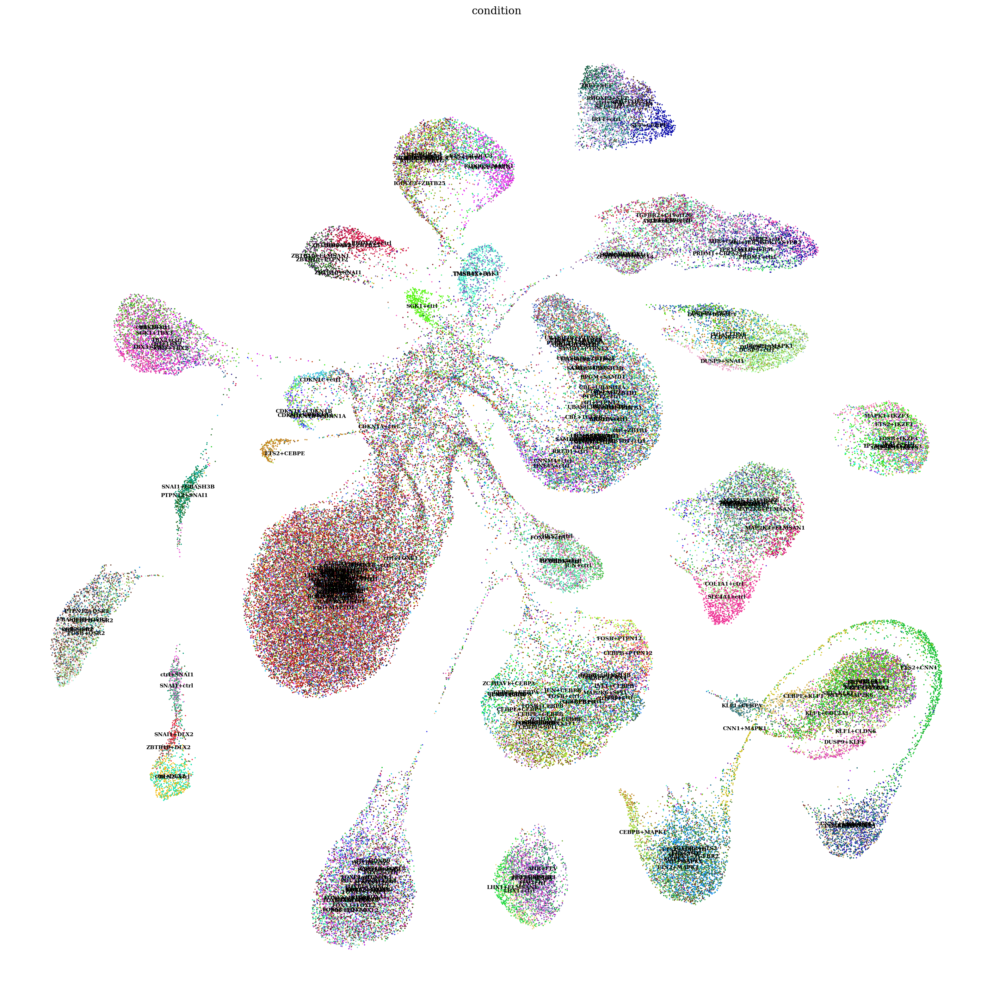

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

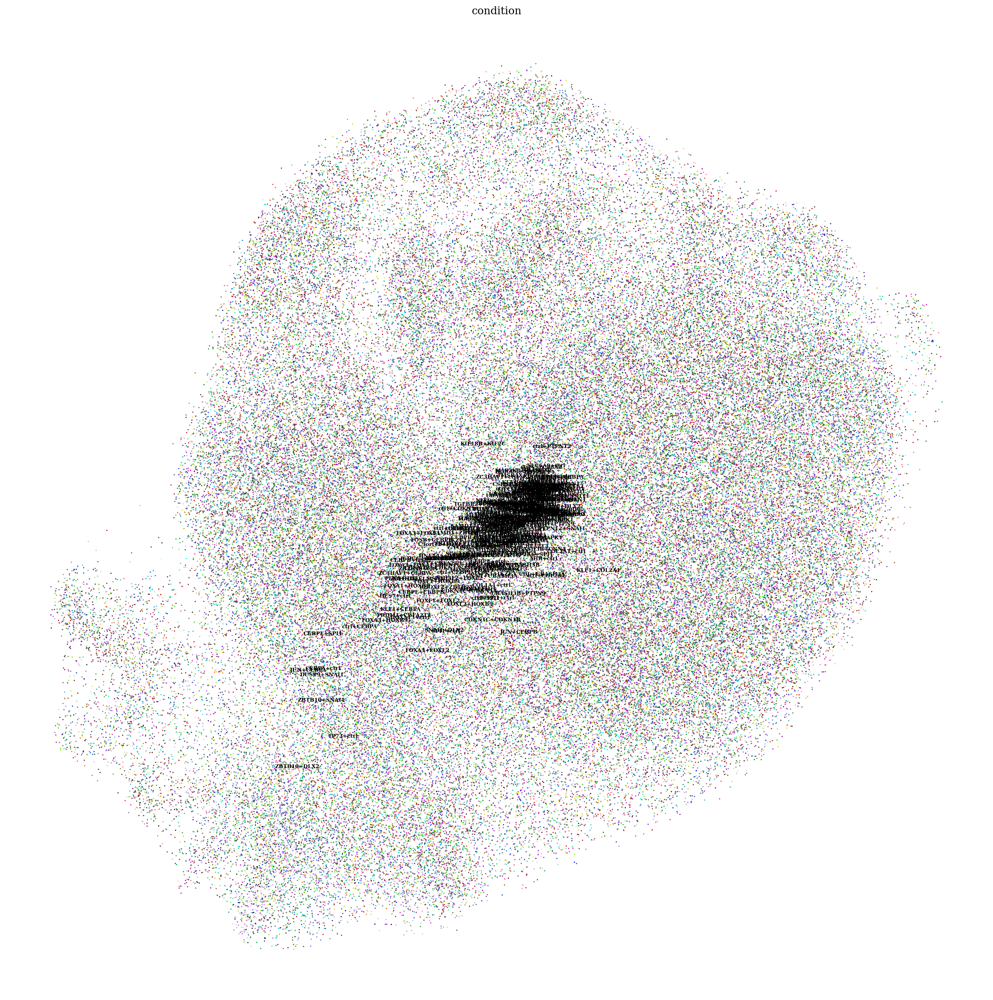

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()